## SDG 7 objective: "Ensure access to affordable, secure, sustainable and modern energy for all."

- ¿Cómo aumentar el uso de energías renovables, mejorar el acceso a la electricidad en áreas rurales o promover la eficiencia energética?

Energy Consumption Trends: Analyze the data to identify trends in global energy consumption over time. This can help governments and organizations make informed decisions about energy policies, investments, and resource allocation.

Renewable Energy Adoption: Determine the adoption rate of renewable energy sources (such as solar, wind, and hydropower) across different countries and regions. This information can be valuable for assessing progress toward sustainable energy goals.

Carbon Emissions Analysis: Investigate the relationship between energy production methods and carbon emissions. Python data analysis can help in identifying sources of high emissions and formulating strategies for reducing carbon footprints.

## 1.DATA CLEANING- DATA WRANGLING

In [159]:
#Importing libraries
import pandas as pd 
import numpy as np
import seaborn as sns
from datetime import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pycountry_convert as pc
import plotly.graph_objects as go
import plotly.subplots as sp
import plotly.graph_objs as go
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from math import sqrt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.cluster import KMeans
pd.set_option('display.max_columns', None)
%matplotlib inline

In [160]:
#Loading,reading and storing dataset
df = pd.read_csv('global_data.csv')
df.head(5)

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,Financial flows to developing countries (US $),Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),Low-carbon electricity (% electricity),Primary energy consumption per capita (kWh/person),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,Renewables (% equivalent primary energy),gdp_growth,gdp_per_capita,Density\n(P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953


### UNDERSTANDING DATA

**Entity**: The name of the country or region for which the data is reported.   
**Year**: The year for which the data is reported, ranging from 2000 to 2020.   
**Access to electricity (% of population)**: The percentage of population with access to electricity.   
**Access to clean fuels for cooking (% of population)**: The percentage of the population with primary reliance on clean fuels.   
**Renewable-electricity-generating-capacity-per-capita**: Installed Renewable energy capacity per person   
**Financial flows to developing countries (US)**: Aid and assistance from developed countries for clean energy projects.   
**Renewable energy share in total final energy consumption (%)**: Percentage of renewable energy in final energy consumption.   
**Electricity from fossil fuels (TWh)**: Electricity generated from fossil fuels (coal, oil, gas) in terawatt-hours.   
**Electricity from nuclear (TWh)**: Electricity generated from nuclear power in terawatt-hours.   
**Electricity from renewables (TWh)**: Electricity generated from renewable sources (hydro, solar, wind, etc.) in terawatt-hours.   
**Low-carbon electricity (% electricity)**: Percentage of electricity from low-carbon sources (nuclear and renewables).    
**Primary energy consumption per capita (kWh/person)**: Energy consumption per person in kilowatt-hours.   
**Energy intensity level of primary energy (MJ/$2011 PPP GDP)**: Energy use per unit of GDP at purchasing power parity.   
**Value_co2_emissions (metric tons per capita)**: Carbon dioxide emissions per person in metric tons.   
**Renewables(% equivalent primary energy)**: Equivalent primary energy that is derived from renewable sources.   
**GDP growth (annual %)**: Annual GDP growth rate based on constant local currency.   
**GDP per capita**: Gross domestic product per person.   
**Density (P/Km2)**: Population density in persons per square kilometer.   
**Land Area (Km2)**: Total land area in square kilometers.   
**Latitude**: Latitude of the country's centroid in decimal degrees.   
**Longitude**: Longitude of the country's centroid in decimal degrees.  

In [161]:
#Show the DataFrame's shape
df.shape

(3649, 21)

In [162]:
 # Standardize column names
df.columns=[e.lower().replace(' ', '').replace('-', '_') for e in df.columns]  
df.columns

Index(['entity', 'year', 'accesstoelectricity(%ofpopulation)',
       'accesstocleanfuelsforcooking',
       'renewable_electricity_generating_capacity_per_capita',
       'financialflowstodevelopingcountries(us$)',
       'renewableenergyshareinthetotalfinalenergyconsumption(%)',
       'electricityfromfossilfuels(twh)', 'electricityfromnuclear(twh)',
       'electricityfromrenewables(twh)', 'low_carbonelectricity(%electricity)',
       'primaryenergyconsumptionpercapita(kwh/person)',
       'energyintensitylevelofprimaryenergy(mj/$2017pppgdp)',
       'value_co2_emissions_kt_by_country',
       'renewables(%equivalentprimaryenergy)', 'gdp_growth', 'gdp_per_capita',
       'density\n(p/km2)', 'landarea(km2)', 'latitude', 'longitude'],
      dtype='object')

In [163]:
df = df.rename(columns = {"density\\n(p/km2)":"density(P/km2)",
                  "value_co2_emissions_kt_by_country":"CO2_emissions_value_by_country_kt",
                  "accesstocleanfuelsforcooking":"access_to_clean_fuels_for_cooking",
                  "financialflowstodevelopingcountries(us$)":"financial_flows_to_developing_countries(us$)",
                  "renewableenergyshareinthetotalfinalenergyconsumption(%)":"renewable_energy_share_in_the_total_final_energy_consumption(%)",
                  "electricityfromfossilfuels(twh)":"electricity_from_fossil_fuels(twh)",
                  "primaryenergyconsumptionpercapita(kwh/person)":"primary_energy_consumption_per_capita(kwh/person)",
                  "energyintensitylevelofprimaryenergy(mj/$2017pppgdp)":"energy_intensity_level_of_primary_energy(mj/$2017pppgdp)",
                  "renewables(%equivalentprimaryenergy)": "renewables(%equivalent_primary_energy)",
                  "accesstoelectricity(%ofpopulation)":"access_to_electricity(%_of_population)",
                  "electricityfromnuclear(twh)":"electricity_from_nuclear(twh)",   
                  "electricityfromrenewables(twh)":"electricity_from_renewables(twh)"
               
                  })

In [164]:
df.head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),latitude,longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953


In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3649 entries, 0 to 3648
Data columns (total 21 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   entity                                                           3649 non-null   object 
 1   year                                                             3649 non-null   int64  
 2   access_to_electricity(%_of_population)                           3639 non-null   float64
 3   access_to_clean_fuels_for_cooking                                3480 non-null   float64
 4   renewable_electricity_generating_capacity_per_capita             2718 non-null   float64
 5   financial_flows_to_developing_countries(us$)                     1560 non-null   float64
 6   renewable_energy_share_in_the_total_final_energy_consumption(%)  3455 non-null   float64
 7   electricity_from_fossil_fuels(twh)        

In [166]:
#df['year'] = pd.to_datetime(df['year'], format='%Y')

In [167]:
# Llena los valores faltantes con ceros
#df['density(P/km2)'].fillna(0, inplace=True)
#df['density(P/km2)'] = df['density(P/km2)'].str.replace(',', '', regex=True)  # Elimina las comas, si las hay
#df['density(P/km2)'] = df['density(P/km2)'].astype(int)

In [168]:
#Checking for duplicate rows in the data to remove if any
df.duplicated().sum()

0

In [169]:
##hecking null values
df.isnull().sum().sort_values(ascending=False)

renewables(%equivalent_primary_energy)                             2137
financial_flows_to_developing_countries(us$)                       2089
renewable_electricity_generating_capacity_per_capita                931
CO2_emissions_value_by_country_kt                                   428
gdp_growth                                                          317
gdp_per_capita                                                      282
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            207
renewable_energy_share_in_the_total_final_energy_consumption(%)     194
access_to_clean_fuels_for_cooking                                   169
electricity_from_nuclear(twh)                                       126
low_carbonelectricity(%electricity)                                  42
electricity_from_renewables(twh)                                     21
electricity_from_fossil_fuels(twh)                                   21
access_to_electricity(%_of_population)                          

In [170]:
#Checking % of null values
null_percentage = [(col, 100 * sum(df[col].isnull()) / len(df[col])) for col in df.columns]

# Sort list of tuples by percentage of null values from largest to smallest
sorted_null_percentage = sorted(null_percentage, key=lambda x: x[1], reverse=True)

# Print the ordered list
print("Nulls (sorted by percentage descending):")
for col, percentage in sorted_null_percentage:
    print(f"{col} contains {percentage:.2f}%")

Nulls (sorted by percentage descending):
renewables(%equivalent_primary_energy) contains 58.56%
financial_flows_to_developing_countries(us$) contains 57.25%
renewable_electricity_generating_capacity_per_capita contains 25.51%
CO2_emissions_value_by_country_kt contains 11.73%
gdp_growth contains 8.69%
gdp_per_capita contains 7.73%
energy_intensity_level_of_primary_energy(mj/$2017pppgdp) contains 5.67%
renewable_energy_share_in_the_total_final_energy_consumption(%) contains 5.32%
access_to_clean_fuels_for_cooking contains 4.63%
electricity_from_nuclear(twh) contains 3.45%
low_carbonelectricity(%electricity) contains 1.15%
electricity_from_fossil_fuels(twh) contains 0.58%
electricity_from_renewables(twh) contains 0.58%
access_to_electricity(%_of_population) contains 0.27%
density(P/km2) contains 0.03%
landarea(km2) contains 0.03%
latitude contains 0.03%
longitude contains 0.03%
entity contains 0.00%
year contains 0.00%
primary_energy_consumption_per_capita(kwh/person) contains 0.00%


In [171]:
# Number of zero values in the dataset (in percent)
missing_values_df = df.isnull().sum() / df.shape[0] * 100.00
print(round(missing_values_df),2)

entity                                                              0.0
year                                                                0.0
access_to_electricity(%_of_population)                              0.0
access_to_clean_fuels_for_cooking                                   5.0
renewable_electricity_generating_capacity_per_capita               26.0
financial_flows_to_developing_countries(us$)                       57.0
renewable_energy_share_in_the_total_final_energy_consumption(%)     5.0
electricity_from_fossil_fuels(twh)                                  1.0
electricity_from_nuclear(twh)                                       3.0
electricity_from_renewables(twh)                                    1.0
low_carbonelectricity(%electricity)                                 1.0
primary_energy_consumption_per_capita(kwh/person)                   0.0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            6.0
CO2_emissions_value_by_country_kt                               

There are two feautures with a rather large number of zero values:

- Renewables (% equivalent to primary energy) - 59.0%.
- Financial flows to developing countries (US $) - 57.0%.
Cleaning can cause significant errors in the study, as more than 57% of the data will be removed.

In [172]:
df.isnull().sum().sort_values(ascending=False)

renewables(%equivalent_primary_energy)                             2137
financial_flows_to_developing_countries(us$)                       2089
renewable_electricity_generating_capacity_per_capita                931
CO2_emissions_value_by_country_kt                                   428
gdp_growth                                                          317
gdp_per_capita                                                      282
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            207
renewable_energy_share_in_the_total_final_energy_consumption(%)     194
access_to_clean_fuels_for_cooking                                   169
electricity_from_nuclear(twh)                                       126
low_carbonelectricity(%electricity)                                  42
electricity_from_renewables(twh)                                     21
electricity_from_fossil_fuels(twh)                                   21
access_to_electricity(%_of_population)                          

In [173]:
#Añadimos columna de continente  al dataset para poder filtrar y hacer analisis 
#Creating a column 'Continent'

def country_to_continent(country_name):
    country_alpha2 = pc.country_name_to_country_alpha2(country_name)
    country_continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
    country_continent_name = pc.convert_continent_code_to_continent_name(country_continent_code)
    return country_continent_name

df['continent'] = df['entity'].apply(country_to_continent)
df.head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),latitude,longitude,continent
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953,Asia
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953,Asia
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953,Asia
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953,Asia
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953,Asia


In [174]:
#Eliminamos lso dos continentes que vamos a dejar fuera del analisis y las columnas latitude y longitud
continentes_a_eliminar = ['Oceania', 'Africa']
df = df[~df['continent'].isin(continentes_a_eliminar)]

In [175]:
columnas_delete = ['latitude', 'longitude']
df = df.drop(columns=columnas_delete)
df.head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,Asia
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,Asia
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,Asia
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,Asia
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,Asia


In [176]:
df.shape

(2360, 20)

In [177]:
df.isnull().sum().sort_values(ascending=False)

financial_flows_to_developing_countries(us$)                       1527
renewables(%equivalent_primary_energy)                              974
renewable_electricity_generating_capacity_per_capita                889
CO2_emissions_value_by_country_kt                                   303
gdp_growth                                                          184
gdp_per_capita                                                      180
renewable_energy_share_in_the_total_final_energy_consumption(%)     133
access_to_clean_fuels_for_cooking                                   127
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            118
electricity_from_nuclear(twh)                                       105
low_carbonelectricity(%electricity)                                  21
access_to_electricity(%_of_population)                                1
landarea(km2)                                                         1
density(P/km2)                                                  

In [178]:
#Vamos a agrupar los continentes elegidos para el analisis en distintos df para seguir tratando nulos y outliers según sus características especiales
# Supongamos que ya tienes un DataFrame llamado 'df' con las columnas 'Country' y 'Continent'

# Agrupar el DataFrame por la columna 'Continent'
continent_groups = df.groupby('continent')

# Crear diccionarios para almacenar DataFrames separados por continente
continents = ['Europe', 'Asia', 'North America', 'South America',]

continent_data = {}

# Iterar sobre los grupos y almacenarlos en los diccionarios
for continent in continents:
    if continent in continent_groups.groups:
        continent_data[continent] = continent_groups.get_group(continent)

In [179]:
continent_data['Europe'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
21,Albania,2000,100.0,38.2,NaN,NaN,NaN,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,NaN,6.946217,1126.683340,105,28748.0,Europe
22,Albania,2001,100.0,40.5,NaN,NaN,NaN,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,NaN,8.293313,1281.659826,105,28748.0,Europe
23,Albania,2002,100.0,43.2,NaN,NaN,NaN,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,NaN,4.536524,1425.124219,105,28748.0,Europe
24,Albania,2003,100.0,46.4,NaN,NaN,NaN,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,NaN,5.528637,1846.120121,105,28748.0,Europe
25,Albania,2004,100.0,49.0,NaN,NaN,NaN,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,NaN,5.514668,2373.581292,105,28748.0,Europe


In [180]:
continent_data['Europe'].shape

(763, 20)

In [185]:
continent_data['Europe'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [186]:
#Rellenamos columnas de nulos con 0 
continent_data['Europe']['financial_flows_to_developing_countries(us$)'].fillna(0, inplace=True)
continent_data['Europe']['renewables(%equivalent_primary_energy)'].fillna(0, inplace=True)
continent_data['Europe']['renewable_electricity_generating_capacity_per_capita'].fillna(0, inplace=True)
continent_data['Europe']['CO2_emissions_value_by_country_kt'].fillna(0, inplace=True)

In [187]:
continent_data['Europe'] = continent_data['Europe'].interpolate(method='pad')

In [188]:
continent_data['Europe']['renewable_energy_share_in_the_total_final_energy_consumption(%)'].fillna(0, inplace=True)

In [189]:
#Save numerical data of europe
df_num_europe= continent_data['Europe'].select_dtypes(exclude=["object"])
df_num_europe.head(2)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
21,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.0,0.0,6.946217,1126.683340,28748.0
22,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.0,0.0,8.293313,1281.659826,28748.0


In [190]:
df_num_europe = df_num_europe.reset_index(drop=True)

In [191]:
df_num_europe.isnull().sum().sort_values(ascending=False)

year                                                               0
low_carbonelectricity(%electricity)                                0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
electricity_from_renewables(twh)                                   0
access_to_electricity(%_of_population)                             0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_total_final_energy_consumption(%)    0
financial_flows_to_developing_countries(us$)                       0
renewable_electricity_generating_c

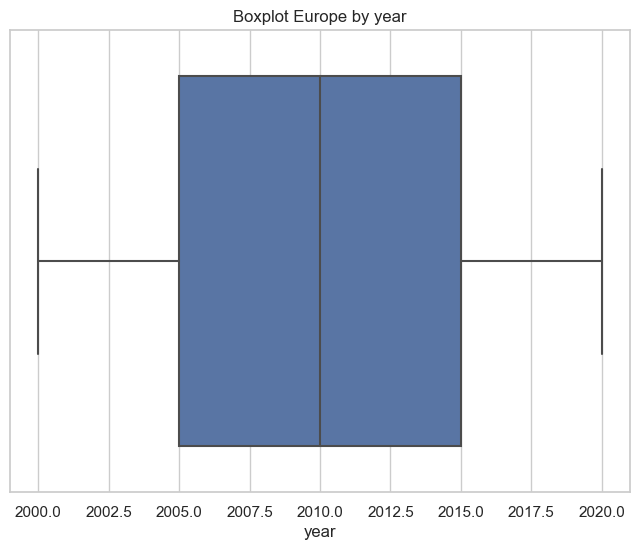

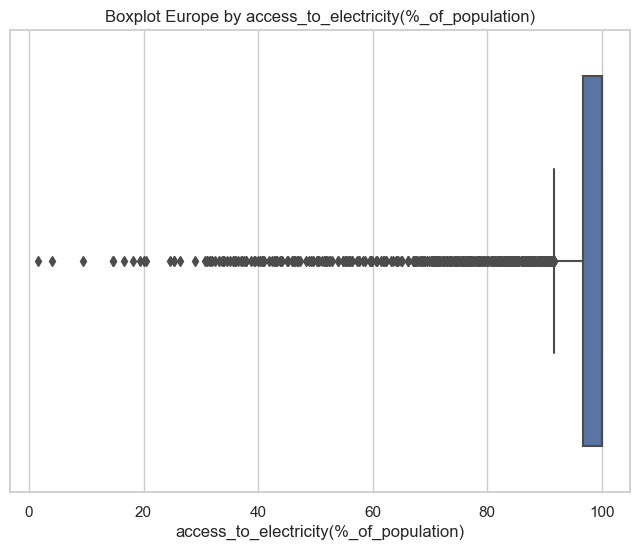

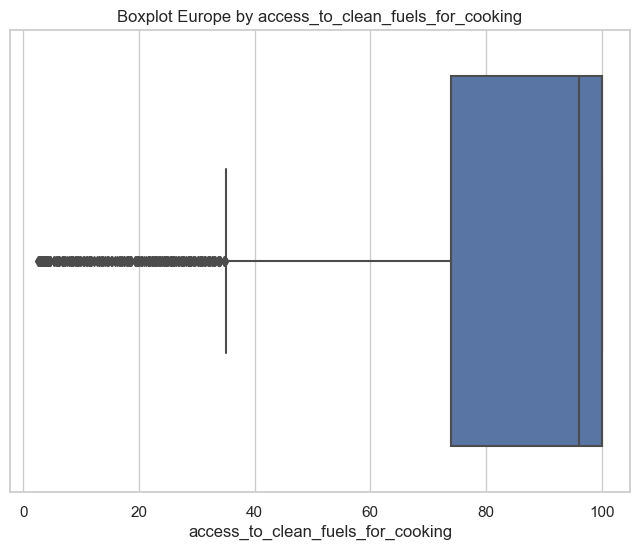

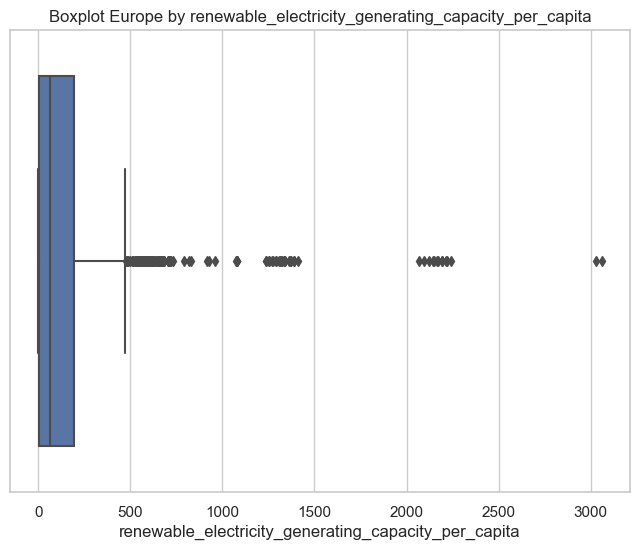

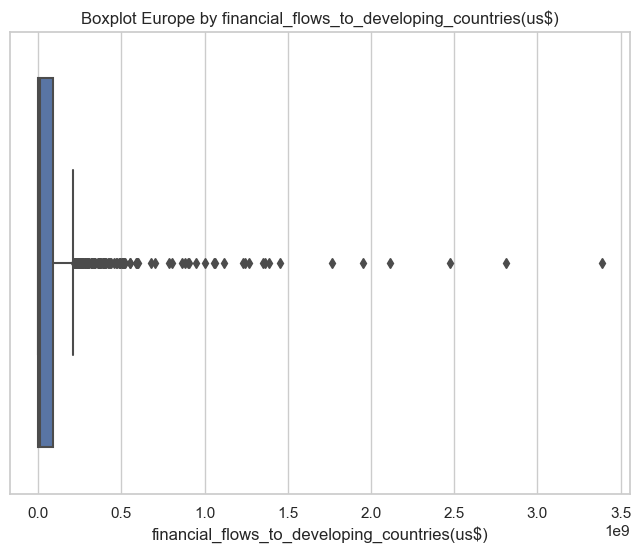

...

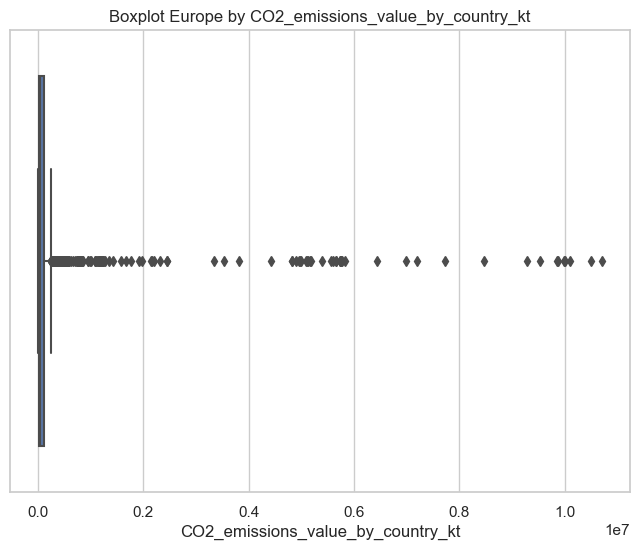

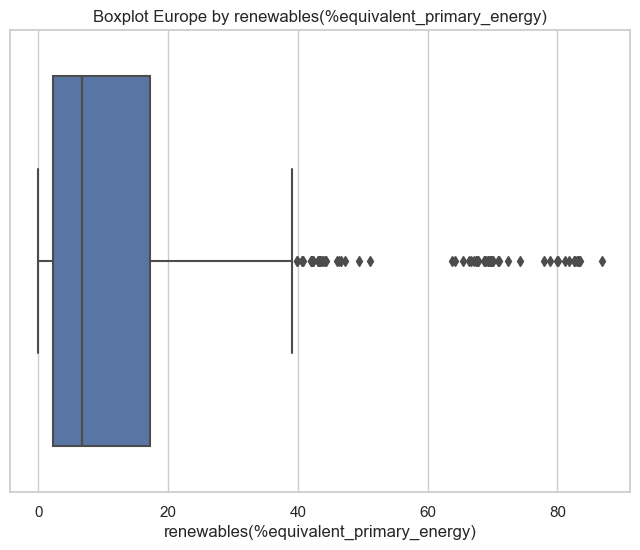

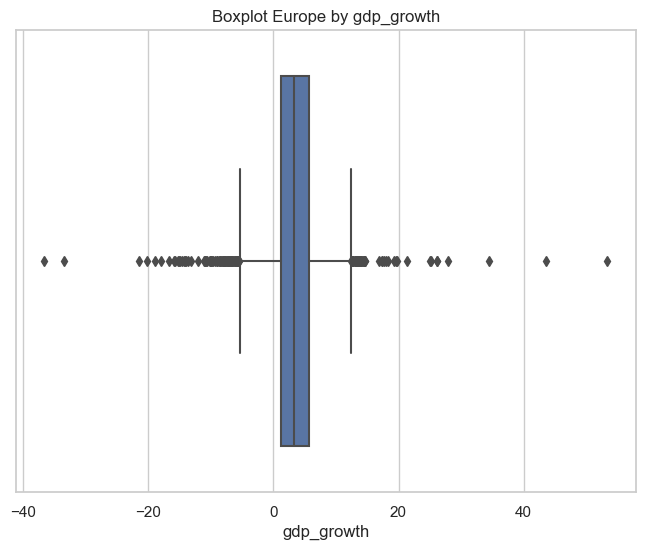

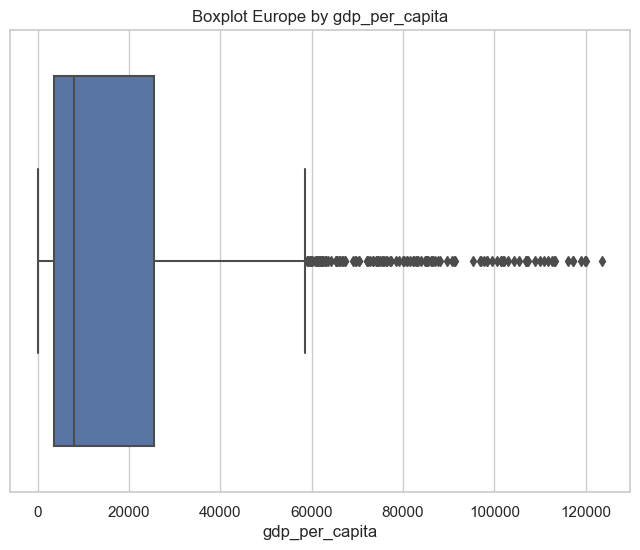

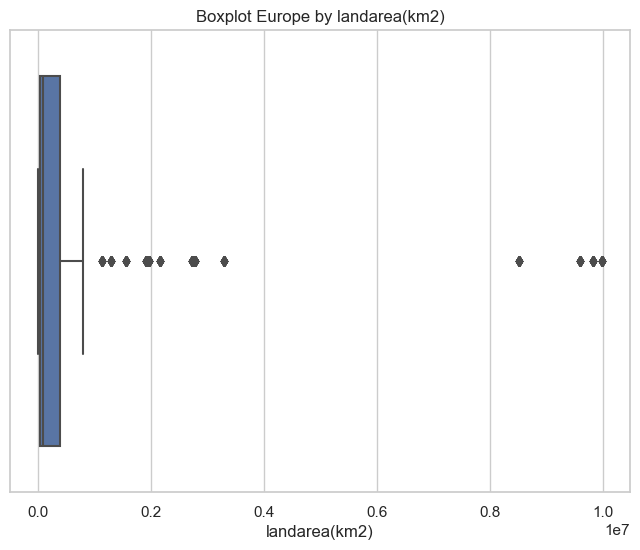

In [192]:
#CHECKING OUTLIERS
for col in df_num_europe.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot Europe by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

In [193]:
df_num_europe['access_to_electricity(%_of_population)'].describe()

count    763.000000
mean      99.981129
std        0.133596
min       97.700000
25%      100.000000
50%      100.000000
75%      100.000000
max      100.000000
Name: access_to_electricity(%_of_population), dtype: float64

In [194]:
columns_with_outliers_europe = []

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_europe.columns:
    if df_num_europe[column].dtype == 'float64' or df_num_europe[column].dtype == 'int64':
        Q1 = df_num_europe[column].quantile(0.25)
        Q3 = df_num_europe[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_europe[
            (df_num_europe[column] > upper_limit) |
            (df_num_europe[column] < lower_limit)
        ]

        if not outliers.empty:
            print(f"Columna: {column}")
            print(outliers)
            columns_with_outliers_europe.append(column)

# Mostrar las columnas con outliers
print("Columnas con outliers y número de outliers:")
for column, num_outliers in columns_with_outliers_europe.items():
    print(f"{column}: {num_outliers}")

Columna: access_to_electricity(%_of_population)
     year  access_to_electricity(%_of_population)  \
12   2012                               99.900000   
14   2014                               99.950000   
15   2015                               99.980000   
16   2016                               99.890000   
17   2017                               99.890000   
85   2001                               99.400000   
86   2002                               98.500000   
90   2006                               99.387276   
91   2007                               99.700000   
95   2011                               99.705780   
97   2013                               99.500000   
99   2015                               99.700000   
125  2020                               99.700000   
466  2011                               99.000000   
468  2013                               99.700000   
469  2014                               97.700000   
501  2004                               99.420000  

AttributeError: 'list' object has no attribute 'items'

In [195]:
#Totol number of outliers by column
column_outlier_total_eu = {}

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_europe.columns:
    if df_num_europe[column].dtype == 'float64' or df_num_europe[column].dtype == 'int64':
        Q1 = df_num_europe[column].quantile(0.25)
        Q3 = df_num_europe[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_europe[
            (df_num_europe[column] > upper_limit) |
            (df_num_europe[column] < lower_limit)
        ]

        num_outliers = len(outliers)
        column_outlier_total_eu[column] = num_outliers

# Mostrar el número total de outliers por columna
for column, num_outliers in column_outlier_total_eu.items():
    print(f"Número de outliers en {column}: {num_outliers}")

Número de outliers en year: 0
Número de outliers en access_to_electricity(%_of_population): 31
Número de outliers en access_to_clean_fuels_for_cooking: 175
Número de outliers en renewable_electricity_generating_capacity_per_capita: 0
Número de outliers en financial_flows_to_developing_countries(us$): 0
Número de outliers en renewable_energy_share_in_the_total_final_energy_consumption(%): 44
Número de outliers en electricity_from_fossil_fuels(twh): 99
Número de outliers en electricity_from_nuclear(twh): 111
Número de outliers en electricity_from_renewables(twh): 100
Número de outliers en low_carbonelectricity(%electricity): 0
Número de outliers en primary_energy_consumption_per_capita(kwh/person): 54
Número de outliers en energy_intensity_level_of_primary_energy(mj/$2017pppgdp): 45
Número de outliers en CO2_emissions_value_by_country_kt: 135
Número de outliers en renewables(%equivalent_primary_energy): 47
Número de outliers en gdp_growth: 76
Número de outliers en gdp_per_capita: 17
Núme

In [443]:
df_num_europe.shape

(763, 17)

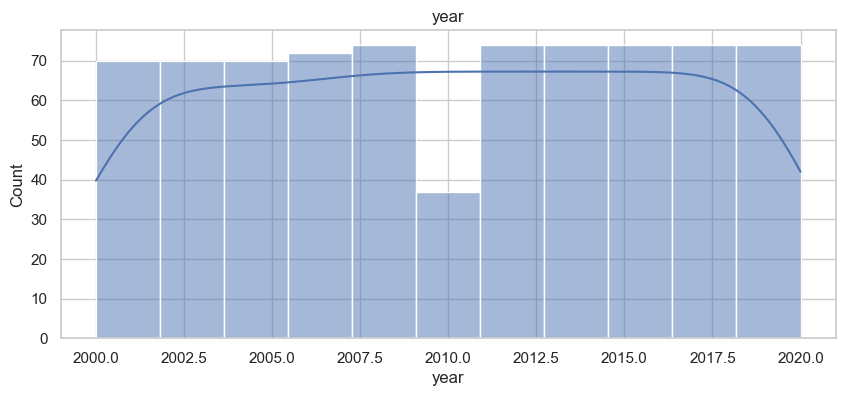

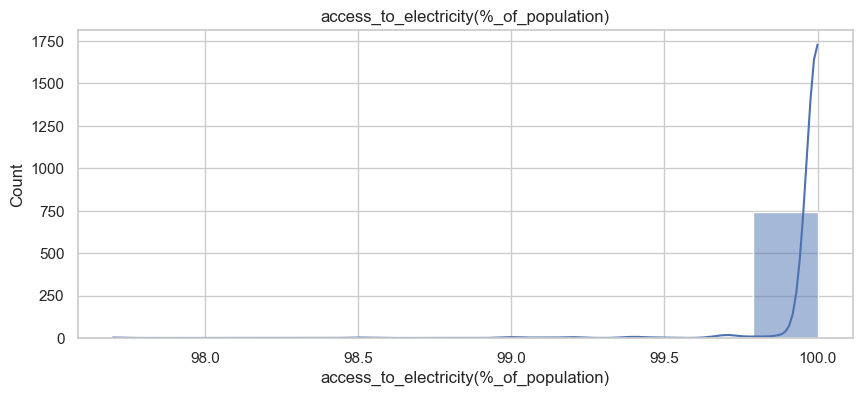

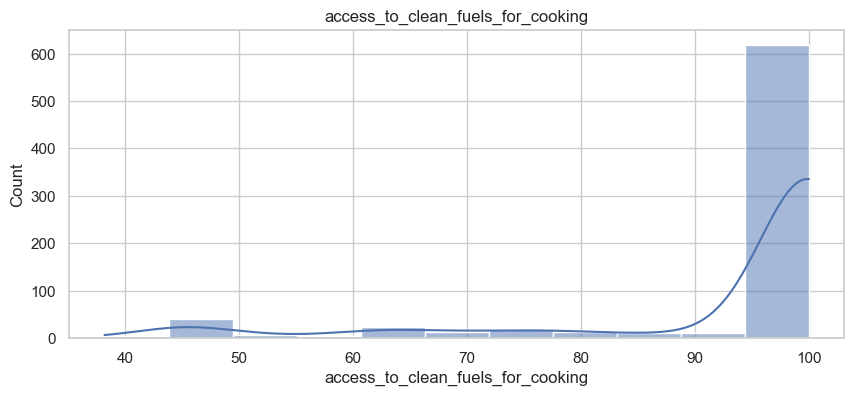

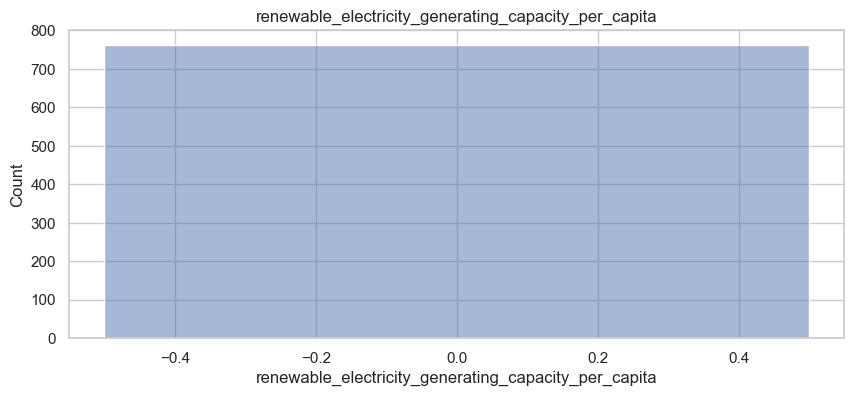

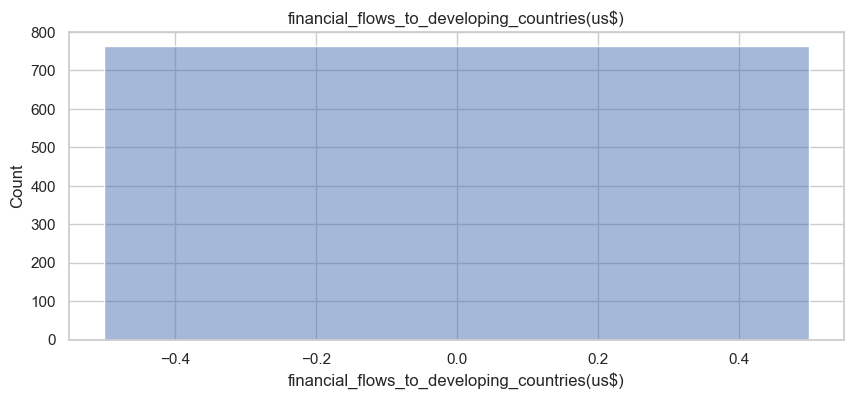

...

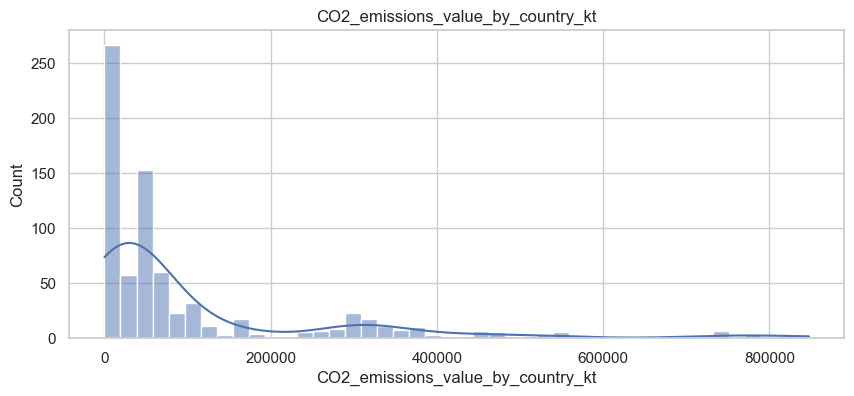

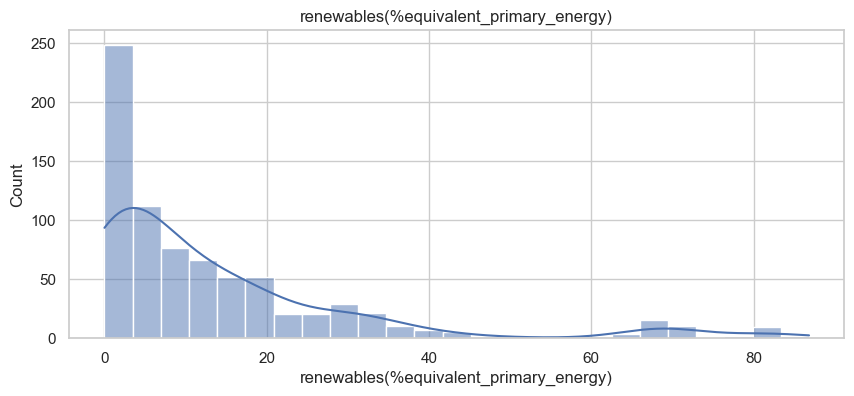

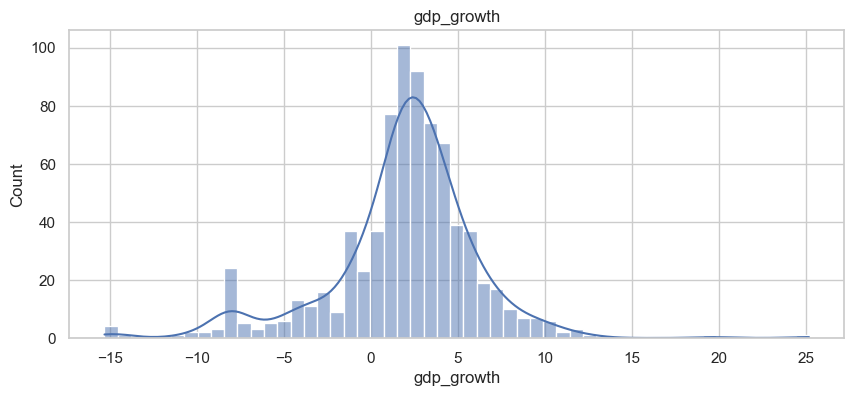

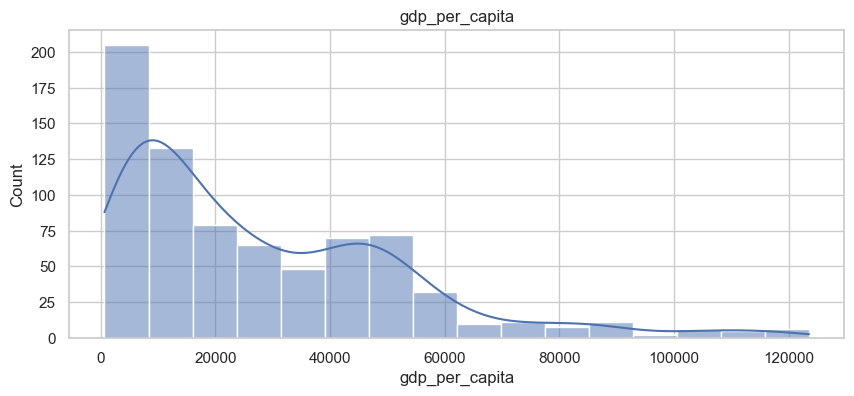

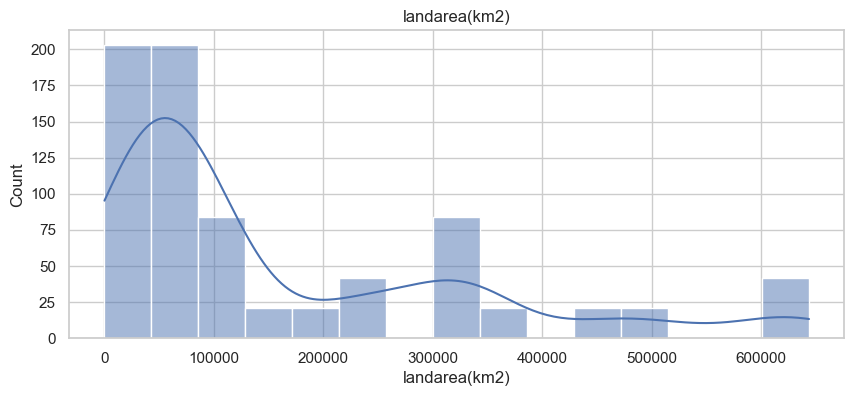

In [196]:
#CHECKING DISTRIBUTION
for c in df_num_europe.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_europe[c], kde= True)
    plt.title(c)
    plt.show()

In [197]:
continent_data['Asia'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,Asia
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,Asia
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,Asia
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,Asia
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,Asia


In [198]:
continent_data['Asia'].shape

(819, 20)

In [199]:
continent_data['Asia'].isnull().sum().sort_values(ascending=False)

financial_flows_to_developing_countries(us$)                       356
renewables(%equivalent_primary_energy)                             315
CO2_emissions_value_by_country_kt                                   99
electricity_from_nuclear(twh)                                       84
renewable_electricity_generating_capacity_per_capita                63
gdp_growth                                                          47
gdp_per_capita                                                      45
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            43
renewable_energy_share_in_the_total_final_energy_consumption(%)     39
access_to_clean_fuels_for_cooking                                   21
entity                                                               0
landarea(km2)                                                        0
density(P/km2)                                                       0
low_carbonelectricity(%electricity)                                  0
primar

In [200]:
continent_data['Asia'] = continent_data['Asia'].interpolate(method='pad')

In [204]:
continent_data['Asia'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [205]:
continent_data['Asia']['gdp_per_capita'].fillna(0, inplace=True)
continent_data['Asia']['gdp_growth'].fillna(0, inplace=True)
continent_data['Asia']['renewables(%equivalent_primary_energy)'].fillna(0, inplace=True)

In [206]:
#Save numerical data of Asia
df_num_asia= continent_data['Asia'].select_dtypes(exclude=["object"])
df_num_asia

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,1.613591,6.20,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.640000,760.000000,0.000000,0.000000,0.000000,652230.0
1,2001,4.074574,7.20,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.740000,730.000000,0.000000,0.000000,0.000000,652230.0
2,2002,9.409158,8.20,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.400000,1029.999971,0.000000,0.000000,179.426579,652230.0
3,2003,14.738506,9.50,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.400000,1220.000029,0.000000,8.832278,190.683814,652230.0
4,2004,20.064968,10.90,7.75,25970000.0,44.24,0.33,0.0,0.56,62.921350,204.23125,1.200000,1029.999971,0.000000,1.414118,211.382074,652230.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3602,2016,68.859505,61.20,2.94,18670000.0,2.48,4.36,0.0,0.16,3.539823,1432.55220,2.050356,116709.999100,2.523421,1.714771,1750.697113,527968.0
3603,2017,79.200000,61.35,3.59,10000.0,2.80,3.63,0.0,0.19,4.973822,1288.87670,2.050356,116709.999100,2.523421,1.714771,1750.697113,527968.0
3604,2018,62.000000,61.50,8.77,55730000.0,3.60,2.82,0.0,0.48,14.545455,1170.72610,2.050356,116709.999100,2.523421,1.714771,1750.697113,527968.0
3605,2019,72.751076,61.30,8.57,1200000.0,3.11,2.93,0.0,0.48,14.076246,1475.98520,2.050356,116709.999100,2.523421,1.714771,1750.697113,527968.0


In [207]:
df_num_asia = df_num_asia.reset_index(drop=True)

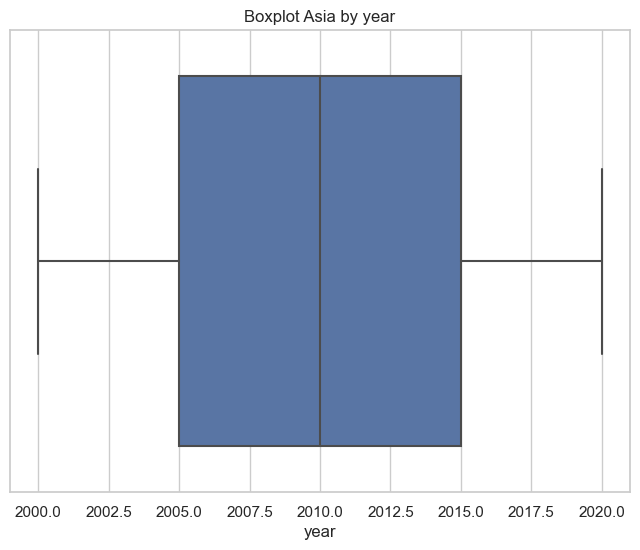

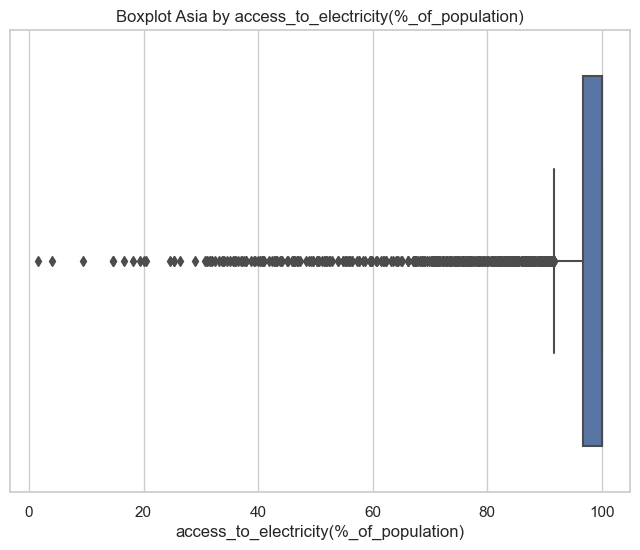

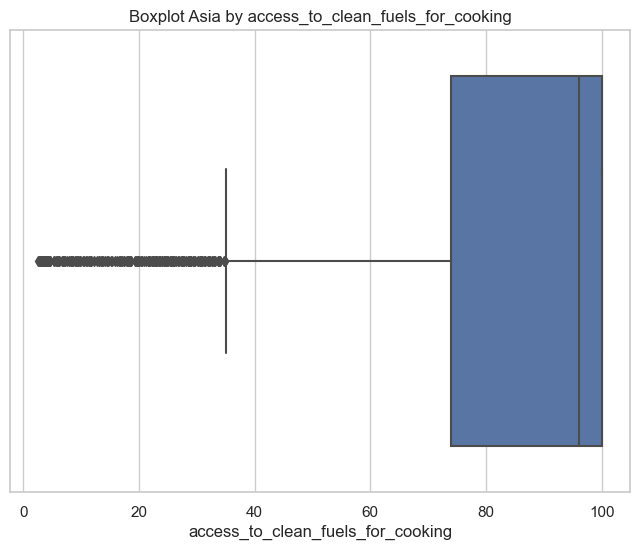

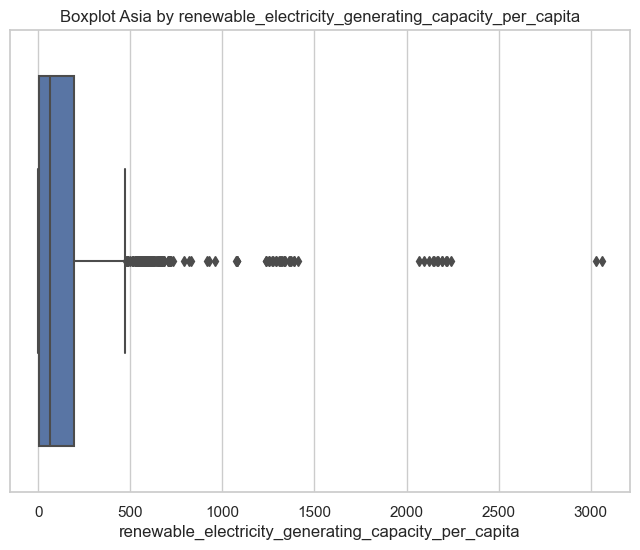

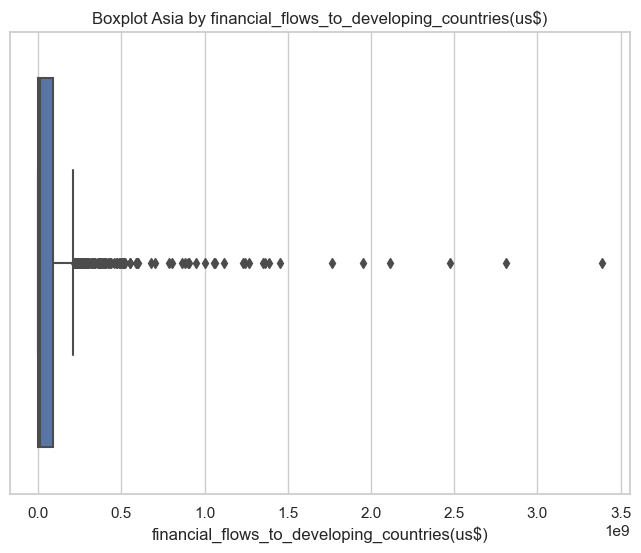

...

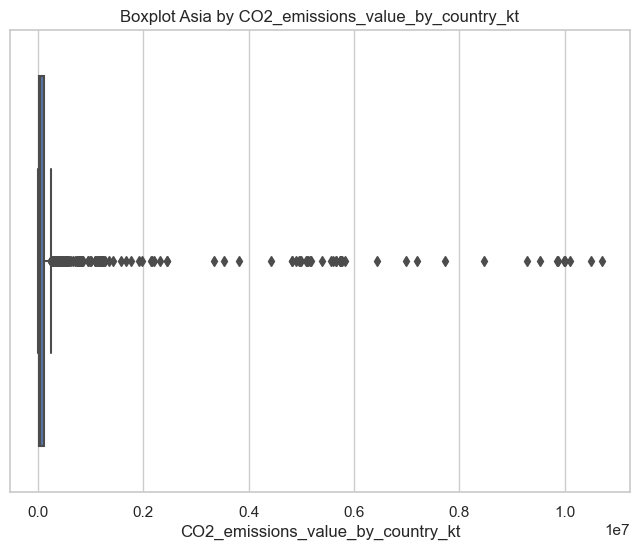

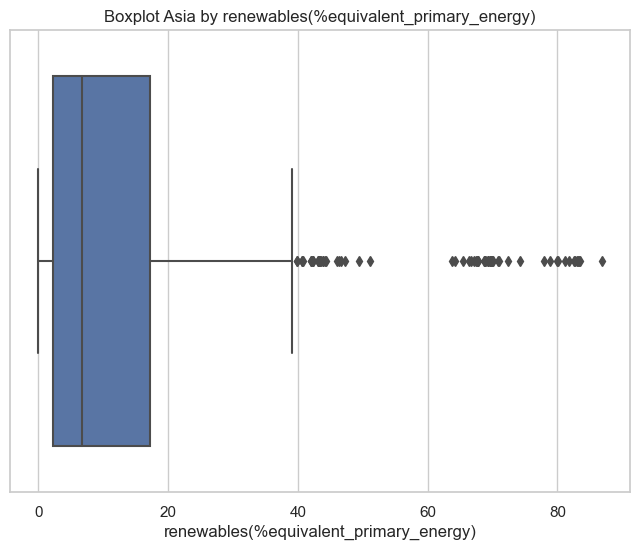

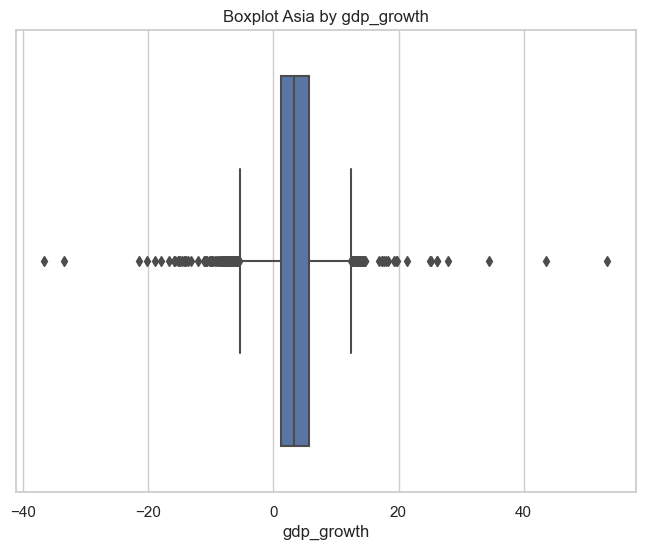

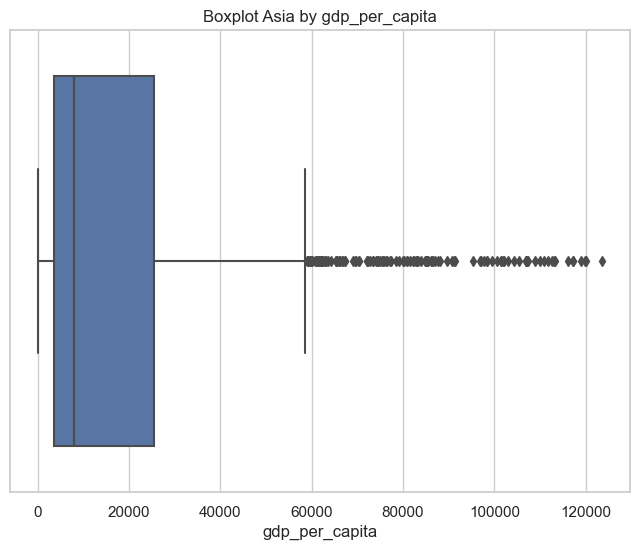

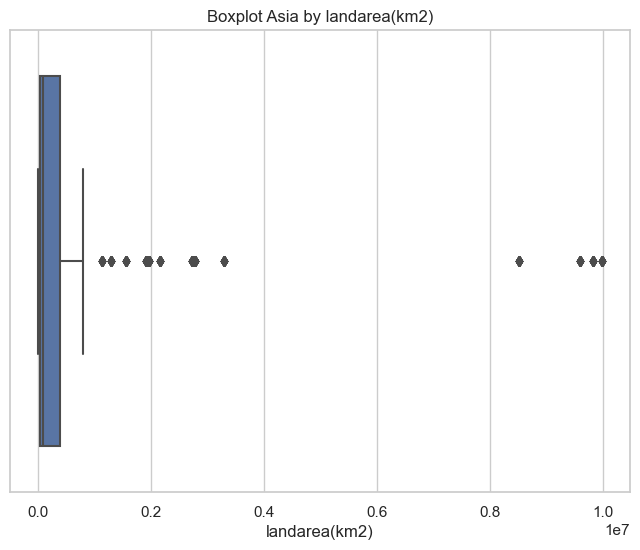

In [208]:
#CHECKING OUTLIERS
for col in df_num_asia.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot Asia by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

In [209]:
df_num_asia.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,819.000000,819.000000,819.000000,819.000000,8.190000e+02,819.000000,819.000000,819.000000,819.000000,819.000000,819.00000,819.000000,8.190000e+02,819.000000,819.000000,819.000000,8.190000e+02
mean,2010.000000,89.540016,70.617277,167.388669,1.099556e+08,20.984762,161.661331,9.334151,38.174103,25.889534,36163.68892,5.803985,3.540682e+05,4.477346,4.630280,11352.759007,7.493200e+05
std,6.059001,18.919985,31.708110,346.710720,2.395457e+08,26.365989,571.158550,41.483333,179.314413,32.790328,50354.61042,4.048257,1.313613e+06,4.951117,5.880122,15502.219185,1.626458e+06
min,2000.000000,1.613591,2.900000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,204.23125,1.200000,2.100000e+02,0.000000,-36.658153,0.000000,2.980000e+02
25%,2005.000000,87.550000,42.450000,7.095000,8.100000e+05,1.115000,3.175000,0.000000,0.040000,0.109167,5777.91030,3.445000,1.240500e+04,0.040307,2.175678,1286.232553,3.839400e+04
50%,2010.000000,99.604300,82.900000,55.080000,1.117000e+07,6.490000,21.950000,0.000000,2.240000,10.663012,16075.37400,4.820000,6.055000e+04,2.907140,5.007683,4021.743306,1.999510e+05
75%,2015.000000,100.000000,100.000000,120.570000,1.200950e+08,34.405000,73.460000,0.000000,11.510000,37.677067,36441.39650,6.660000,1.502500e+05,7.163172,7.298275,16551.940215,6.522300e+05
max,2020.000000,100.000000,100.000000,3060.190000,3.386850e+09,93.460000,5184.130000,366.200000,2184.940000,100.000010,262585.70000,32.570000,1.070722e+07,24.803470,53.381794,85075.986540,9.596960e+06


In [210]:
columns_with_outliers_asia = []

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_asia.columns:
    if df_num_asia[column].dtype == 'float64' or df_num_asia[column].dtype == 'int64':
        Q1 = df_num_asia[column].quantile(0.25)
        Q3 = df_num_asia[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_asia[
            (df_num_asia[column] > upper_limit) |
            (df_num_asia[column] < lower_limit)
        ]

        if not outliers.empty:
            print(f"Columna: {column}")
            print(outliers)
            columns_with_outliers_asia.append(column)

# Mostrar las columnas con outliers
print("Columnas con outliers y número de outliers:")
for column, num_outliers in columns_with_outliers_asia.items():
    print(f"{column}: {num_outliers}")

Columna: access_to_electricity(%_of_population)
     year  access_to_electricity(%_of_population)  \
0    2000                                1.613591   
1    2001                                4.074574   
2    2002                                9.409158   
3    2003                               14.738506   
4    2004                               20.064968   
..    ...                                     ...   
810  2012                               52.410000   
812  2014                               66.100000   
813  2015                               67.310930   
814  2016                               68.859505   
816  2018                               62.000000   

     access_to_clean_fuels_for_cooking  \
0                                  6.2   
1                                  7.2   
2                                  8.2   
3                                  9.5   
4                                 10.9   
..                                 ...   
810                  

AttributeError: 'list' object has no attribute 'items'

In [211]:
#Totol number of outliers by column Asia
column_outlier_total_asia = {}

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_asia.columns:
    if df_num_asia[column].dtype == 'float64' or df_num_asia[column].dtype == 'int64':
        Q1 = df_num_asia[column].quantile(0.25)
        Q3 = df_num_asia[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_asia[
            (df_num_asia[column] > upper_limit) |
            (df_num_asia[column] < lower_limit)
        ]

        num_outliers = len(outliers)
        column_outlier_total_asia[column] = num_outliers

# Mostrar el número total de outliers por columna
for column, num_outliers in column_outlier_total_asia.items():
    print(f"Número de outliers en {column}: {num_outliers}")

Número de outliers en year: 0
Número de outliers en access_to_electricity(%_of_population): 110
Número de outliers en access_to_clean_fuels_for_cooking: 0
Número de outliers en renewable_electricity_generating_capacity_per_capita: 142
Número de outliers en financial_flows_to_developing_countries(us$): 92
Número de outliers en renewable_energy_share_in_the_total_final_energy_consumption(%): 35
Número de outliers en electricity_from_fossil_fuels(twh): 91
Número de outliers en electricity_from_nuclear(twh): 126
Número de outliers en electricity_from_renewables(twh): 111
Número de outliers en low_carbonelectricity(%electricity): 60
Número de outliers en primary_energy_consumption_per_capita(kwh/person): 116
Número de outliers en energy_intensity_level_of_primary_energy(mj/$2017pppgdp): 44
Número de outliers en CO2_emissions_value_by_country_kt: 91
Número de outliers en renewables(%equivalent_primary_energy): 10
Número de outliers en gdp_growth: 59
Número de outliers en gdp_per_capita: 58
N

In [442]:
df_num_asia.shape

(819, 17)

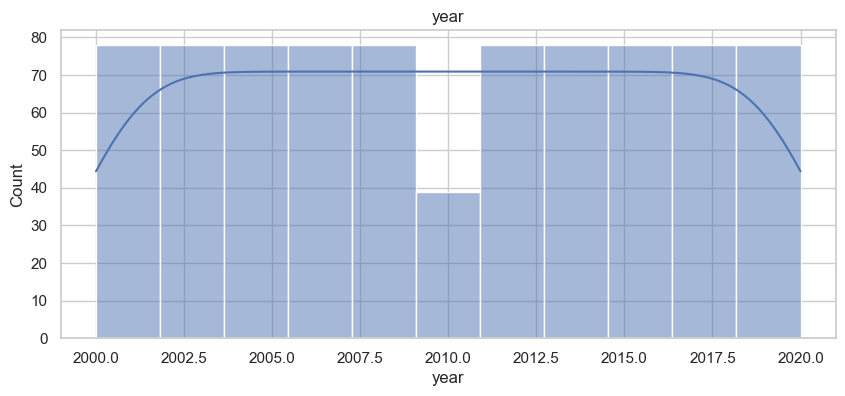

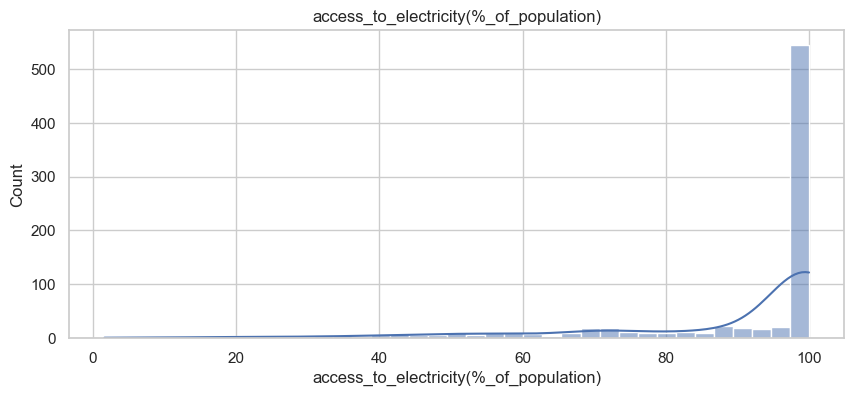

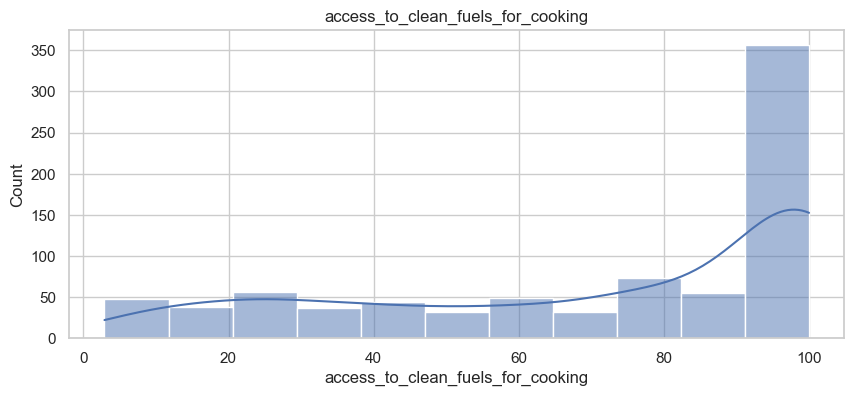

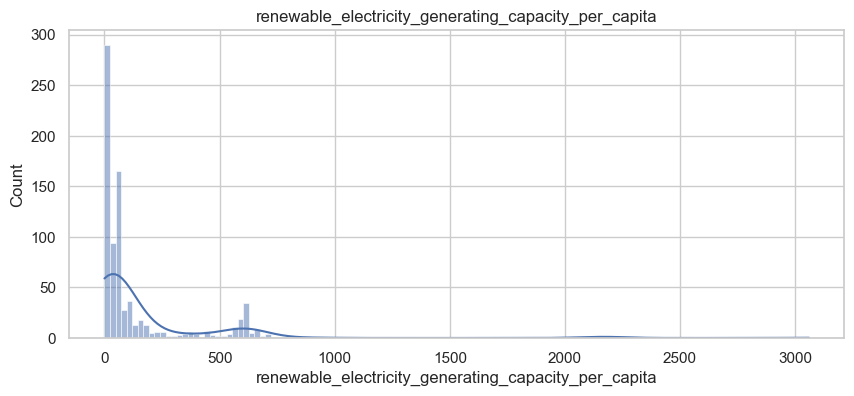

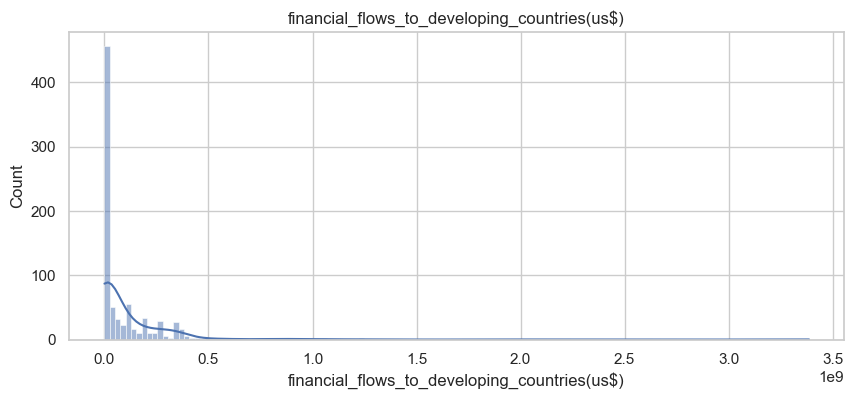

...

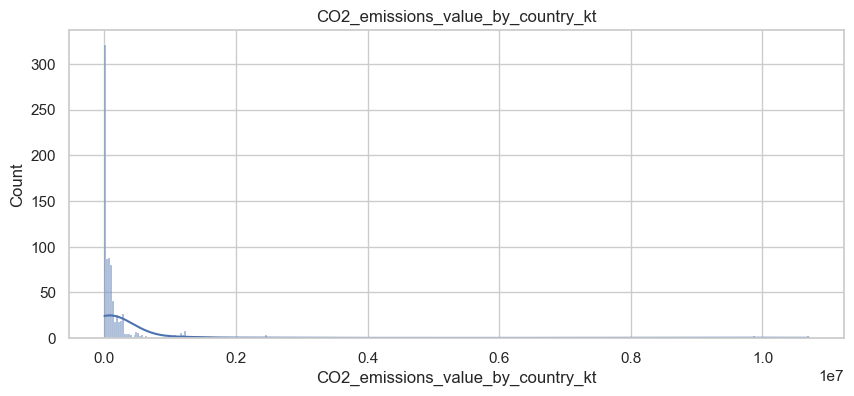

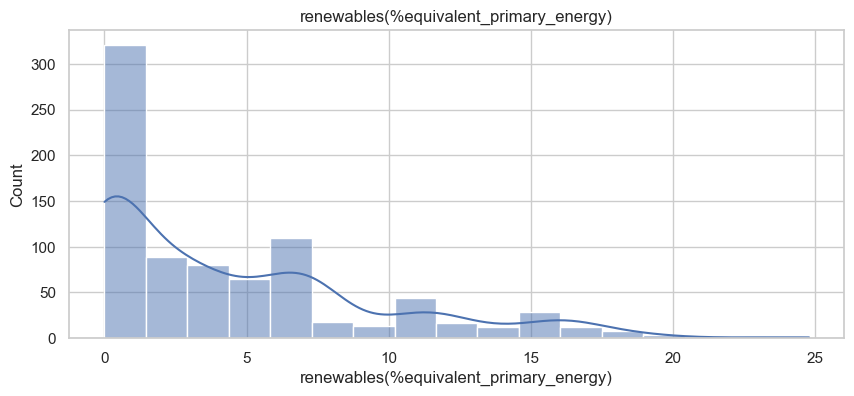

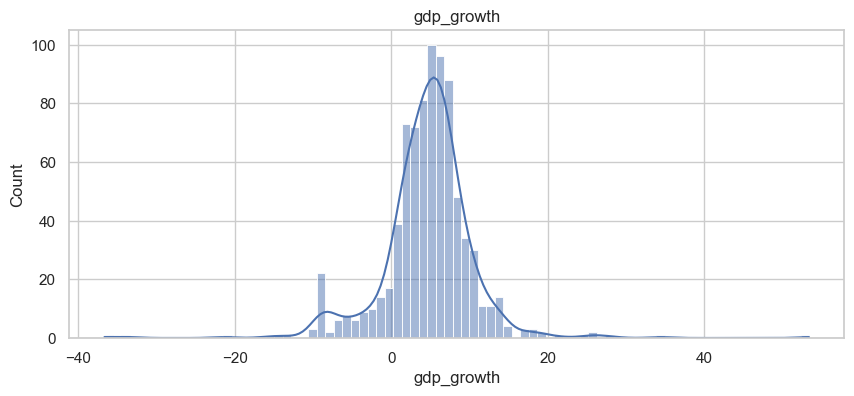

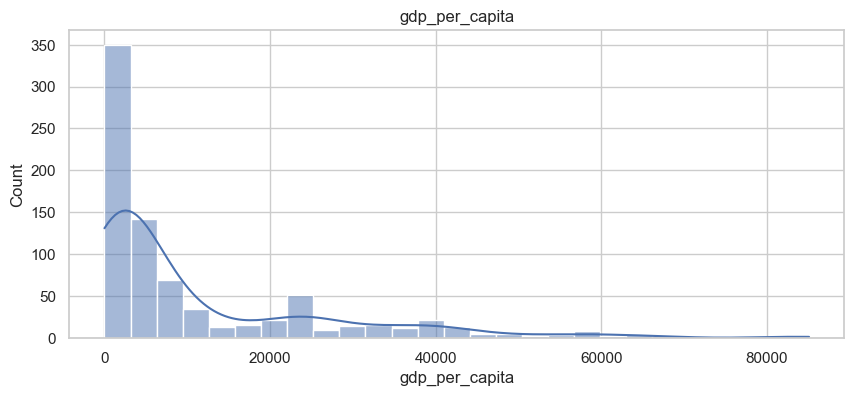

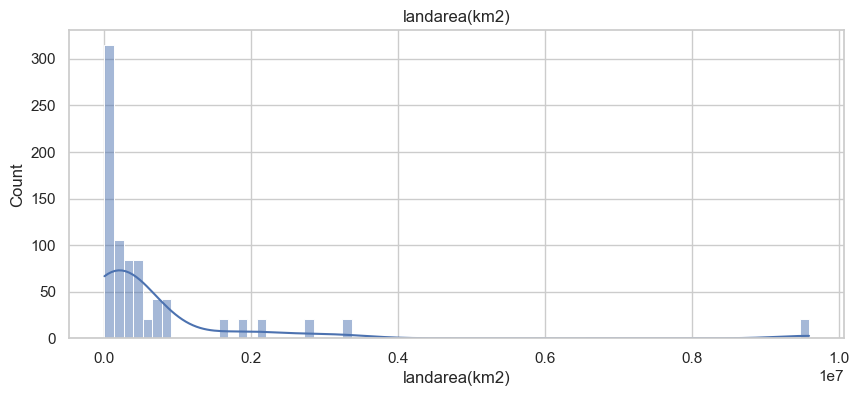

In [212]:
#CHECKING DISTRIBUTION
for c in df_num_asia.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_asia[c], kde= True)
    plt.title(c)
    plt.show()

In [213]:
continent_data['North America'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
84,Antigua and Barbuda,2000,97.689260,100.0,0.0,NaN,0.0,0.14,0.0,0.0,0.0,28457.223,3.13,330.000000,NaN,6.203431,10872.29295,223,443.0,North America
85,Antigua and Barbuda,2001,97.785255,100.0,0.0,NaN,0.0,0.16,0.0,0.0,0.0,28025.290,3.31,350.000000,NaN,-4.548003,10367.31961,223,443.0,North America
86,Antigua and Barbuda,2002,100.000000,100.0,0.0,NaN,0.0,0.18,0.0,0.0,0.0,29660.344,3.59,389.999986,NaN,1.027442,10401.05088,223,443.0,North America
87,Antigua and Barbuda,2003,97.956825,100.0,0.0,NaN,0.0,0.20,0.0,0.0,0.0,30824.252,3.63,409.999996,NaN,6.076544,10797.95106,223,443.0,North America
88,Antigua and Barbuda,2004,98.037100,100.0,0.0,NaN,0.0,0.21,0.0,0.0,0.0,31622.059,3.57,400.000006,NaN,5.767029,11446.96914,223,443.0,North America


In [214]:
continent_data['North America'].shape

(567, 20)

In [215]:
continent_data['North America'].isnull().sum().sort_values(ascending=False)

renewables(%equivalent_primary_energy)                             483
financial_flows_to_developing_countries(us$)                       348
CO2_emissions_value_by_country_kt                                  136
gdp_growth                                                          94
gdp_per_capita                                                      92
access_to_clean_fuels_for_cooking                                   84
renewable_electricity_generating_capacity_per_capita                63
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            27
renewable_energy_share_in_the_total_final_energy_consumption(%)     27
low_carbonelectricity(%electricity)                                 21
landarea(km2)                                                        0
density(P/km2)                                                       0
entity                                                               0
primary_energy_consumption_per_capita(kwh/person)                    0
year  

In [216]:
continent_data['North America'] = continent_data['North America'].interpolate(method='pad')
continent_data['North America']['renewables(%equivalent_primary_energy)'].fillna(0, inplace=True)
continent_data['North America']['financial_flows_to_developing_countries(us$)'].fillna(0, inplace=True)

In [217]:
continent_data['North America'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [218]:
#Save numerical data of Asia
df_num_north_america= continent_data['North America'].select_dtypes(exclude=["object"])
df_num_north_america

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
84,2000,97.689260,100.0,0.00,0.0,0.00,0.14,0.00,0.00,0.000000,28457.223,3.13,3.300000e+02,0.000000,6.203431,10872.29295,443.0
85,2001,97.785255,100.0,0.00,0.0,0.00,0.16,0.00,0.00,0.000000,28025.290,3.31,3.500000e+02,0.000000,-4.548003,10367.31961,443.0
86,2002,100.000000,100.0,0.00,0.0,0.00,0.18,0.00,0.00,0.000000,29660.344,3.59,3.900000e+02,0.000000,1.027442,10401.05088,443.0
87,2003,97.956825,100.0,0.00,0.0,0.00,0.20,0.00,0.00,0.000000,30824.252,3.63,4.100000e+02,0.000000,6.076544,10797.95106,443.0
88,2004,98.037100,100.0,0.00,0.0,0.00,0.21,0.00,0.00,0.000000,31622.059,3.57,4.000000e+02,0.000000,5.767029,11446.96914,443.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3518,2016,100.000000,100.0,2.15,3100000.0,9.46,2656.96,805.69,624.91,34.998875,78613.540,4.74,4.894500e+06,8.285086,1.711427,58021.40050,9833517.0
3519,2017,100.000000,100.0,2.15,3100000.0,9.92,2540.17,804.95,707.19,37.315506,78289.010,4.62,4.819370e+06,9.082049,2.332679,60109.65573,9833517.0
3520,2018,100.000000,100.0,2.15,3100000.0,10.12,2661.30,807.08,733.17,36.659092,80583.340,4.61,4.975310e+06,8.964939,2.996464,63064.41841,9833517.0
3521,2019,100.000000,100.0,2.15,3100000.0,10.42,2588.21,809.41,760.76,37.759180,79489.016,4.51,4.817720e+06,9.315263,2.161177,65279.52903,9833517.0


In [219]:
df_num_north_america = df_num_north_america.reset_index(drop=True)

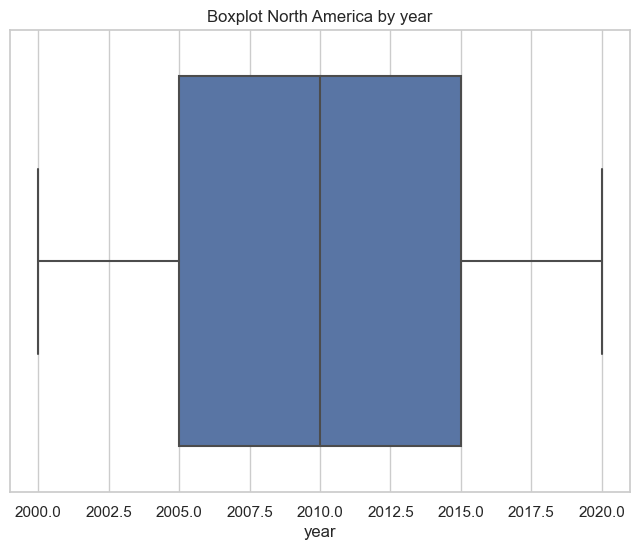

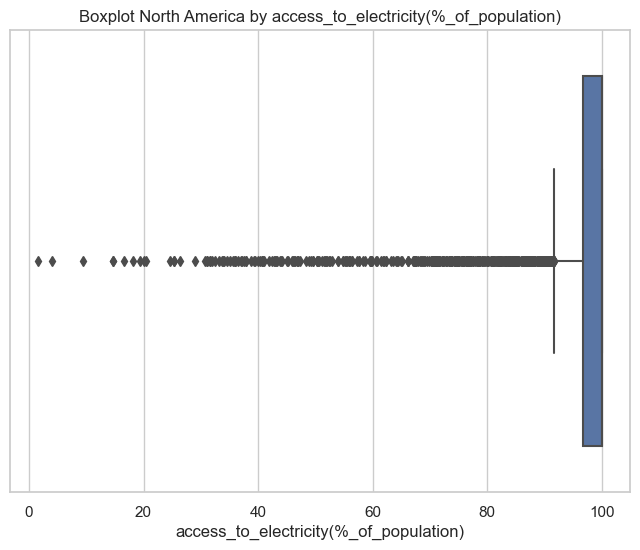

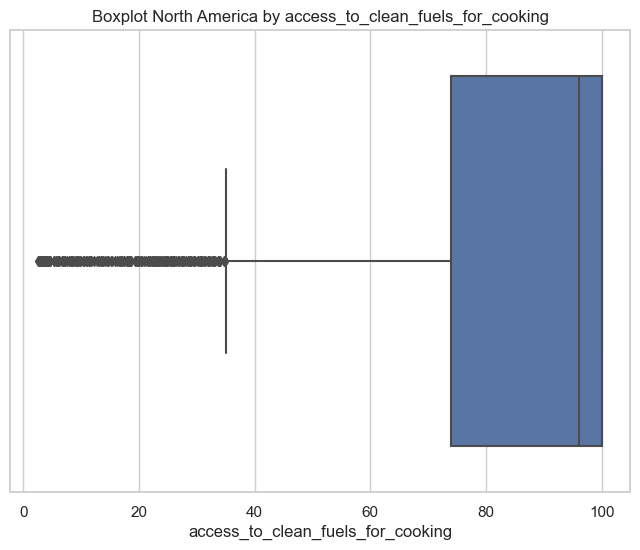

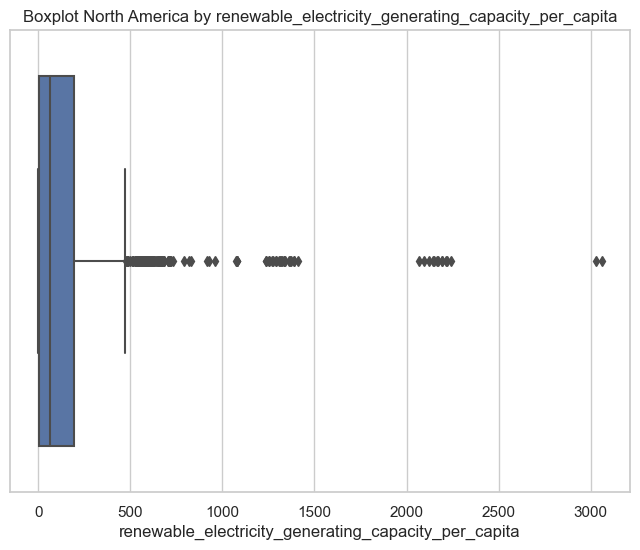

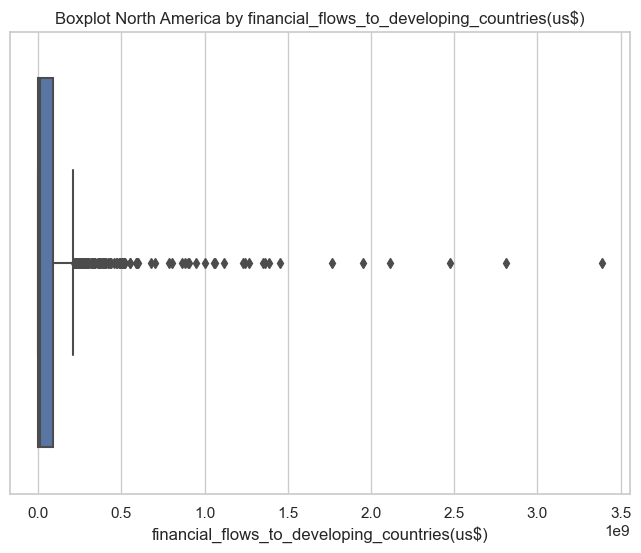

...

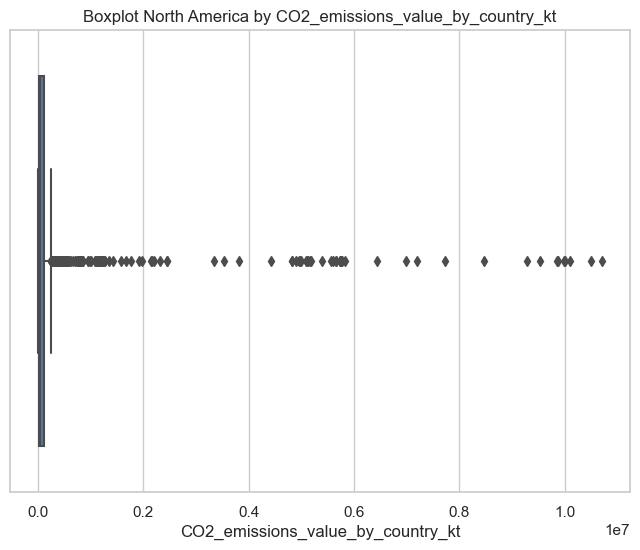

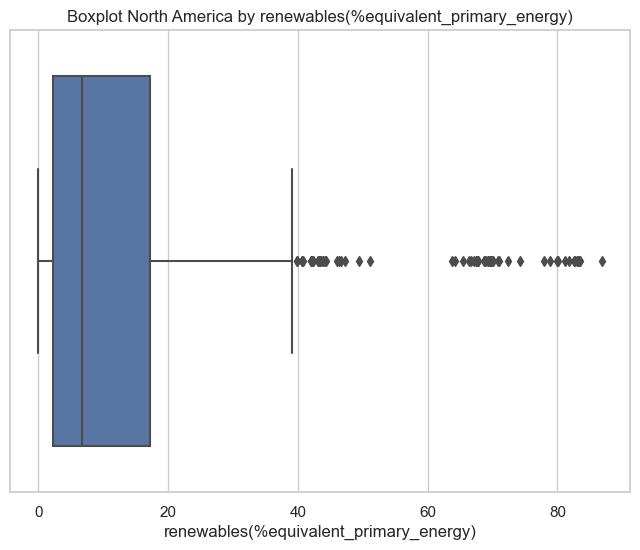

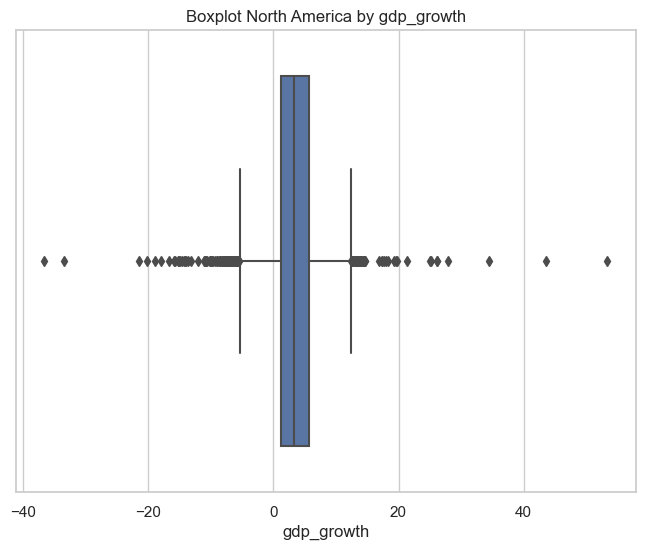

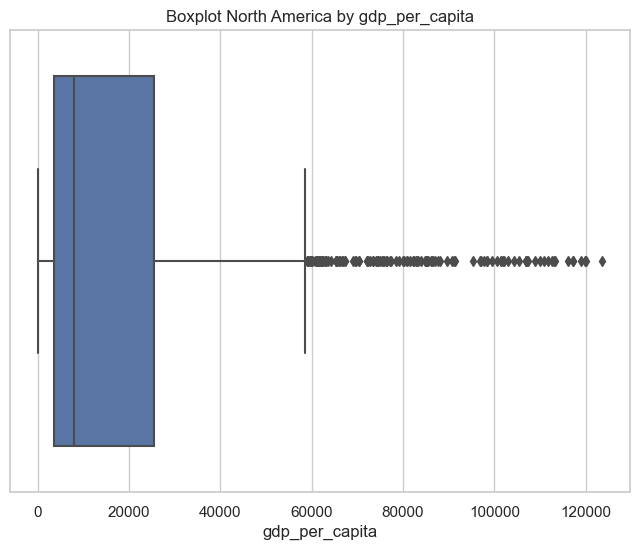

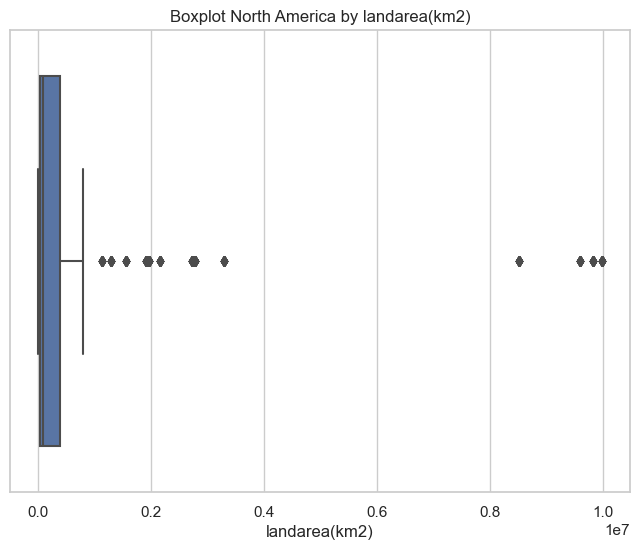

In [220]:
#CHECKING OUTLIERS
for col in df_num_north_america.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot North America by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

In [221]:
df_num_north_america.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,567.000000,567.000000,567.000000,567.000000,5.670000e+02,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,5.670000e+02,567.000000,567.000000,567.000000,5.670000e+02
mean,2010.000000,92.509613,83.251411,103.868571,2.622497e+07,19.401570,117.229630,32.896931,35.443245,26.875820,29161.290014,4.359506,2.402522e+05,16.066678,1.257890,20246.812215,8.346131e+05
std,6.060648,12.981611,23.374437,126.238442,6.502837e+07,21.131713,518.454273,149.695622,119.208969,28.162265,33608.641993,3.906855,1.004951e+06,13.247613,4.440433,22751.669692,2.595081e+06
min,2000.000000,31.542381,2.600000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,836.080400,0.110000,1.200000e+02,0.000000,-20.192371,542.333596,5.400000e+01
25%,2005.000000,89.845680,82.450000,4.280000,2.600000e+05,1.770000,0.265000,0.000000,0.000000,0.114616,9050.244500,2.440000,8.837470e+02,0.042004,-1.331781,4404.510041,4.300000e+02
50%,2010.000000,98.037100,89.600000,61.700000,3.100000e+06,10.570000,1.630000,0.000000,0.170000,16.666668,15259.877000,3.330000,7.560000e+03,9.475372,1.999999,10744.091020,1.387800e+04
75%,2015.000000,100.000000,100.000000,138.850000,1.955000e+07,29.090000,6.515000,0.000000,3.435000,48.692244,35855.724500,4.860000,1.334000e+04,30.542150,3.842537,32290.921140,1.088890e+05
max,2020.000000,100.000000,100.000000,622.840000,5.963700e+08,82.190000,2988.240000,809.410000,821.400000,99.121710,165831.280000,21.600000,5.775810e+06,30.542150,14.440990,117098.446300,9.984670e+06


In [222]:
columns_with_outliers_north_america = []

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_north_america.columns:
    if df_num_north_america[column].dtype == 'float64' or df_num_north_america[column].dtype == 'int64':
        Q1 = df_num_north_america[column].quantile(0.25)
        Q3 = df_num_north_america[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_north_america[
            (df_num_north_america[column] > upper_limit) |
            (df_num_north_america[column] < lower_limit)
        ]

        if not outliers.empty:
            print(f"Columna: {column}")
            print(outliers)
            columns_with_outliers_north_america.append(column)

# Mostrar las columnas con outliers
print("Columnas con outliers y número de outliers:")
for column, num_outliers in columns_with_outliers_north_america.items():
    print(f"{column}: {num_outliers}")

Columna: access_to_electricity(%_of_population)
     year  access_to_electricity(%_of_population)  \
294  2000                               73.318210   
295  2001                               73.732730   
315  2000                               33.700000   
316  2001                               31.542381   
317  2002                               33.152473   
318  2003                               31.600000   
319  2004                               34.110813   
320  2005                               34.588005   
321  2006                               33.900000   
322  2007                               35.550650   
323  2008                               36.041466   
324  2009                               36.542220   
325  2010                               37.055622   
326  2011                               37.584385   
327  2012                               37.900000   
328  2013                               38.697876   
329  2014                               39.496410  

AttributeError: 'list' object has no attribute 'items'

In [223]:
#Total number of outliers by column
column_outlier_total_north_america = {}

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_north_america.columns:
    if df_num_north_america[column].dtype == 'float64' or df_num_north_america[column].dtype == 'int64':
        Q1 = df_num_north_america[column].quantile(0.25)
        Q3 = df_num_north_america[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_north_america[
            (df_num_north_america[column] > upper_limit) |
            (df_num_north_america[column] < lower_limit)
        ]

        num_outliers = len(outliers)
        column_outlier_total_north_america[column] = num_outliers

# Mostrar el número total de outliers por columna
for column, num_outliers in column_outlier_total_north_america.items():
    print(f"Número de outliers en {column}: {num_outliers}")

Número de outliers en year: 0
Número de outliers en access_to_electricity(%_of_population): 36
Número de outliers en access_to_clean_fuels_for_cooking: 83
Número de outliers en renewable_electricity_generating_capacity_per_capita: 38
Número de outliers en financial_flows_to_developing_countries(us$): 79
Número de outliers en renewable_energy_share_in_the_total_final_energy_consumption(%): 21
Número de outliers en electricity_from_fossil_fuels(twh): 95
Número de outliers en electricity_from_nuclear(twh): 63
Número de outliers en electricity_from_renewables(twh): 80
Número de outliers en low_carbonelectricity(%electricity): 0
Número de outliers en primary_energy_consumption_per_capita(kwh/person): 62
Número de outliers en energy_intensity_level_of_primary_energy(mj/$2017pppgdp): 38
Número de outliers en CO2_emissions_value_by_country_kt: 63
Número de outliers en renewables(%equivalent_primary_energy): 0
Número de outliers en gdp_growth: 17
Número de outliers en gdp_per_capita: 27
Número 

In [441]:
df_num_north_america.shape

(567, 17)

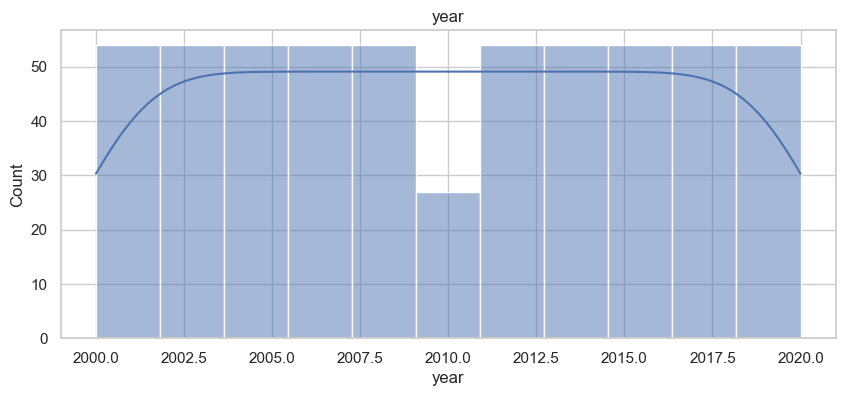

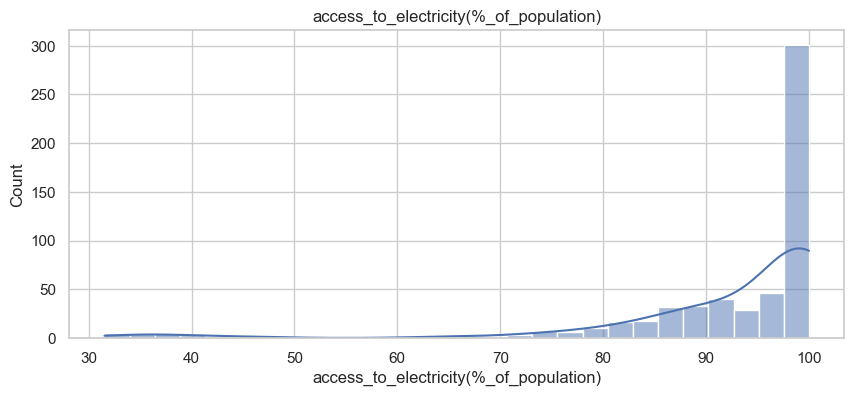

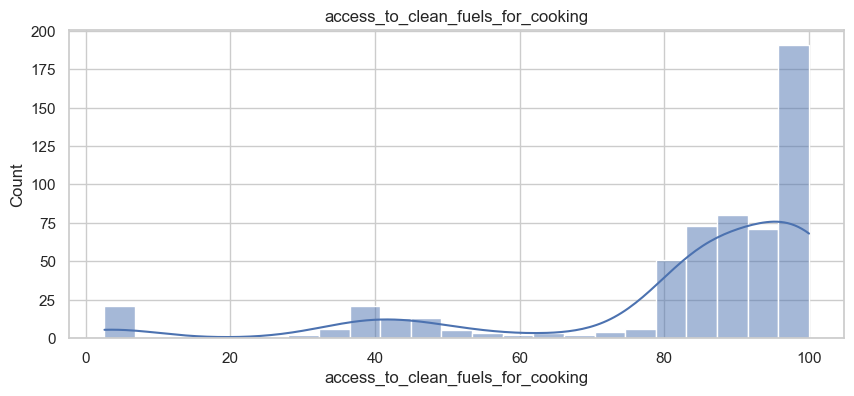

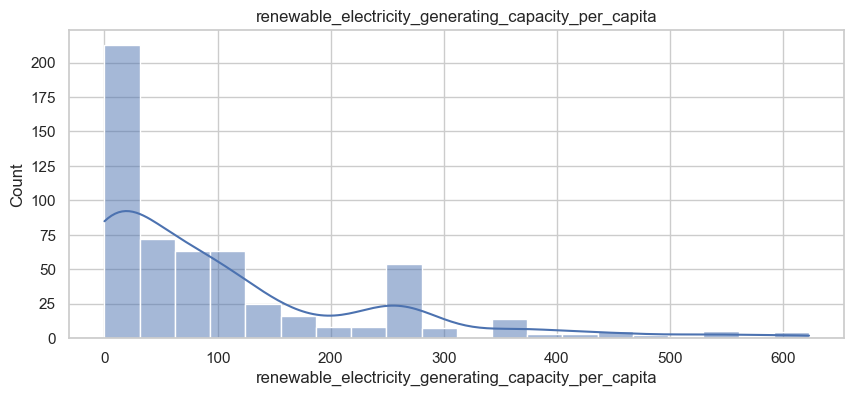

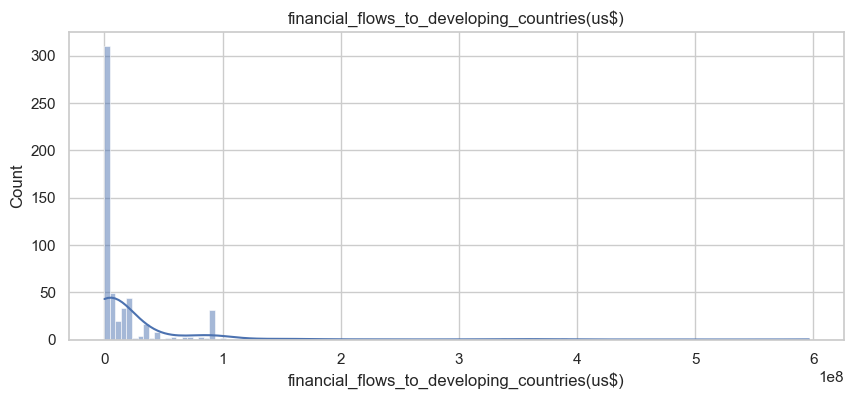

...

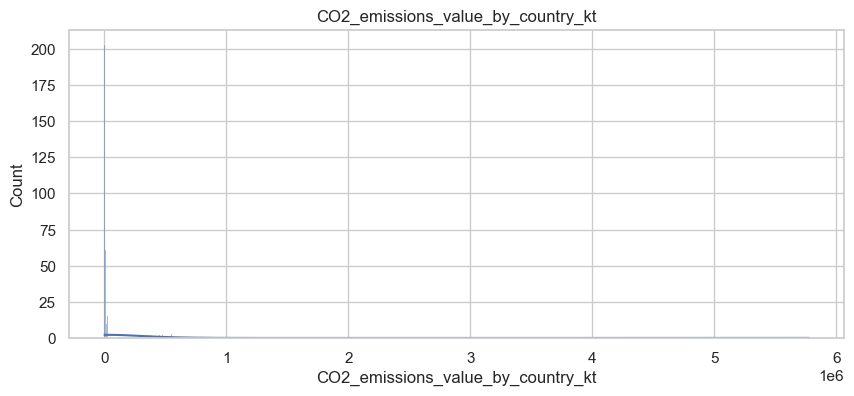

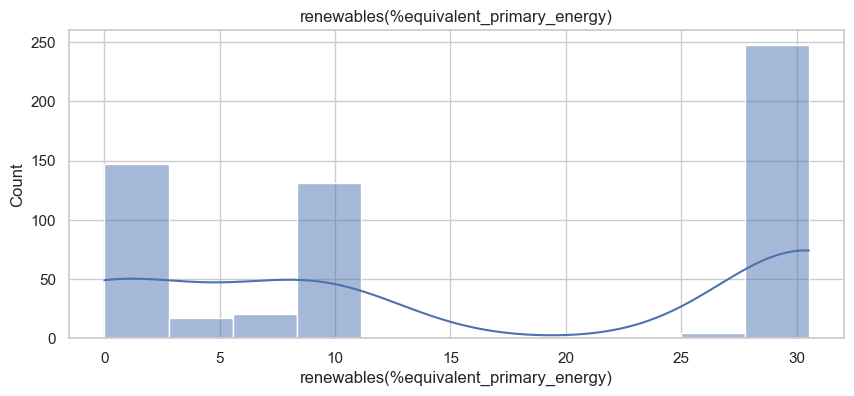

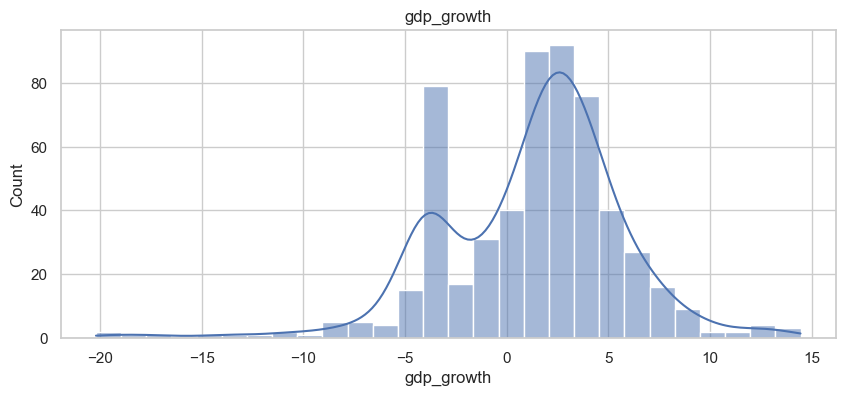

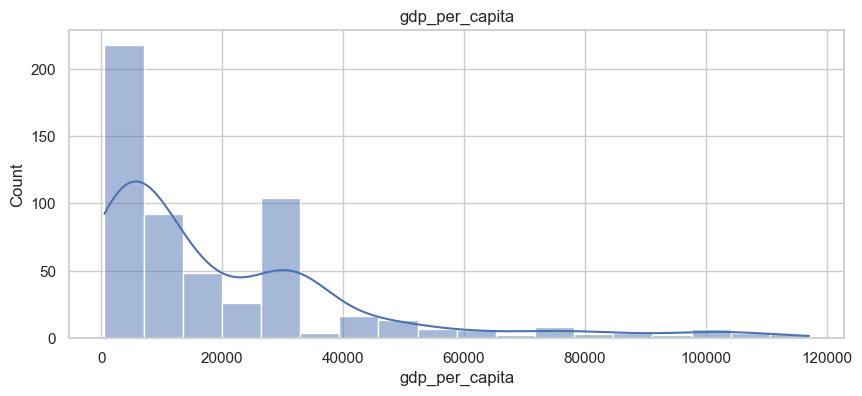

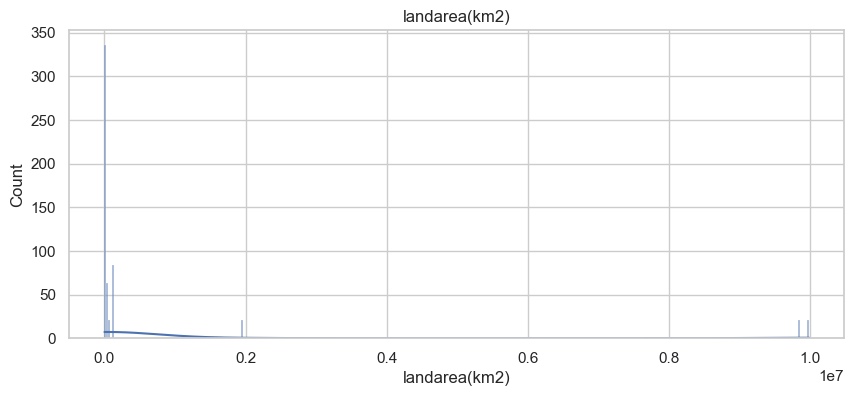

In [224]:
#CHECKING DISTRIBUTION
for c in df_num_north_america.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_north_america[c], kde= True)
    plt.title(c)
    plt.show()

In [225]:
continent_data['South America'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
105,Argentina,2000,95.783290,95.00,235.62,NaN,9.85,50.37,5.99,28.89,40.914955,18849.810,3.69,132270.0000,12.283858,-0.788999,7708.099115,17,2780400.0,South America
106,Argentina,2001,95.511060,95.60,234.09,3890000.0,11.51,42.91,6.54,37.04,50.387330,18210.120,3.59,125260.0000,15.937488,-4.408840,7208.373114,17,2780400.0,South America
107,Argentina,2002,96.228870,96.10,236.78,NaN,11.62,39.70,5.39,36.06,51.078250,17275.256,3.99,117470.0012,16.249306,-10.894485,2593.404563,17,2780400.0,South America
108,Argentina,2003,96.442635,96.45,234.82,50000.0,10.82,46.73,7.03,34.38,46.982075,18326.521,3.97,127660.0037,14.408259,8.837041,3349.806300,17,2780400.0,South America
109,Argentina,2004,96.653500,97.20,236.15,40960000.0,9.29,57.35,7.31,31.03,40.066883,19261.457,4.04,141380.0049,12.185576,9.029573,4277.721573,17,2780400.0,South America


In [226]:
continent_data['South America'].shape

(211, 20)

In [227]:
continent_data['South America'].isnull().sum().sort_values(ascending=False)

renewables(%equivalent_primary_energy)                             85
financial_flows_to_developing_countries(us$)                       60
electricity_from_nuclear(twh)                                      21
CO2_emissions_value_by_country_kt                                  11
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           11
renewable_energy_share_in_the_total_final_energy_consumption(%)    10
access_to_electricity(%_of_population)                              1
access_to_clean_fuels_for_cooking                                   1
landarea(km2)                                                       1
density(P/km2)                                                      1
gdp_per_capita                                                      1
gdp_growth                                                          1
entity                                                              0
low_carbonelectricity(%electricity)                                 0
primary_energy_consu

In [228]:
continent_data['South America'] = continent_data['South America'].interpolate(method='pad')

In [231]:
continent_data['South America'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [232]:
continent_data['South America']['financial_flows_to_developing_countries(us$)'].fillna(0, inplace=True)

In [233]:
#Save numerical data of Asia
df_num_south_america= continent_data['South America'].select_dtypes(exclude=["object"])
df_num_south_america.head(5)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
105,2000,95.783290,95.00,235.62,0.0,9.85,50.37,5.99,28.89,40.914955,18849.810,3.69,132270.0000,12.283858,-0.788999,7708.099115,2780400.0
106,2001,95.511060,95.60,234.09,3890000.0,11.51,42.91,6.54,37.04,50.387330,18210.120,3.59,125260.0000,15.937488,-4.408840,7208.373114,2780400.0
107,2002,96.228870,96.10,236.78,3890000.0,11.62,39.70,5.39,36.06,51.078250,17275.256,3.99,117470.0012,16.249306,-10.894485,2593.404563,2780400.0
108,2003,96.442635,96.45,234.82,50000.0,10.82,46.73,7.03,34.38,46.982075,18326.521,3.97,127660.0037,14.408259,8.837041,3349.806300,2780400.0
109,2004,96.653500,97.20,236.15,40960000.0,9.29,57.35,7.31,31.03,40.066883,19261.457,4.04,141380.0049,12.185576,9.029573,4277.721573,2780400.0


In [234]:
df_num_south_america = df_num_south_america.reset_index(drop=True)

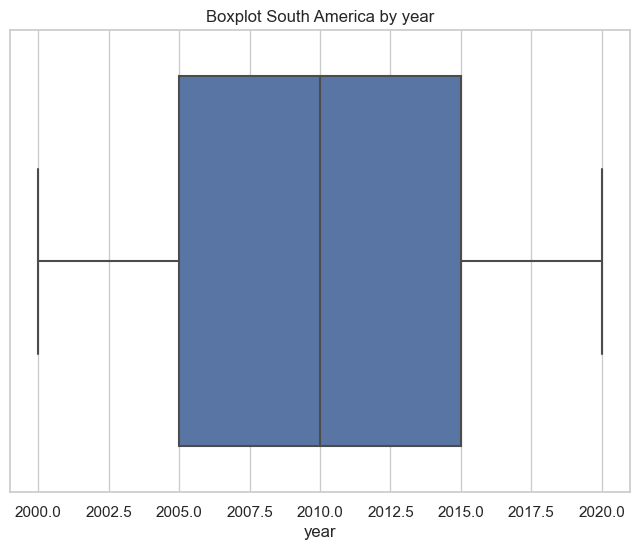

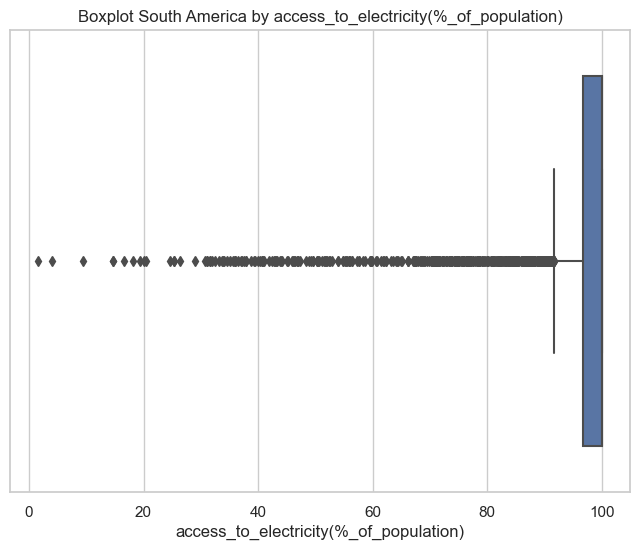

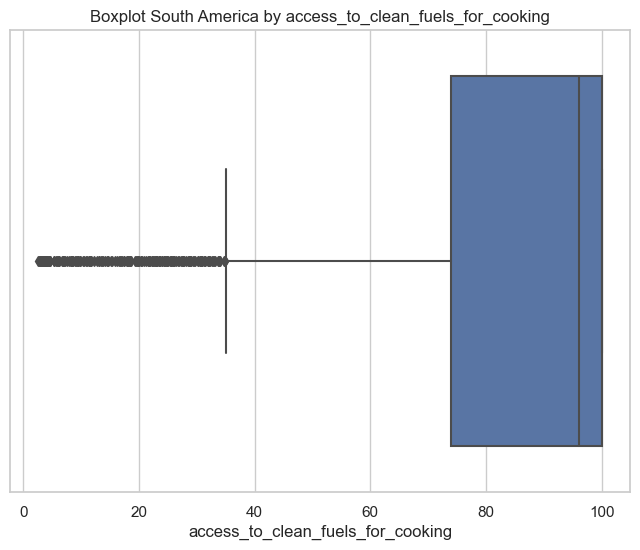

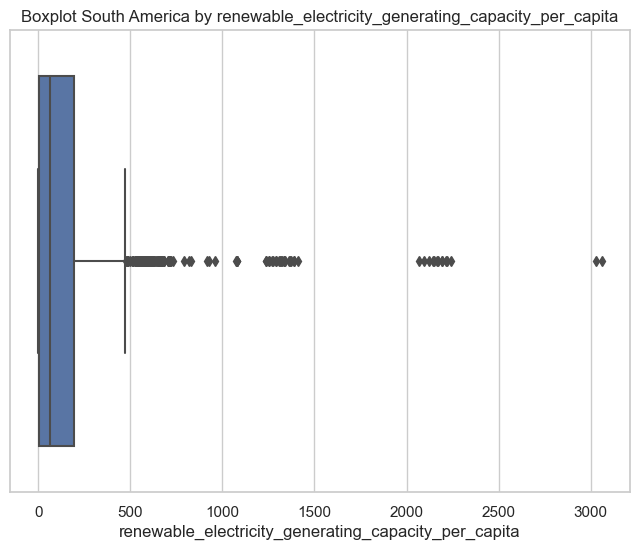

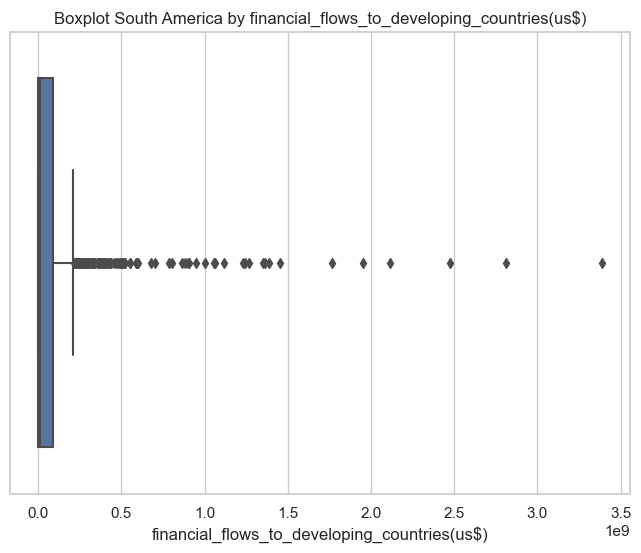

...

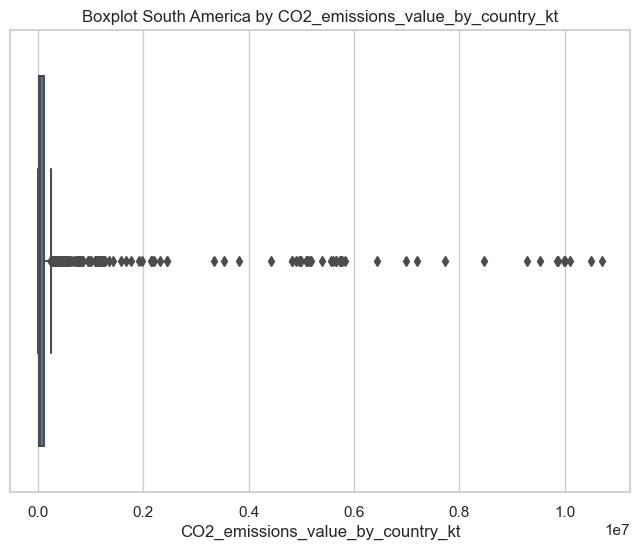

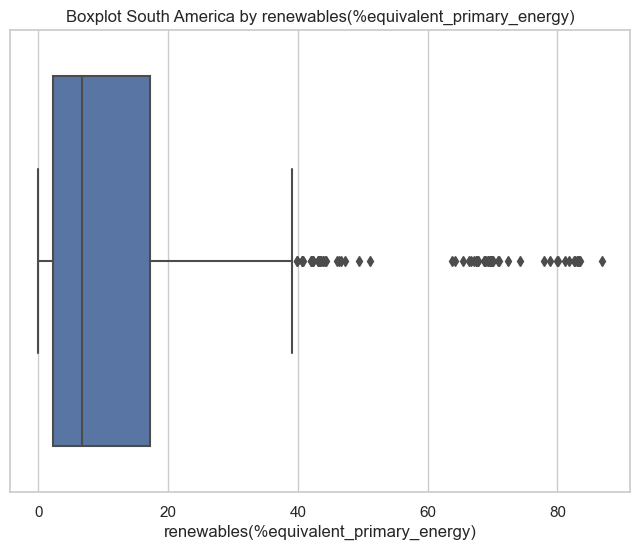

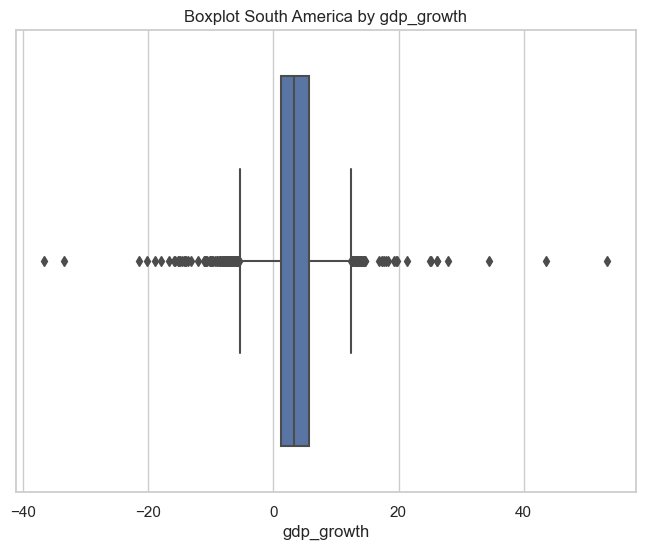

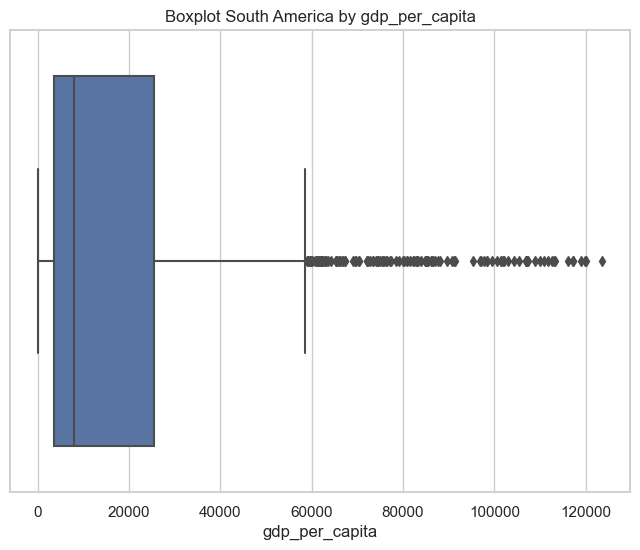

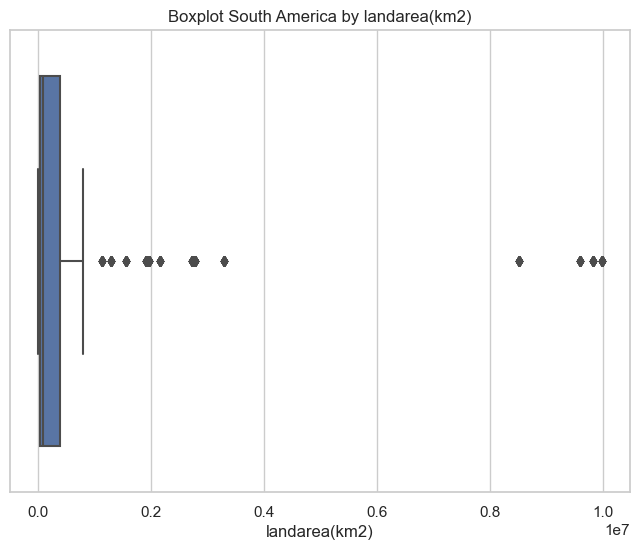

In [235]:
#CHECKING OUTLIERS
for col in df_num_south_america.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot South America by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

In [236]:
df_num_south_america.head(1)                    

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,95.78329,95.0,235.62,0.0,9.85,50.37,5.99,28.89,40.914955,18849.81,3.69,132270.0,12.283858,-0.788999,7708.099115,2780400.0


In [440]:
df_num_south_america.shape

(211, 17)

In [237]:
df_num_south_america.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,211.000000,211.000000,211.000000,211.000000,2.110000e+02,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,2.110000e+02
mean,2009.952607,94.909058,84.102607,407.628246,1.177523e+08,32.320142,21.702844,3.296919,60.482891,60.880731,15559.032864,3.397630,78358.056732,29.222492,2.876778,6781.960312,1.566064e+06
std,6.094309,6.642774,17.304756,361.159236,3.224945e+08,16.456433,29.913366,5.395672,118.431827,27.034127,5742.932373,0.720454,117395.860239,8.874942,4.917957,4108.842005,2.438872e+06
min,2000.000000,72.113110,35.600000,29.400000,0.000000e+00,7.650000,0.000000,0.000000,0.000000,0.000000,5345.900400,2.140000,1120.000005,10.167007,-15.907951,954.400318,1.638200e+05
25%,2005.000000,94.480274,75.250000,172.795000,4.600000e+05,18.305000,0.870000,0.000000,7.230000,41.926115,9918.690500,2.790000,4550.000191,22.571669,1.115547,3745.501842,2.149690e+05
50%,2010.000000,97.194930,91.200000,300.290000,5.030000e+06,30.420000,8.360000,0.000000,22.500000,60.827293,16220.931000,3.360000,38290.000920,30.744228,3.283446,5919.012338,4.067520e+05
75%,2015.000000,99.097675,99.000000,467.900000,9.778500e+07,43.025000,32.355000,6.525000,44.565000,83.380697,21089.465000,3.855000,79715.000155,36.035774,5.230067,8762.026548,1.285216e+06
max,2020.000000,100.000000,100.000000,1410.110000,2.811680e+09,70.410000,136.580000,15.170000,520.010000,100.000000,25234.633000,6.250000,511619.995100,49.471880,43.479556,18703.860290,8.515770e+06


In [238]:
columns_with_outliers_south_america = []

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_south_america.columns:
    if df_num_south_america[column].dtype == 'float64' or df_num_south_america[column].dtype == 'int64':
        Q1 = df_num_south_america[column].quantile(0.25)
        Q3 = df_num_south_america[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_south_america[
            (df_num_south_america[column] > upper_limit) |
            (df_num_south_america[column] < lower_limit)
        ]

        if not outliers.empty:
            print(f"Columna: {column}")
            print(outliers)
            columns_with_outliers_south_america.append(column)

# Mostrar las columnas con outliers
print("Columnas con outliers y número de outliers:")
for column, num_outliers in columns_with_outliers_south_america.items():
    print(f"{column}: {num_outliers}")

Columna: access_to_electricity(%_of_population)
     year  access_to_electricity(%_of_population)  \
106  2000                               74.517280   
107  2001                               75.100740   
108  2002                               75.676610   
109  2003                               76.247250   
110  2004                               76.815010   
111  2005                               77.500000   
112  2006                               73.382590   
113  2007                               78.524925   
114  2008                               79.105770   
115  2009                               77.600000   
116  2010                               83.091630   
117  2011                               84.084540   
118  2012                               85.066480   
119  2013                               86.026490   
120  2014                               86.900000   
148  2000                               72.496500   
149  2001                               72.113110  

AttributeError: 'list' object has no attribute 'items'

In [239]:
#Total number of outliers by column
column_outlier_total_south_america = {}

# Calcular el IQR para cada columna numérica y encontrar outliers
for column in df_num_south_america.columns:
    if df_num_south_america[column].dtype == 'float64' or df_num_south_america[column].dtype == 'int64':
        Q1 = df_num_south_america[column].quantile(0.25)
        Q3 = df_num_south_america[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df_num_south_america[
            (df_num_south_america[column] > upper_limit) |
            (df_num_south_america[column] < lower_limit)
        ]

        num_outliers = len(outliers)
        column_outlier_total_south_america[column] = num_outliers

# Mostrar el número total de outliers por columna
for column, num_outliers in column_outlier_total_south_america.items():
    print(f"Número de outliers en {column}: {num_outliers}")

Número de outliers en year: 0
Número de outliers en access_to_electricity(%_of_population): 25
Número de outliers en access_to_clean_fuels_for_cooking: 2
Número de outliers en renewable_electricity_generating_capacity_per_capita: 26
Número de outliers en financial_flows_to_developing_countries(us$): 25
Número de outliers en renewable_energy_share_in_the_total_final_energy_consumption(%): 0
Número de outliers en electricity_from_fossil_fuels(twh): 18
Número de outliers en electricity_from_nuclear(twh): 0
Número de outliers en electricity_from_renewables(twh): 21
Número de outliers en low_carbonelectricity(%electricity): 0
Número de outliers en primary_energy_consumption_per_capita(kwh/person): 0
Número de outliers en energy_intensity_level_of_primary_energy(mj/$2017pppgdp): 5
Número de outliers en CO2_emissions_value_by_country_kt: 21
Número de outliers en renewables(%equivalent_primary_energy): 0
Número de outliers en gdp_growth: 12
Número de outliers en gdp_per_capita: 6
Número de out

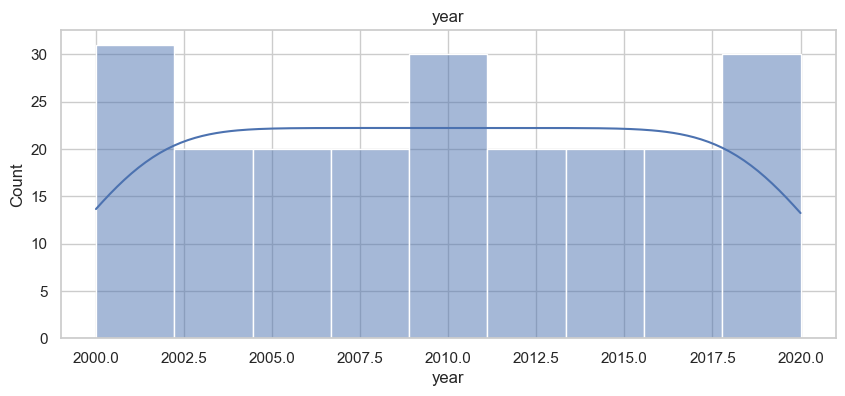

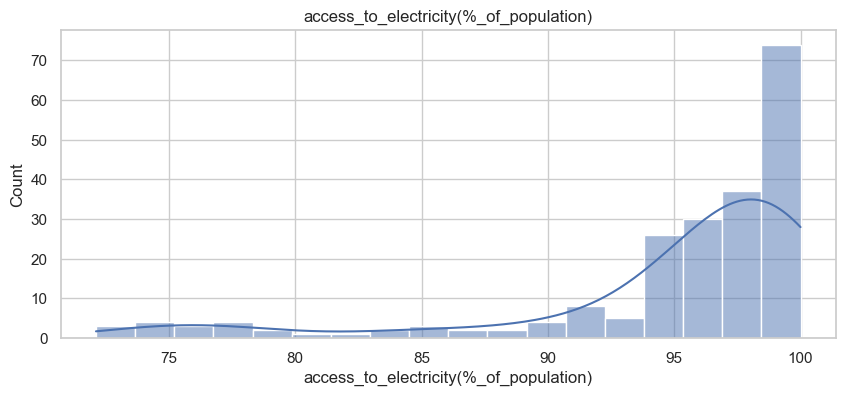

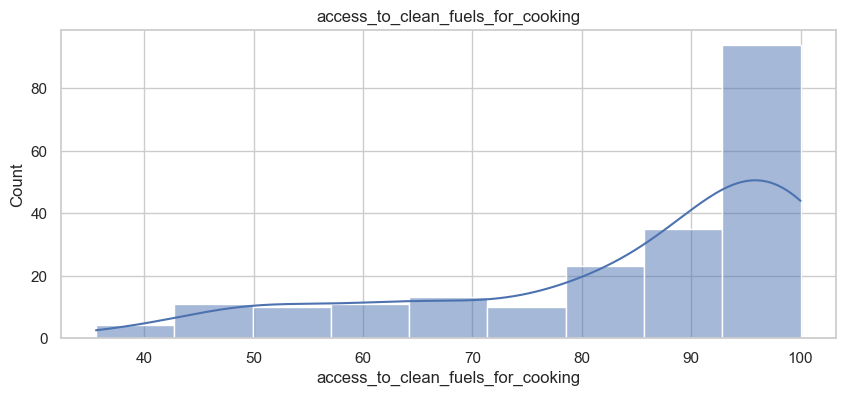

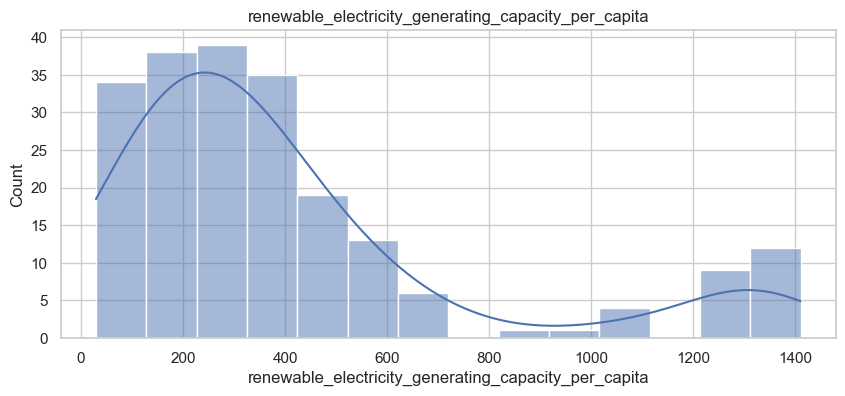

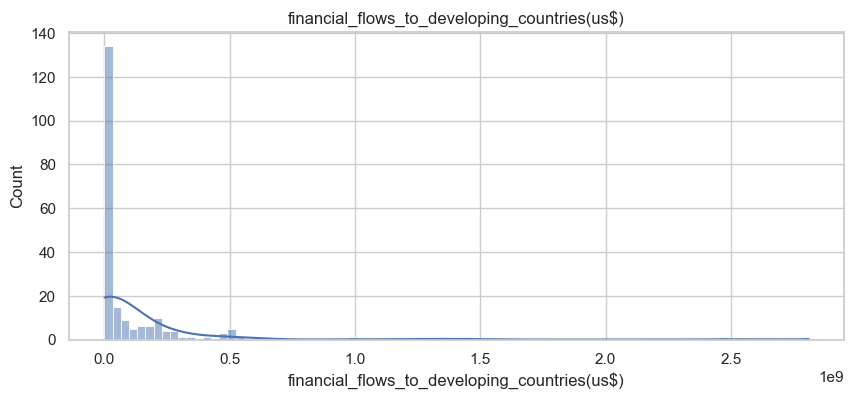

...

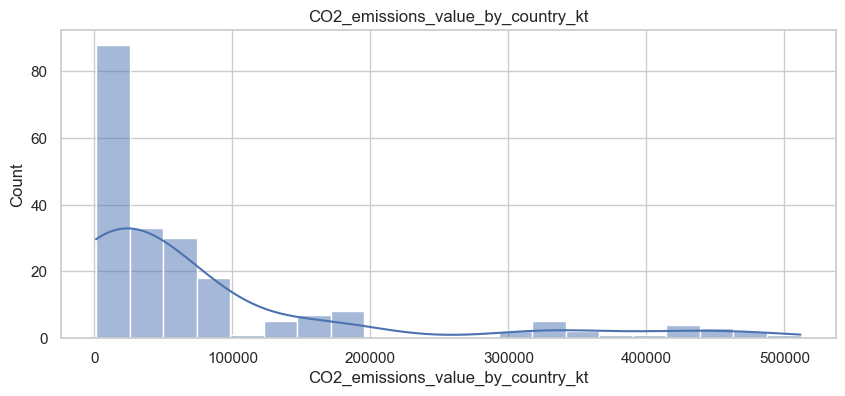

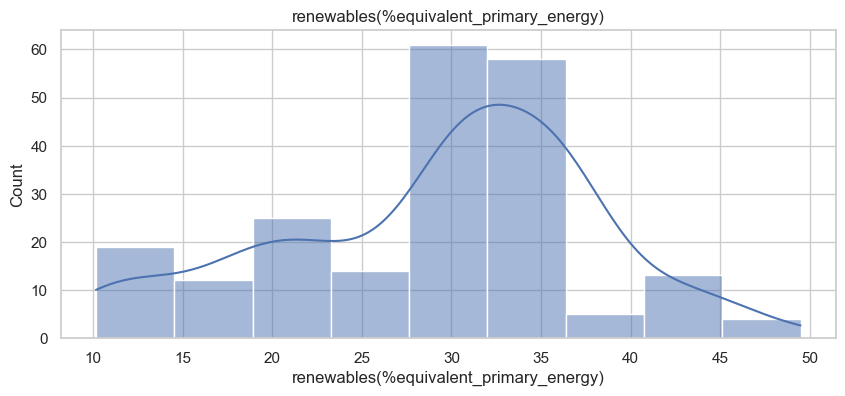

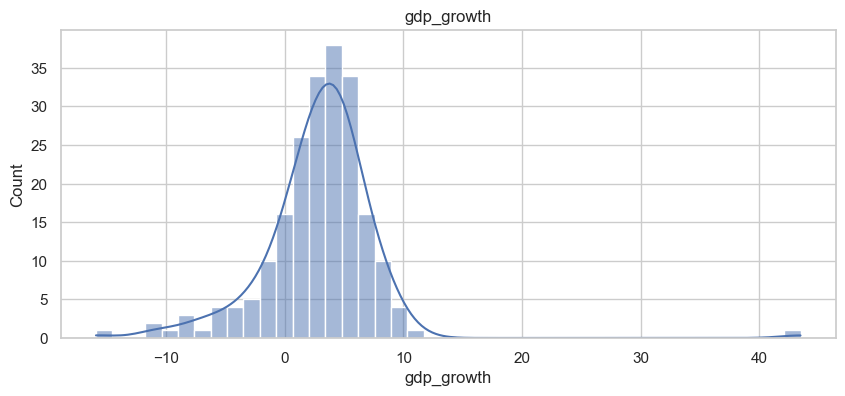

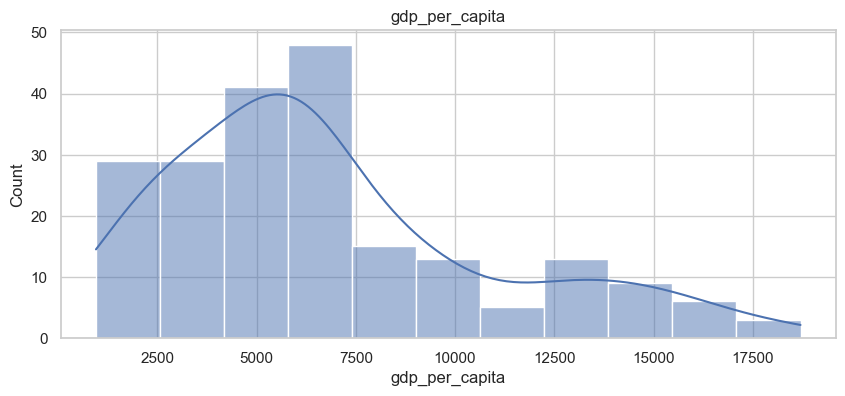

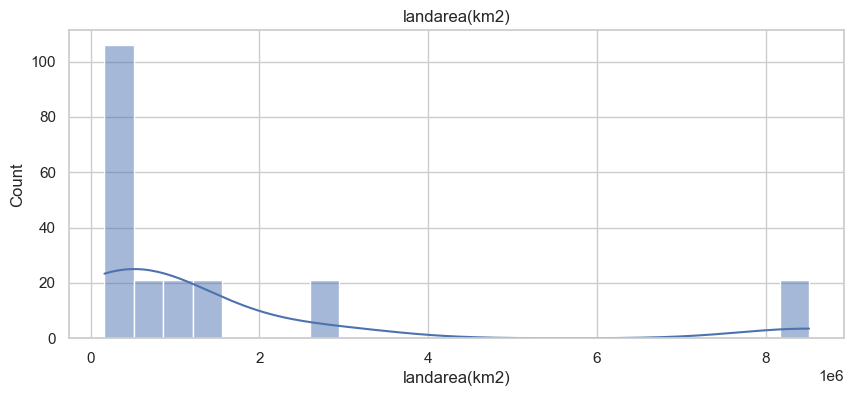

In [240]:
#CHECKING DISTRIBUTION
for c in df_num_south_america.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_south_america[c], kde= True)
    plt.title(c)
    plt.show()

In [241]:
#Comparison of general statistics of developed and undeveloped countries

In [242]:
df_num_europe.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,763.00000,763.000000,763.000000,763.0,763.0,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000
mean,2010.12844,99.981129,93.207208,0.0,0.0,19.317562,48.174312,27.969607,25.303159,49.372587,44210.969233,4.546501,106907.784899,13.861321,1.879952,28176.672033,163231.055046
std,6.03309,0.133596,15.455930,0.0,0.0,16.230322,79.439466,73.085619,38.363014,30.038828,28823.516551,2.313840,163332.797851,17.628652,4.162349,24575.676710,171894.594116
min,2000.00000,97.700000,38.200000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,8635.532000,1.320000,0.000000,0.000000,-15.306894,658.348608,316.000000
25%,2005.00000,100.000000,100.000000,0.0,0.0,7.430000,3.750000,0.000000,2.970000,25.060795,26771.296000,3.095000,11129.999830,1.936145,0.476020,7720.510572,43094.000000
50%,2010.00000,100.000000,100.000000,0.0,0.0,16.310000,19.970000,0.000000,8.540000,49.702663,36881.977000,3.890000,44959.999080,7.619621,2.269487,21083.277150,83871.000000
75%,2015.00000,100.000000,100.000000,0.0,0.0,25.290000,47.975000,23.090000,28.405000,69.311150,50603.181500,5.340000,100315.002450,18.366333,4.004610,43749.049040,243610.000000
max,2020.00000,100.000000,100.000000,0.0,0.0,81.070000,402.400000,451.530000,251.480000,100.000000,188294.000000,15.780000,847680.000000,86.836586,25.176245,123514.196700,643801.000000


In [243]:
df_num_north_america.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,567.000000,567.000000,567.000000,567.000000,5.670000e+02,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,5.670000e+02,567.000000,567.000000,567.000000,5.670000e+02
mean,2010.000000,92.509613,83.251411,103.868571,2.622497e+07,19.401570,117.229630,32.896931,35.443245,26.875820,29161.290014,4.359506,2.402522e+05,16.066678,1.257890,20246.812215,8.346131e+05
std,6.060648,12.981611,23.374437,126.238442,6.502837e+07,21.131713,518.454273,149.695622,119.208969,28.162265,33608.641993,3.906855,1.004951e+06,13.247613,4.440433,22751.669692,2.595081e+06
min,2000.000000,31.542381,2.600000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,836.080400,0.110000,1.200000e+02,0.000000,-20.192371,542.333596,5.400000e+01
25%,2005.000000,89.845680,82.450000,4.280000,2.600000e+05,1.770000,0.265000,0.000000,0.000000,0.114616,9050.244500,2.440000,8.837470e+02,0.042004,-1.331781,4404.510041,4.300000e+02
50%,2010.000000,98.037100,89.600000,61.700000,3.100000e+06,10.570000,1.630000,0.000000,0.170000,16.666668,15259.877000,3.330000,7.560000e+03,9.475372,1.999999,10744.091020,1.387800e+04
75%,2015.000000,100.000000,100.000000,138.850000,1.955000e+07,29.090000,6.515000,0.000000,3.435000,48.692244,35855.724500,4.860000,1.334000e+04,30.542150,3.842537,32290.921140,1.088890e+05
max,2020.000000,100.000000,100.000000,622.840000,5.963700e+08,82.190000,2988.240000,809.410000,821.400000,99.121710,165831.280000,21.600000,5.775810e+06,30.542150,14.440990,117098.446300,9.984670e+06


In [244]:
df_num_south_america.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,211.000000,211.000000,211.000000,211.000000,2.110000e+02,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,2.110000e+02
mean,2009.952607,94.909058,84.102607,407.628246,1.177523e+08,32.320142,21.702844,3.296919,60.482891,60.880731,15559.032864,3.397630,78358.056732,29.222492,2.876778,6781.960312,1.566064e+06
std,6.094309,6.642774,17.304756,361.159236,3.224945e+08,16.456433,29.913366,5.395672,118.431827,27.034127,5742.932373,0.720454,117395.860239,8.874942,4.917957,4108.842005,2.438872e+06
min,2000.000000,72.113110,35.600000,29.400000,0.000000e+00,7.650000,0.000000,0.000000,0.000000,0.000000,5345.900400,2.140000,1120.000005,10.167007,-15.907951,954.400318,1.638200e+05
25%,2005.000000,94.480274,75.250000,172.795000,4.600000e+05,18.305000,0.870000,0.000000,7.230000,41.926115,9918.690500,2.790000,4550.000191,22.571669,1.115547,3745.501842,2.149690e+05
50%,2010.000000,97.194930,91.200000,300.290000,5.030000e+06,30.420000,8.360000,0.000000,22.500000,60.827293,16220.931000,3.360000,38290.000920,30.744228,3.283446,5919.012338,4.067520e+05
75%,2015.000000,99.097675,99.000000,467.900000,9.778500e+07,43.025000,32.355000,6.525000,44.565000,83.380697,21089.465000,3.855000,79715.000155,36.035774,5.230067,8762.026548,1.285216e+06
max,2020.000000,100.000000,100.000000,1410.110000,2.811680e+09,70.410000,136.580000,15.170000,520.010000,100.000000,25234.633000,6.250000,511619.995100,49.471880,43.479556,18703.860290,8.515770e+06


In [245]:
df_num_asia.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,819.000000,819.000000,819.000000,819.000000,8.190000e+02,819.000000,819.000000,819.000000,819.000000,819.000000,819.00000,819.000000,8.190000e+02,819.000000,819.000000,819.000000,8.190000e+02
mean,2010.000000,89.540016,70.617277,167.388669,1.099556e+08,20.984762,161.661331,9.334151,38.174103,25.889534,36163.68892,5.803985,3.540682e+05,4.477346,4.630280,11352.759007,7.493200e+05
std,6.059001,18.919985,31.708110,346.710720,2.395457e+08,26.365989,571.158550,41.483333,179.314413,32.790328,50354.61042,4.048257,1.313613e+06,4.951117,5.880122,15502.219185,1.626458e+06
min,2000.000000,1.613591,2.900000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,204.23125,1.200000,2.100000e+02,0.000000,-36.658153,0.000000,2.980000e+02
25%,2005.000000,87.550000,42.450000,7.095000,8.100000e+05,1.115000,3.175000,0.000000,0.040000,0.109167,5777.91030,3.445000,1.240500e+04,0.040307,2.175678,1286.232553,3.839400e+04
50%,2010.000000,99.604300,82.900000,55.080000,1.117000e+07,6.490000,21.950000,0.000000,2.240000,10.663012,16075.37400,4.820000,6.055000e+04,2.907140,5.007683,4021.743306,1.999510e+05
75%,2015.000000,100.000000,100.000000,120.570000,1.200950e+08,34.405000,73.460000,0.000000,11.510000,37.677067,36441.39650,6.660000,1.502500e+05,7.163172,7.298275,16551.940215,6.522300e+05
max,2020.000000,100.000000,100.000000,3060.190000,3.386850e+09,93.460000,5184.130000,366.200000,2184.940000,100.000010,262585.70000,32.570000,1.070722e+07,24.803470,53.381794,85075.986540,9.596960e+06


## SOSTENIBILIDAD PAISES DESARROLLADOS VS NO DESARROLLADOS

El Objetivo de Desarrollo Sostenible 7 (Objetivo 7 o ODS 7) trata sobre alianzas para los objetivos y es uno de los 17 Objetivos de Desarrollo Sostenible (ODS) establecidos por las Naciones Unidas en 2015.

- El ODS 7 es: "Garantizar el acceso a una energía asequible, segura, sostenible y moderna para todos". El Objetivo tiene metas que deben alcanzarse para 2030. El progreso hacia las metas se medirá mediante indicadores.

El principal problema que busca erradicar es la contaminación a causa de las energías fósiles y la ineficacia de los gobiernos para implementar energías limpias y renovables​

El acceso a fuentes de energía modernas y sostenibles es esencial no solo para hacer frente al cambio climático, sino también para el crecimiento económico de los países.

La combinación de energía primaria de la región está dominada por los combustibles fósiles, y el carbón, el petróleo y el gas natural representan más del 80% del consumo total. Esta dependencia de los combustibles fósiles ha provocado altos niveles de emisiones de CO2, que contribuyen al cambio climático.

En los últimos años, ha habido una creciente conciencia sobre la necesidad de reducir las emisiones de CO2 en el Sudeste Asiático. Los gobiernos de toda la región han fijado objetivos ambiciosos para el despliegue de energía renovable y hay una inversión creciente en medidas de eficiencia energética.

Este análisis examinará las tendencias en el consumo de electricidad, el consumo de energía primaria y las emisiones de CO2 DE 4 continentes.

In [246]:
# concatenamos todos los dataframes en uno, recordando que cada dataframde esta dividdo por continente y ademas tien su data numerica en su respectivo dataset
dataframes = [continent_data['Europe'], continent_data['Asia'], continent_data['North America'], continent_data['South America']]

In [247]:
df_all = pd.concat(dataframes, ignore_index=True)

In [248]:
#Guardamos dataset limpio sin  nulos 
archivo_csv = 'df_all.csv'
df_all.to_csv(archivo_csv, index=False) 

In [249]:
df_all.head()

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,105,28748.0,Europe
2,Albania,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,105,28748.0,Europe
3,Albania,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,105,28748.0,Europe
4,Albania,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,105,28748.0,Europe


In [250]:
df_all.shape

(2360, 20)

In [251]:
df_all.isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

# PRIMARY ENERGY COMSUPTION ANALASYS AND ENERGY COMSUPTION TRENDS

## CONSUMO DE ENERGIA POR CONTINENTE

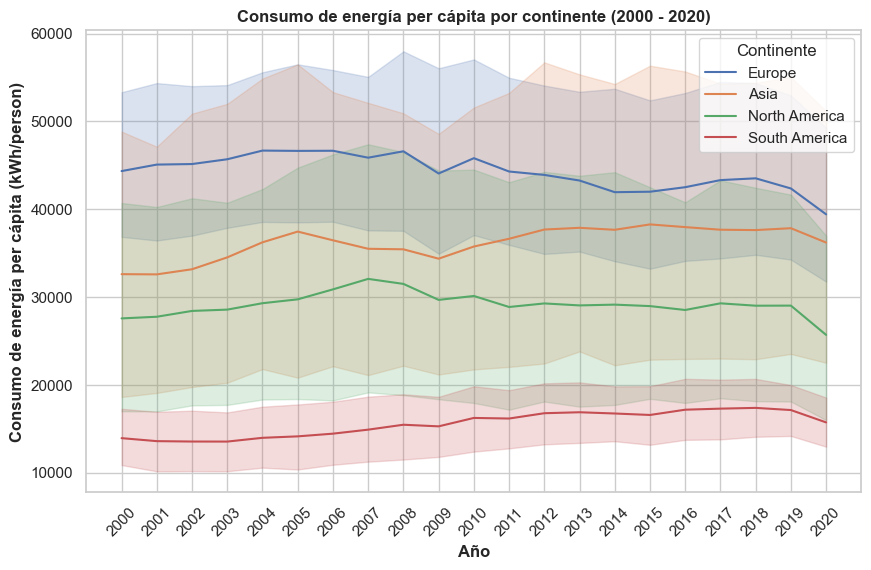

In [252]:
import matplotlib.pyplot as plt
import seaborn as sns

# Establecer el estilo de gráfico
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='primary_energy_consumption_per_capita(kwh/person)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.title('Consumo de energía per cápita por continente (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
# Mostrar el gráfico
plt.show()

The above graph clearly shows the trends in per capita egergy consumption by continent. The graphs are quite different from each other.

Top continents in terms of energy consumption:

Europe
Asia
North America
South America

Europe has the highest rates, which is quite expected, however, it can be seen that since 2008 the amount of energy consumption per capita has been gradually decreasing as in North America, while the countries of Asia have moderately increasing rates, and perhaps soon they will have the highest rates, thereby overtaking the countries of Europe*

Mientras que asia y sudamerica hsan incrementado el consumo a partir de 2009.
Las tendencias en el consumo de energía per cápita pueden estar influenciadas por una variedad de factores económicos, sociales y ambientales. Aunque no puedo proporcionar datos específicos actualizados después de mi fecha de conocimiento en septiembre de 2021, puedo mencionar algunas posibles explicaciones generales para las tendencias observadas en Europa, América del Norte, Asia y Sudamérica:

Europa y América del Norte (Decrecimiento):

Mayor Eficiencia Energética: Estos continentes han estado trabajando en la mejora de la eficiencia energética, lo que significa que pueden lograr más producción y servicios con menos consumo de energía. La adopción de tecnologías más eficientes, la renovación de edificios y la modernización de infraestructuras pueden contribuir a un menor consumo de energía per cápita.

Cambio en la Composición de la Energía: La transición hacia fuentes de energía más limpias y renovables puede llevar a un menor consumo de energía per cápita, ya que estas fuentes pueden ser más eficientes y menos intensivas en energía.

Políticas de Sostenibilidad: Europa y América del Norte a menudo tienen políticas más estrictas en cuanto a sostenibilidad y reducción de emisiones. Esto puede llevar a una menor demanda de energía en ciertos sectores y promover prácticas de consumo más sostenibles.

Asia y Sudamérica (Crecimiento):

Crecimiento Económico: El crecimiento económico en estos continentes puede estar impulsando un aumento en el consumo de energía a medida que más personas acceden a servicios y tecnología que requieren energía.

Industrialización: La industrialización y el aumento de la producción manufacturera a menudo conducen a un aumento en el consumo de energía. Esto puede ser especialmente relevante en Asia, que es conocida por su rápido desarrollo industrial.

Urbanización: El aumento de la urbanización puede llevar a un mayor consumo de energía a medida que las personas se mudan a ciudades y utilizan más energía en el transporte y la vivienda.

Cambios en el Estilo de Vida: Cambios en el estilo de vida, como el aumento en la propiedad de automóviles y electrodomésticos, pueden aumentar el consumo de energía per cápita.

Disponibilidad de Recursos: La disponibilidad de recursos energéticos también puede influir en las tendencias de consumo. Por ejemplo, la presencia de recursos energéticos abundantes, como el petróleo o el gas natural, puede impulsar el consumo.

Es importante tener en cuenta que estas son explicaciones generales y que las tendencias en el consumo de energía son el resultado de una interacción compleja de múltiples factores. Cada región y país puede experimentar variaciones significativas en función de sus políticas, economía y desarrollo. Además, las tendencias pueden cambiar con el tiempo a medida que se implementan políticas y tecnologías nuevas. Por lo tanto, es importante examinar los datos específicos y considerar el contexto local para comprender completamente las tendencias en el consumo de energía.

## Electricity generated from fossil fuels 

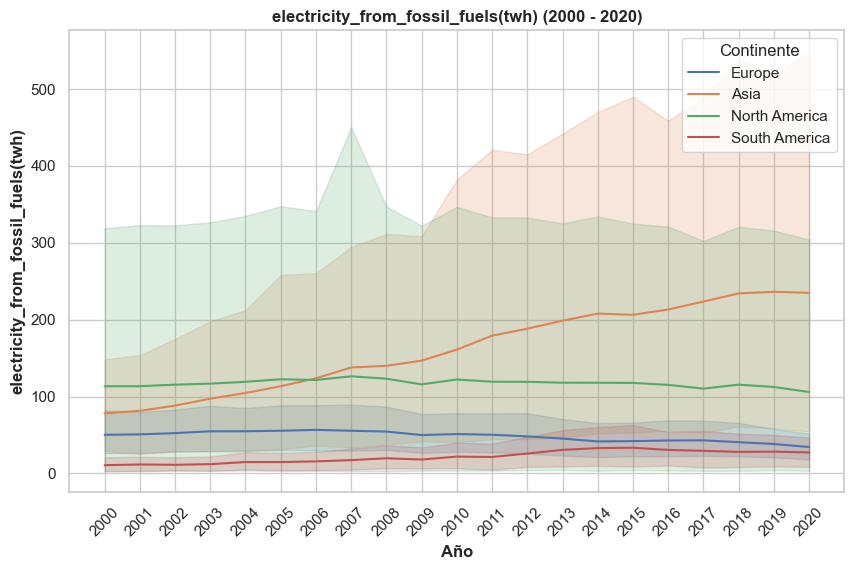

In [253]:
#import matplotlib.pyplot as plt
import seaborn as sns

# Establecer el estilo de gráfico
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='electricity_from_fossil_fuels(twh)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('electricity_from_fossil_fuels(twh)', fontweight='bold')
plt.title('electricity_from_fossil_fuels(twh) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())

# Mostrar el gráfico
plt.show()

 ## Electricity generated from nuclear

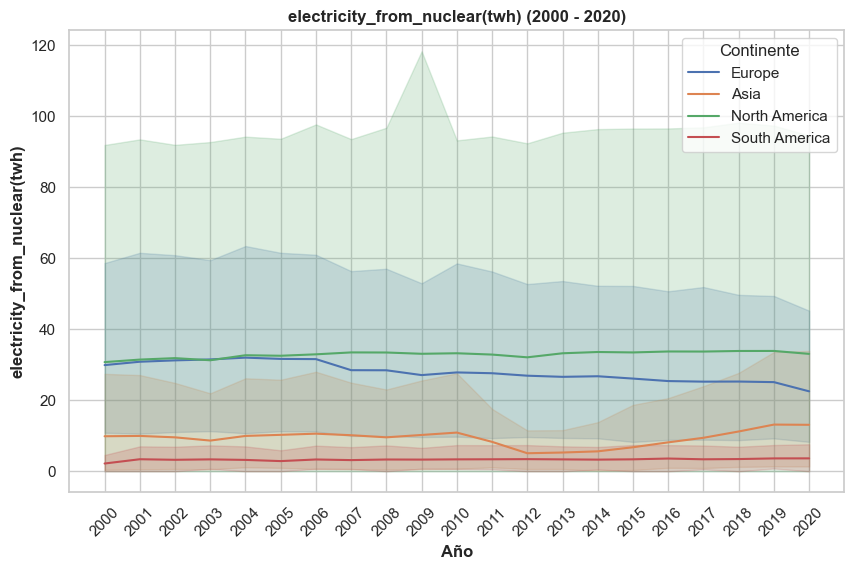

In [254]:
# Establecer el estilo de gráfico
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='electricity_from_nuclear(twh)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('electricity_from_nuclear(twh)', fontweight='bold')
plt.title('electricity_from_nuclear(twh) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())

# Mostrar el gráfico
plt.show()

## Electricity generated from renewables

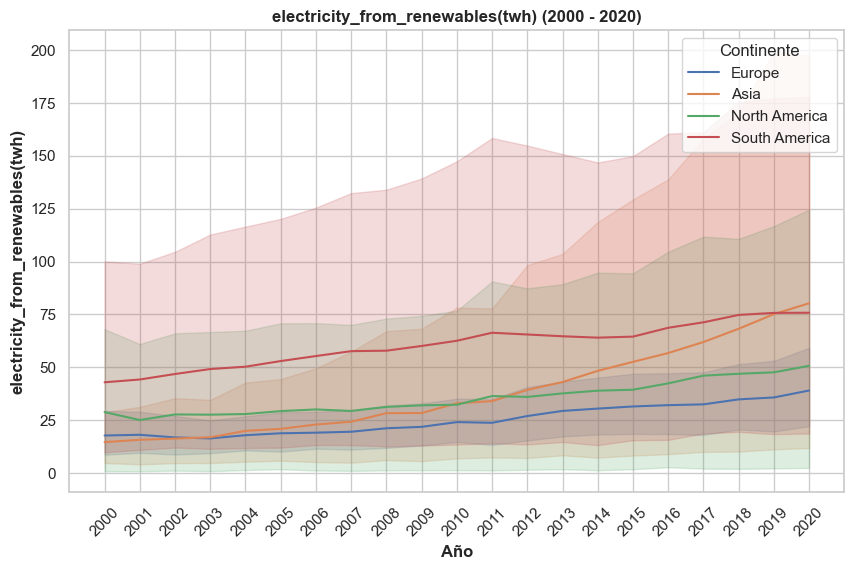

In [255]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='electricity_from_renewables(twh)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('electricity_from_renewables(twh)', fontweight='bold')
plt.title('electricity_from_renewables(twh) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

### Top 10 countries of  energy primary energy consumption  per capita as of 2020

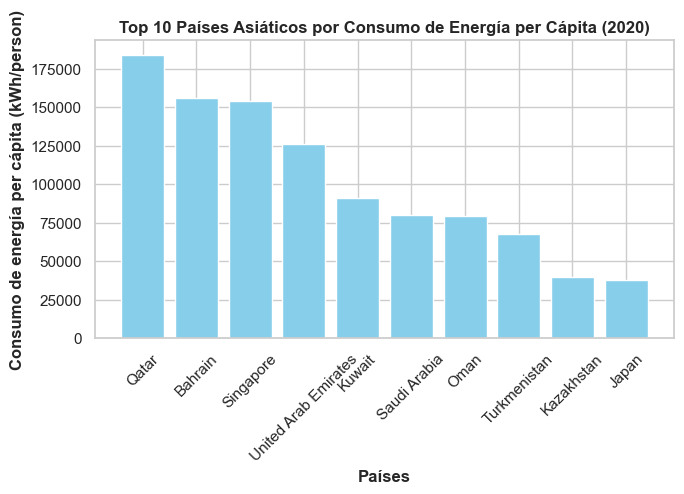

In [256]:
import matplotlib.pyplot as plt

# Filtrar los datos para incluir solo países de Asia en el año 2020
asia_2020 = df_all[(df_all['continent'] == 'Asia') & (df_all['year'] == 2020)]

# Ordenar los países por consumo de energía per cápita en orden descendente
top_10_asian_countries = asia_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)

# Crear un gráfico de barras
plt.figure(figsize=(7, 5))
plt.bar(top_10_asian_countries['entity'], top_10_asian_countries['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Asiáticos por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  # Rotar etiquetas del eje x para una mejor visualización

# Mostrar el gráfico
plt.tight_layout()
plt.show()

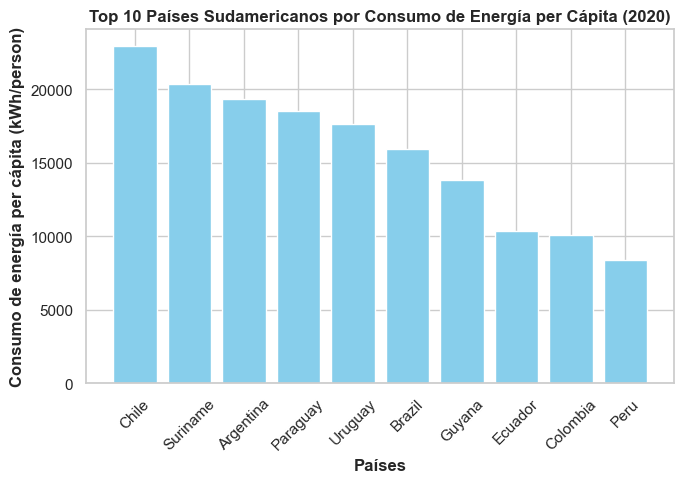

In [257]:
# Top 10 South America countries by energy consumption per capita as of 2020

sa_2020 = df_all[(df_all['continent'] == 'South America') & (df_all['year'] == 2020)]
top_10_sa = sa_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_sa['entity'], top_10_sa['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Sudamericanos por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

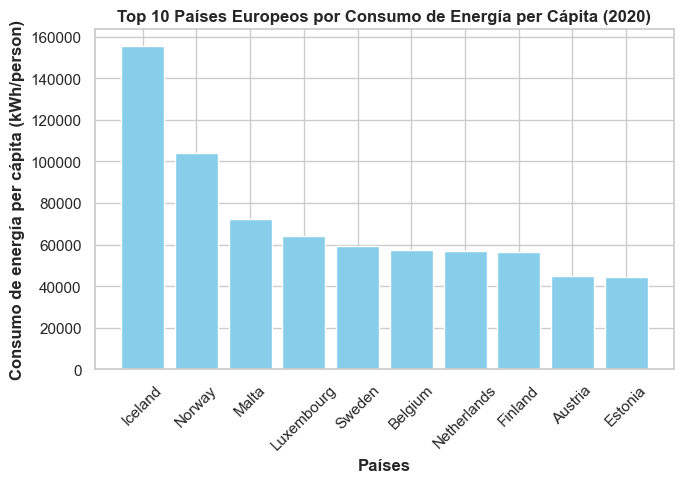

In [258]:
# Top 10 Europe countries by energy consumption per capita as of 2020
eu_2020 = df_all[(df_all['continent'] == 'Europe') & (df_all['year'] == 2020)]
top_10_eu = eu_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_eu['entity'], top_10_eu['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Europeos por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

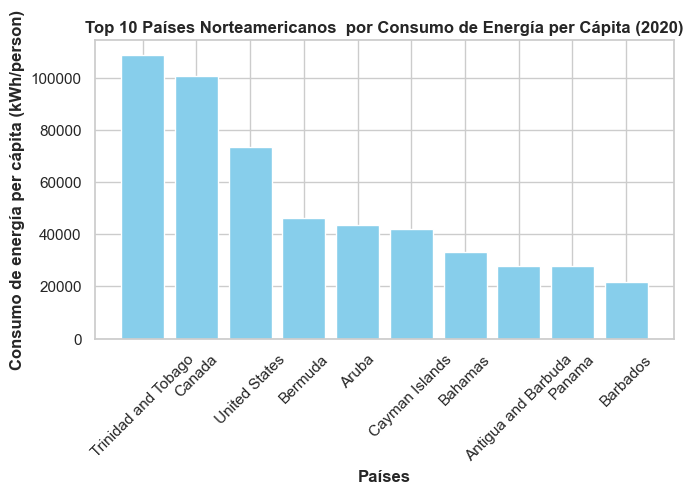

In [259]:
# Top 10 North America countries by energy consumption per capita as of 2020

na_2020 = df_all[(df_all['continent'] == 'North America') & (df_all['year'] == 2020)]
top_10_na = na_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_na['entity'], top_10_na['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Norteamericanos  por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

La tendencia en la generación de electricidad a partir de fuentes renovables puede verse influenciada por una serie de factores. Algunos de los factores que podrían contribuir a la tendencia observada de mayor generación de electricidad renovable en Sudamérica y Asia en comparación con Europa y América del Norte incluyen:

Recursos Renovables Disponibles: La disponibilidad de recursos renovables, como la radiación solar, el viento, la hidroenergía y la biomasa, puede variar significativamente de una región a otra. Sudamérica y algunas partes de Asia pueden tener un acceso más abundante a estos recursos, lo que facilita la generación de electricidad a partir de fuentes renovables.

Políticas Energéticas y Subvenciones: Las políticas gubernamentales y las subvenciones pueden jugar un papel importante en la promoción de la energía renovable. Si los gobiernos de Sudamérica y Asia han implementado políticas que favorecen la inversión en energías renovables, esto podría explicar un mayor crecimiento en la generación renovable.

Inversiones en Infraestructura: La inversión en infraestructura de energías renovables, como parques eólicos y plantas solares, puede impulsar la generación de electricidad renovable. Es posible que se hayan realizado más inversiones en Sudamérica y Asia en estos proyectos.

Demanda Energética: La demanda de energía también puede influir en la generación de electricidad renovable. Si la demanda de energía está aumentando más rápidamente en Sudamérica y Asia en comparación con Europa y América del Norte, esto podría explicar un mayor crecimiento en la generación renovable en esas regiones.

Costos de Tecnología: Los costos de tecnologías renovables, como paneles solares y turbinas eólicas, han disminuido en los últimos años. Esto hace que la generación de electricidad renovable sea más accesible y rentable en muchas regiones.

Conciencia Ambiental: La conciencia ambiental y la preocupación por el cambio climático también pueden influir en las decisiones de inversión y en la preferencia por fuentes de energía más limpias.

fuentes

Sudamérica:

Organización Latinoamericana de Energía (OLADE): Proporciona datos y estadísticas sobre energía en los países de América Latina y el Caribe. (Sitio web: https://www.olade.org/)
Banco Interamericano de Desarrollo (BID): Publica informes y análisis sobre el desarrollo energético en América Latina. (Sitio web: https://www.iadb.org/es)
Asia:

Agencia Internacional de Energías Renovables (IRENA): Ofrece datos y estadísticas sobre energía renovable en Asia y en todo el mundo. (Sitio web: https://www.irena.org/)
Asia Clean Energy Forum (ACEF): Realiza conferencias y proporciona información sobre energías limpias en Asia. (Sitio web: https://www.asiacleanenergyforum.org/)
Europa:

Agencia Internacional de Energía (IEA): Publica informes y análisis sobre el sector energético en Europa y otros continentes. (Sitio web: https://www.iea.org/)
Agencia Europea de Medio Ambiente (EEA): Ofrece datos sobre energía renovable y medio ambiente en Europa. (Sitio web: https://www.eea.europa.eu/)
América del Norte:

Administración de Información de Energía (EIA) de EE. UU.: Proporciona estadísticas y análisis sobre la energía en Estados Unidos. (Sitio web: https://www.eia.gov/)
Comisión de Energía de California: Ofrece información sobre políticas de energía renovable y regulaciones en California, EE. UU. (Sitio web: https://www.energy.ca.gov/)

"Among Asian countries, Qatar, Bahrain, Singapore, and the United Arab Emirates have the highest scores. This can be explained, if it is appropriate to say so, by the disproportion of the country's energy resources and the number of its inhabitants. In addition, these countries are very developed in terms of economy and infrastructure. They have a high level of industrialization, technological progress and a high standard of living. In addition, Qatar and the United Arab Emirates have significant deposits of natural fuel resources (gas and oil fields), which may also explain their leading positions to some extent.
The countries of South America and Africa have the lowest scores among all. This can be explained by poor infrastructure development and limited natural resources. In addition to this, low economic development goes hand in hand with a high level of crime, which further aggravates the current situation within the countries and complicates the processes of creating and consuming public goods.
The countries of Oceania cannot be reduced to a common feature. After all, the difference in energy consumption per capita varies from country to country. For example, New Caledonia, Australia and New Zealand have the highest rates among Oceania, but after the 3rd place (New Zealand), the rates decrease almost twice and tend to fall rapidly.
In general, among the European countries (which, for the most part, do not have significant deposits of natural resources), it can be argued that everything is based on economic ties and international cooperation. Energy imports are commonplace among European countries. In addition, well-developed infrastructure and high concentration of capital make it possible to almost offset the problems associated with limited energy reserves."

### BARRAS APILADAS COMPARATIVA FUENTES DE ELECTRICIDAD generadas por continente: FOSIL, NUCLEAR, RENOVABLE POR CONTINENTE

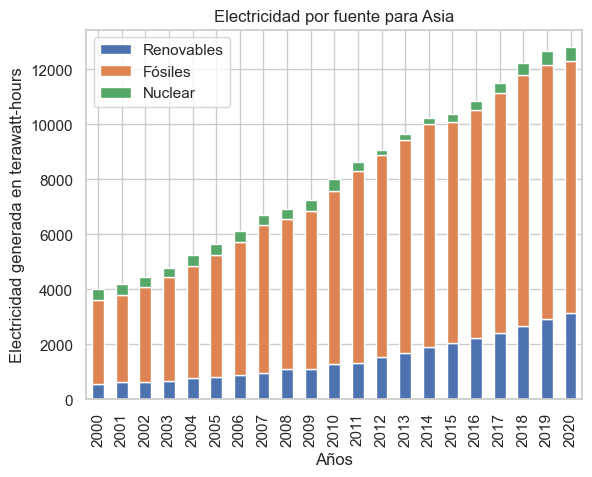

In [260]:

# 1. Agrupar los datos por año y continente y sumar las cantidades de electricidad
grouped_data = df_all.groupby(['year', 'continent'])[['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)']].sum().reset_index()

# 2. Crear un DataFrame con los datos agrupados para Asia
data_asia = grouped_data[grouped_data['continent'] == 'Asia']

# 3. Crear un gráfico de barras apiladas
fig, ax = plt.subplots()
data_asia.plot(x="year", y=['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)'],
               kind="bar", stacked=True, ax=ax)

plt.xlabel('Años')
plt.ylabel('Electricidad generada en terawatt-hours')
plt.title('Electricidad por fuente para Asia')
plt.legend(['Renovables', 'Fósiles', 'Nuclear'], loc='upper left')
plt.grid(True)

# Muestra el gráfico
plt.show()

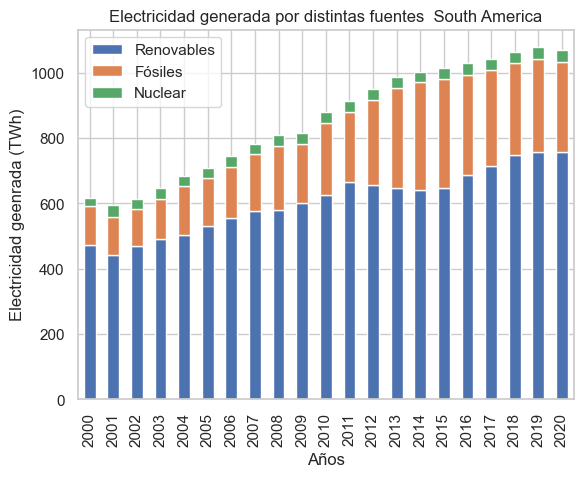

In [261]:

# 1. Agrupar los datos por año y continente y sumar las cantidades de electricidad
grouped_data = df_all.groupby(['year', 'continent'])[['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)']].sum().reset_index()

# 2. Crear un DataFrame con los datos agrupados para Asia
data_sa = grouped_data[grouped_data['continent'] == 'South America']

# 3. Crear un gráfico de barras apiladas
fig, ax = plt.subplots()
data_sa.plot(x="year", y=['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)'],
               kind="bar", stacked=True, ax=ax)

plt.xlabel('Años')
plt.ylabel('Electricidad geenrada (TWh)')
plt.title('Electricidad generada por distintas fuentes  South America')
plt.legend(['Renovables', 'Fósiles', 'Nuclear'], loc='upper left')
plt.grid(True)

# Muestra el gráfico
plt.show()

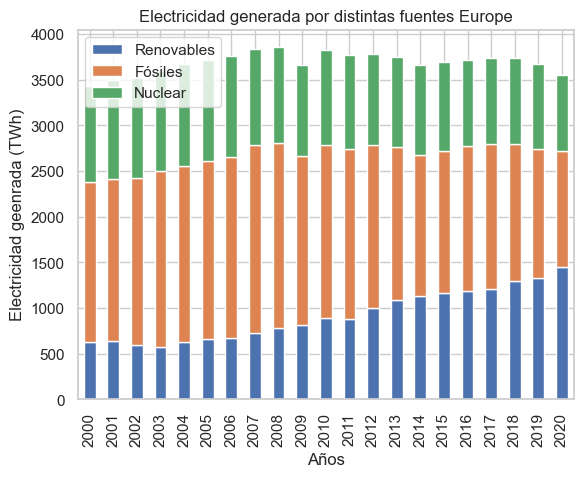

In [262]:

# 1. Agrupar los datos por año y continente y sumar las cantidades de electricidad
grouped_data = df_all.groupby(['year', 'continent'])[['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)']].sum().reset_index()

# 2. Crear un DataFrame con los datos agrupados para Asia
data_eu = grouped_data[grouped_data['continent'] == 'Europe']

# 3. Crear un gráfico de barras apiladas
fig, ax = plt.subplots()
data_eu.plot(x="year", y=['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)'],
               kind="bar", stacked=True, ax=ax)

plt.xlabel('Años')
plt.ylabel('Electricidad geenrada (TWh)')
plt.title('Electricidad generada por distintas fuentes Europe')
plt.legend(['Renovables', 'Fósiles', 'Nuclear'], loc='upper left')
plt.grid(True)

# Muestra el gráfico
plt.show()

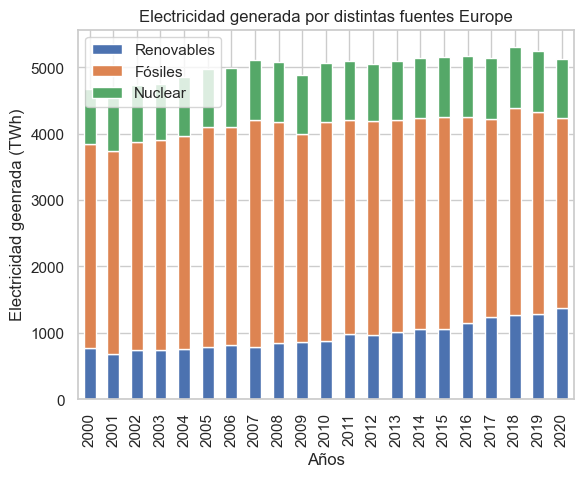

In [263]:

# 1. Agrupar los datos por año y continente y sumar las cantidades de electricidad
grouped_data = df_all.groupby(['year', 'continent'])[['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)']].sum().reset_index()

# 2. Crear un DataFrame con los datos agrupados para Asia
data_na = grouped_data[grouped_data['continent'] == 'North America']

# 3. Crear un gráfico de barras apiladas
fig, ax = plt.subplots()
data_na.plot(x="year", y=['electricity_from_renewables(twh)', 'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)'],
               kind="bar", stacked=True, ax=ax)

plt.xlabel('Años')
plt.ylabel('Electricidad geenrada (TWh)')
plt.title('Electricidad generada por distintas fuentes Europe')
plt.legend(['Renovables', 'Fósiles', 'Nuclear'], loc='upper left')
plt.grid(True)

# Muestra el gráfico
plt.show()

## Annual GDP growth rate based on constant local currency by continent

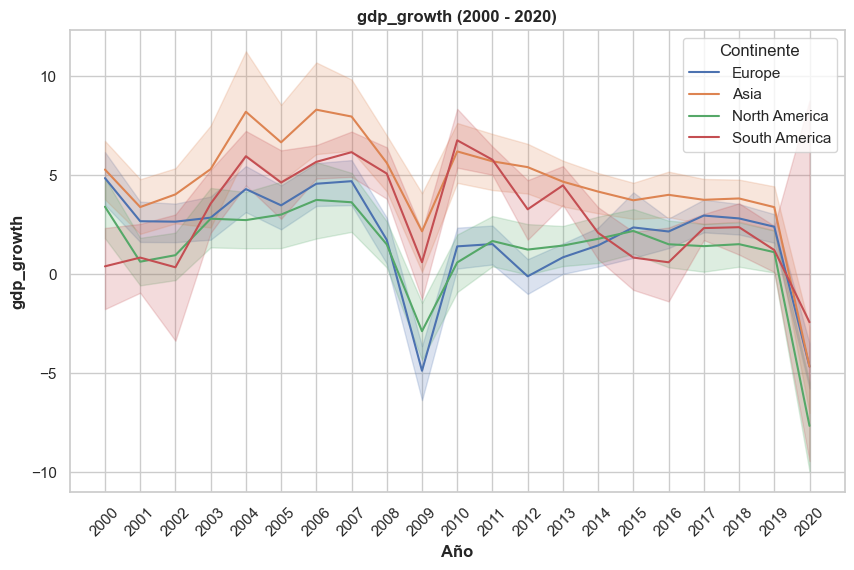

In [264]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='gdp_growth', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_growth', fontweight='bold')
plt.title('gdp_growth (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

## Gross domestic product per capita by continent

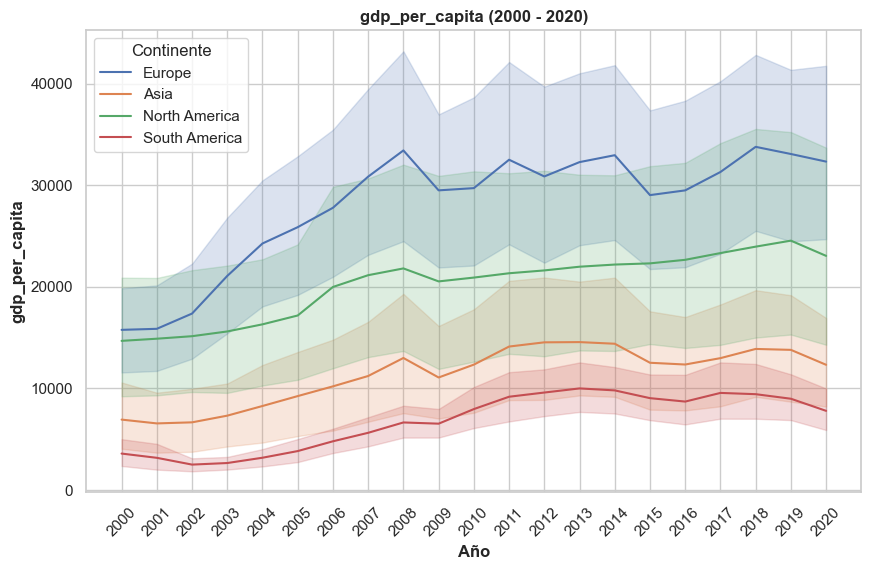

In [265]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='gdp_per_capita', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_per_capita', fontweight='bold')
plt.title('gdp_per_capita (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

### Primary Energy Consumption Analysis

Primary energy is energy that is extracted directly from its sources, before any transformation or conversion. The energy that is available in its raw or unprocessed form is used to power various sectors and industry

In [266]:
primary_energy_all = df_all[['entity','year','primary_energy_consumption_per_capita(kwh/person)','energy_intensity_level_of_primary_energy(mj/$2017pppgdp)','renewables(%equivalent_primary_energy)','gdp_per_capita']]
primary_energy_all

,entity,year,primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita
0,Albania,2000,9029.4375,4.13,0.000000,1126.683340
1,Albania,2001,8635.5320,3.89,0.000000,1281.659826
2,Albania,2002,9443.5550,4.10,0.000000,1425.124219
3,Albania,2003,10756.6120,3.80,0.000000,1846.120121
4,Albania,2004,11586.9510,3.96,0.000000,2373.581292
...,...,...,...,...,...,...
2355,Uruguay,2016,19814.2600,2.82,30.744228,16715.633470
2356,Uruguay,2017,19084.2480,2.71,30.744228,18690.893840
2357,Uruguay,2018,19538.7100,2.79,30.744228,18703.860290
2358,Uruguay,2019,19985.0100,2.77,30.744228,17688.015010


In [267]:
df_all.head(2)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.0,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.0,0.0,8.293313,1281.659826,105,28748.0,Europe


### Primary Energy Consumption & Gross Domestic Product (GDP) por pais que mas energia primariaconsume de cada continente

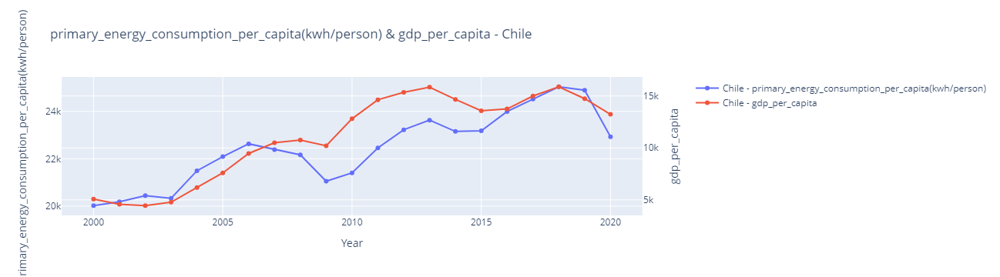

In [268]:
import plotly.subplots as sp
import plotly.graph_objs as go


# Selecciona el país que deseas mostrar
country = 'Chile'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

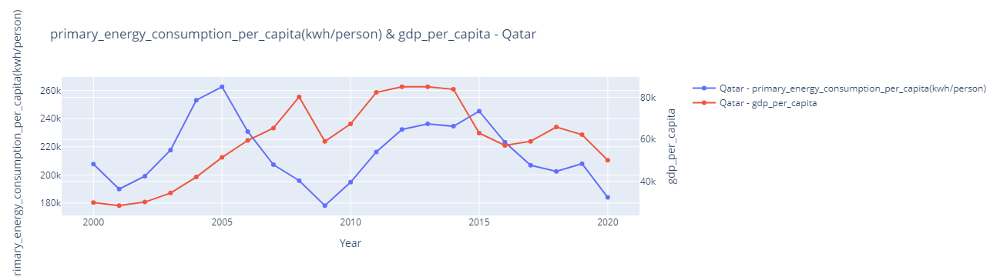

In [269]:
# Selecciona el país que deseas mostrar
country = 'Qatar'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

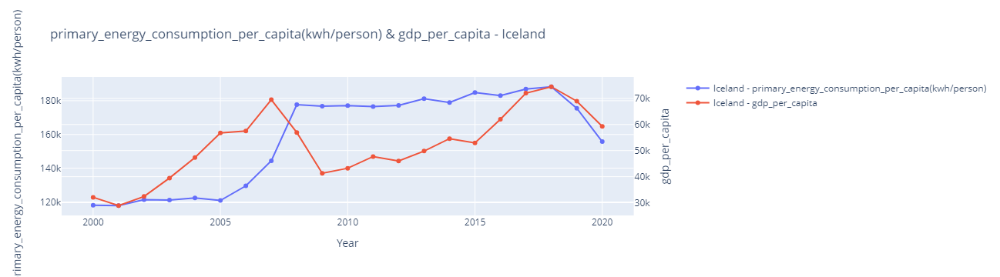

In [270]:
# Selecciona el país que deseas mostrar
country = 'Iceland'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

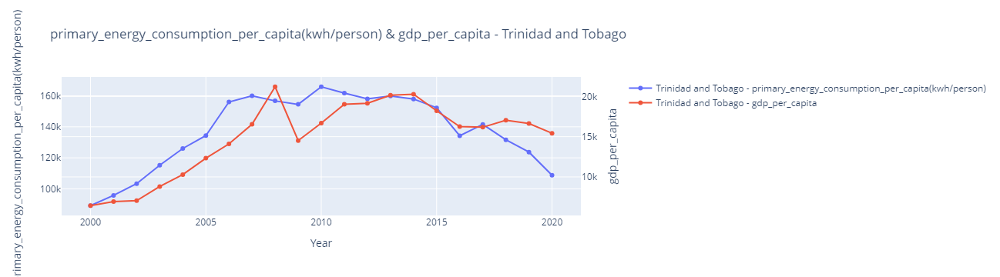

In [271]:
# Selecciona el país que deseas mostrar
country = 'Trinidad and Tobago'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

## Primary Energy Intensity

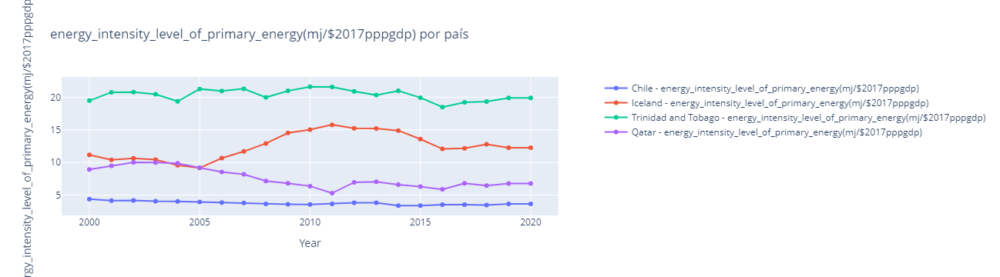

In [272]:
# Selecciona los países que deseas mostrar
countries = ['Chile', 'Iceland', 'Trinidad and Tobago', 'Qatar']

# Filtra el DataFrame para los países seleccionados
selected_data = df_all[df_all['entity'].isin(countries)]

# Especifica la columna que deseas comparar
column = 'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
for country in countries:
    country_data = selected_data[selected_data['entity'] == country]
    fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column], name=f'{country} - {column}', mode='lines+markers'), secondary_y=False)

fig.update_layout(title=f'{column} por país', xaxis_title='Year', yaxis_title='Valor')
fig.update_yaxes(title_text=column, secondary_y=False)
fig.show()

Energy intensity level of primary energy. Energy intensity is defined as the energy supplied to the economy per unit value of economic output (megajoules per constant 2011 purchasing power parity GDP).TARGET 7.3 By 2030, double the global rate of improvement in energy efficiency. La variable "Energy intensity level of primary energy, MJ/constant 2011 PPP GDP" (Nivel de intensidad energética de la energía primaria, MJ/PIB constante de 2011 en paridad de poder adquisitivo) es una medida que evalúa la eficiencia energética de un país en relación con su Producto Interno Bruto (PIB) ajustado a la paridad de poder adquisitivo (PPA) en términos constantes de 2011. Esta medida se utiliza para cuantificar la cantidad de energía primaria que un país consume para producir un cierto valor de PIB.

En términos simples, indica cuánta energía se necesita para generar una unidad de valor económico en el país. Cuanto menor sea el valor de esta variable, mayor será la eficiencia energética del país, ya que significa que está utilizando menos energía para producir su PIB.

El hecho de que se ajuste a términos constantes de 2011 y se exprese en paridad de poder adquisitivo (PPA) significa que se han tenido en cuenta las variaciones en los precios y el valor del dinero a lo largo del tiempo y entre los países para hacer comparaciones más precisas y equitativas en términos de eficiencia energética.

En resumen, una menor "Energy intensity level of primary energy, MJ/constant 2011 PPP GDP" indica una mayor eficiencia energética en la producción económica de un país, mientras que un valor más alto sugiere que el país consume más energía para generar su PIB.

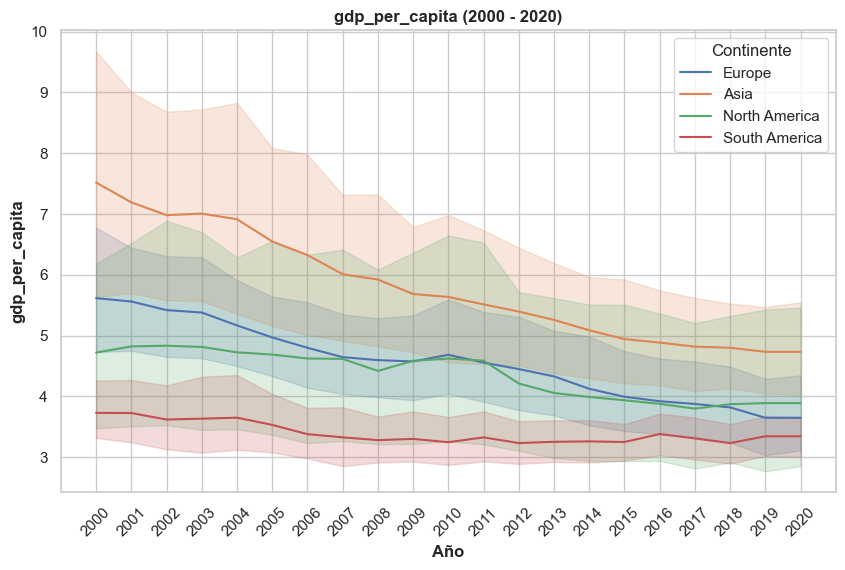

In [273]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='energy_intensity_level_of_primary_energy(mj/$2017pppgdp)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_per_capita', fontweight='bold')
plt.title('gdp_per_capita (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

## C02 EMISSIONS ANALYSIS  BY CONTINENT

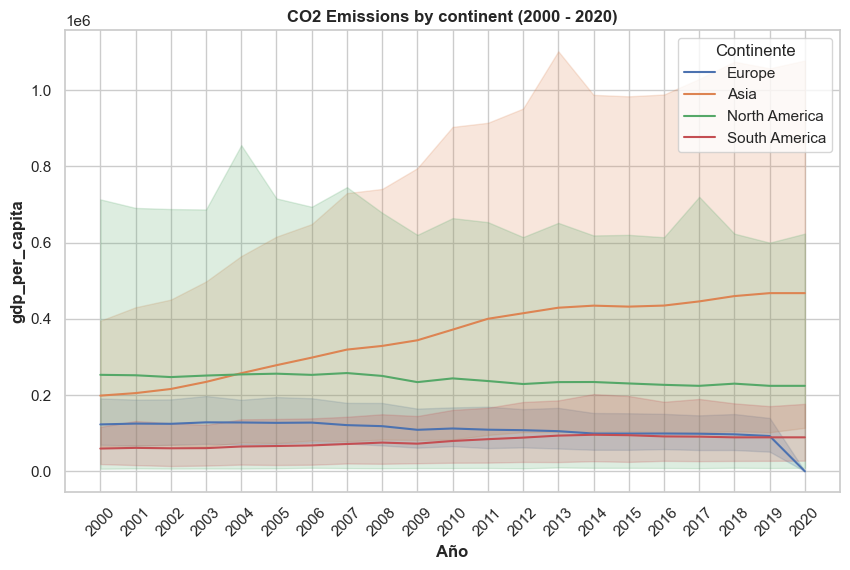

In [274]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='CO2_emissions_value_by_country_kt', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_per_capita', fontweight='bold')
plt.title('CO2 Emissions by continent (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

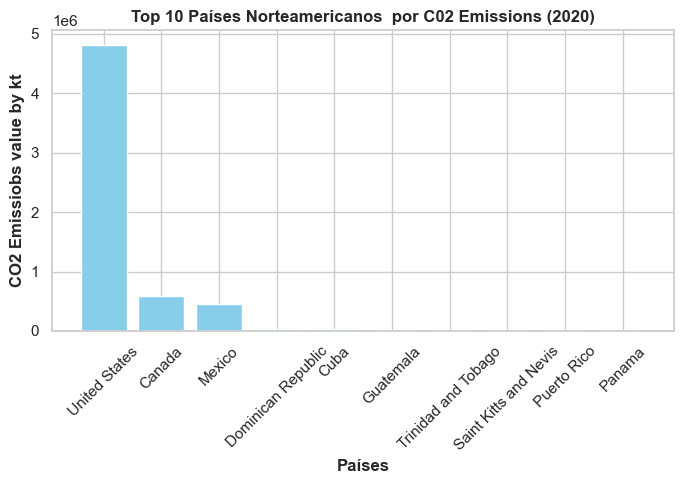

In [275]:
# Top 10 North America countries by C02

nac02_2020 = df_all[(df_all['continent'] == 'North America') & (df_all['year'] == 2020)]
top_10_na_c02 = nac02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_na_c02['entity'], top_10_na_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Norteamericanos  por C02 Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

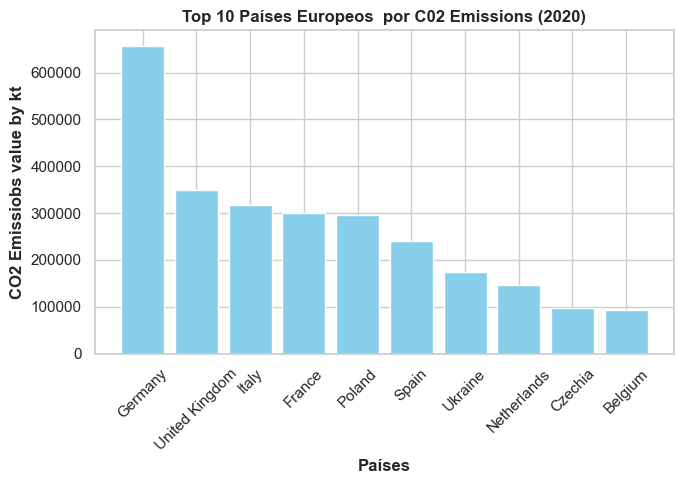

In [276]:

euc02_2020 = df_all[(df_all['continent'] == 'Europe') & (df_all['year'] == 2019)]
top_10_eu_c02 = euc02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_eu_c02['entity'], top_10_eu_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Europeos  por C02 Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

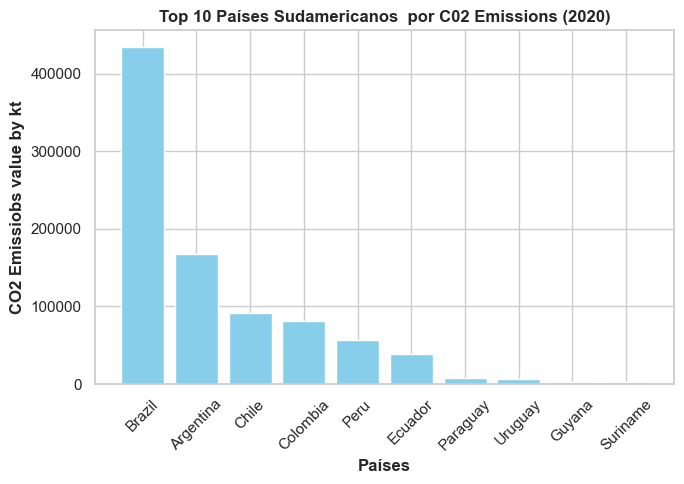

In [277]:
sac02_2020 = df_all[(df_all['continent'] == 'South America') & (df_all['year'] == 2020)]
top_10_sa_c02 = sac02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_sa_c02['entity'], top_10_sa_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Sudamericanos  por C02 Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

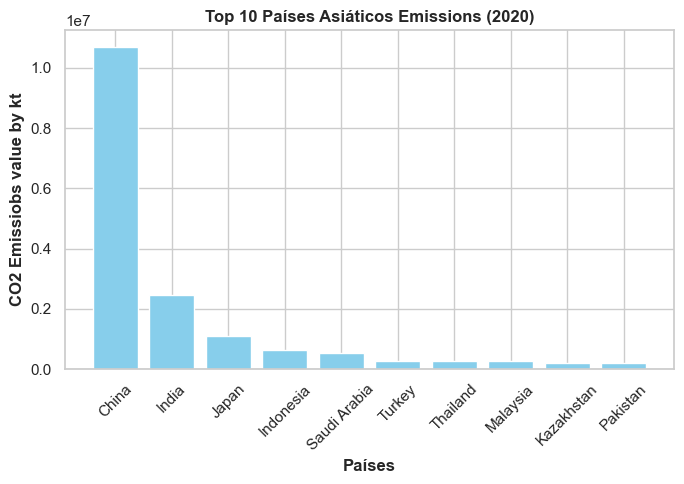

In [278]:
asiac02_2020 = df_all[(df_all['continent'] == 'Asia') & (df_all['year'] == 2020)]
top_10_asia_c02 = asiac02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_asia_c02['entity'], top_10_asia_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Asiáticos Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

In [459]:
df_all

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent,cluster
0,Albania,2000,100.0,38.2,0.00,0.0,0.00,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.000000,6.946217,1126.683340,105,28748.0,Europe,2
1,Albania,2001,100.0,40.5,0.00,0.0,0.00,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.000000,8.293313,1281.659826,105,28748.0,Europe,2
2,Albania,2002,100.0,43.2,0.00,0.0,0.00,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.000000,4.536524,1425.124219,105,28748.0,Europe,2
3,Albania,2003,100.0,46.4,0.00,0.0,0.00,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.000000,5.528637,1846.120121,105,28748.0,Europe,2
4,Albania,2004,100.0,49.0,0.00,0.0,0.00,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.000000,5.514668,2373.581292,105,28748.0,Europe,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2355,Uruguay,2016,99.7,100.0,929.73,69860000.0,60.32,1.34,0.0,12.41,90.254550,19814.2600,2.82,6519.999981,30.744228,1.689798,16715.633470,20,176215.0,South America,1
2356,Uruguay,2017,99.8,100.0,1080.97,18290000.0,60.82,1.32,0.0,12.93,90.736840,19084.2480,2.71,6099.999905,30.744228,1.627754,18690.893840,20,176215.0,South America,1
2357,Uruguay,2018,99.8,100.0,1078.68,18290000.0,60.86,1.36,0.0,13.14,90.620690,19538.7100,2.79,6539.999962,30.744228,0.477907,18703.860290,20,176215.0,South America,1
2358,Uruguay,2019,99.9,100.0,1077.57,18290000.0,60.76,1.89,0.0,14.16,88.224304,19985.0100,2.77,6489.999771,30.744228,0.350447,17688.015010,20,176215.0,South America,1


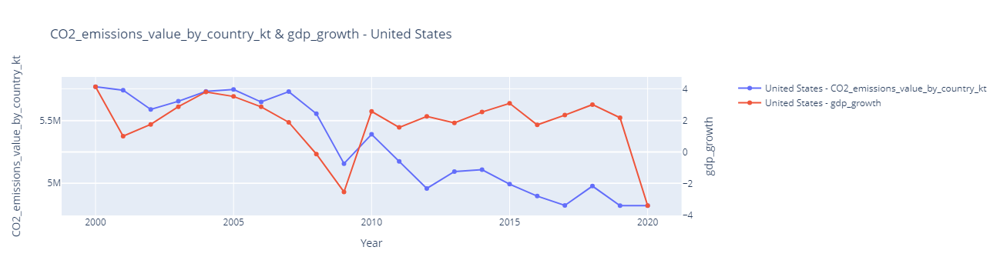

In [279]:

# Selecciona el país que deseas mostrar
country = 'United States'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'CO2_emissions_value_by_country_kt'
column_2 = 'gdp_growth'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

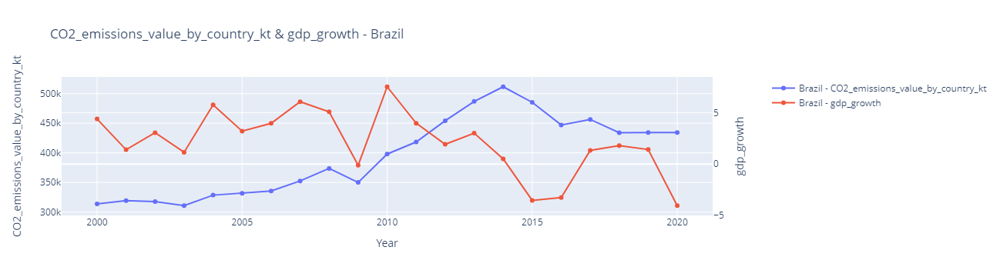

In [280]:
# Selecciona el país que deseas mostrar
country = 'Brazil'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'CO2_emissions_value_by_country_kt'
column_2 = 'gdp_growth'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

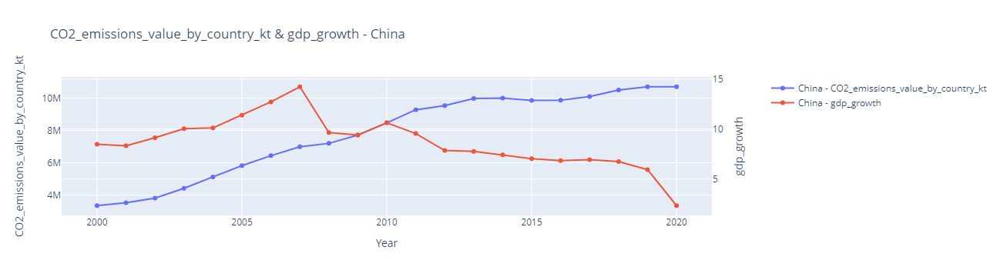

In [281]:
# Selecciona el país que deseas mostrar
country = 'China'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'CO2_emissions_value_by_country_kt'
column_2 = 'gdp_growth'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

### Corriente financiera

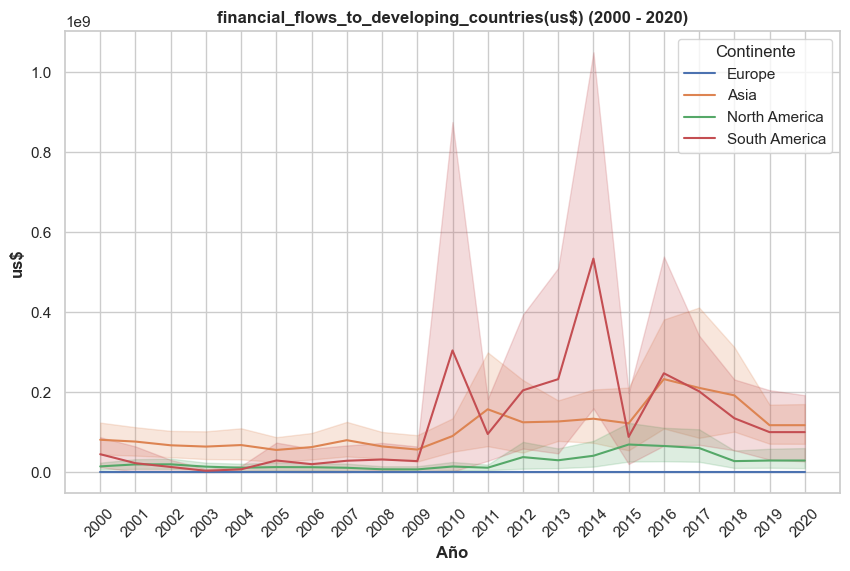

In [282]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='financial_flows_to_developing_countries(us$)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('us$', fontweight='bold')
plt.title('financial_flows_to_developing_countries(us$) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

In [283]:
df_all.head()

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,105,28748.0,Europe
2,Albania,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,105,28748.0,Europe
3,Albania,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,105,28748.0,Europe
4,Albania,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,105,28748.0,Europe


In [284]:
df_all.isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

# Feature correlatiomn analysis

In [285]:
df_all_cat=df_all.select_dtypes(include=['object'])
df_all_cat.head(5)

,entity,density(P/km2),continent
0,Albania,105,Europe
1,Albania,105,Europe
2,Albania,105,Europe
3,Albania,105,Europe
4,Albania,105,Europe


In [286]:
df_all_num= df_all.select_dtypes(exclude=["object"])
df_all_num.head(5)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,28748.0
1,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,28748.0
2,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,28748.0
3,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,28748.0
4,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,28748.0


In [287]:
df_all_num.isnull().sum().sort_values(ascending=False)

year                                                               0
low_carbonelectricity(%electricity)                                0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
electricity_from_renewables(twh)                                   0
access_to_electricity(%_of_population)                             0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_total_final_energy_consumption(%)    0
financial_flows_to_developing_countries(us$)                       0
renewable_electricity_generating_c

Text(0.0, 1.0, 'CORRELATIONS HEATMAP FOR NUMERICAL DATA')

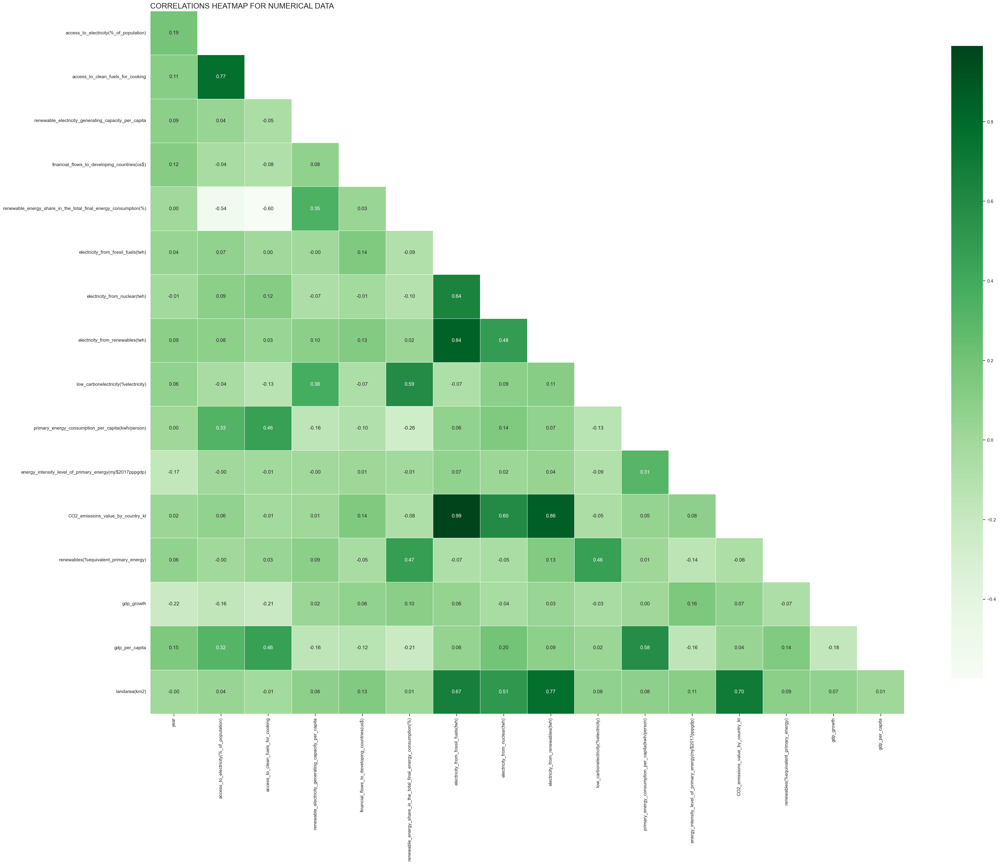

In [288]:
corr = df_all_num.corr()
ones = np.ones_like(corr, dtype="bool")
mask = np.triu(ones)
mask = mask[1:, :-1]
corr = corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(40,30))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="Greens", linewidths=.6, cbar_kws={"shrink":.9})
ax.xaxis.tick_bottom()
plt.title("Correlations heatmap for numerical data".upper(), fontdict={"fontsize": 18}, loc="left")

In [289]:
#High correlation:.80 to 1
#Mean correlation:.60 to .80
#Low correlation: .40 to .60


In [290]:
corr = df_all_num.corr()
high_corr = corr[corr > 0.80]
high_corr = high_corr.unstack().dropna()
high_corr = high_corr[high_corr.index.get_level_values(0) != high_corr.index.get_level_values(1)]

for index, value in high_corr.items():
    variable_1, variable_2 = index
    correlation_value = value
    print("Variables:", variable_1, "and", variable_2)
    print("Correlation:", correlation_value)
    print("------------------------")

Variables: electricity_from_fossil_fuels(twh) and electricity_from_renewables(twh)
Correlation: 0.8438797621769125
------------------------
Variables: electricity_from_fossil_fuels(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.9897914559622468
------------------------
Variables: electricity_from_renewables(twh) and electricity_from_fossil_fuels(twh)
Correlation: 0.8438797621769125
------------------------
Variables: electricity_from_renewables(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.8566907489874316
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_fossil_fuels(twh)
Correlation: 0.9897914559622468
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_renewables(twh)
Correlation: 0.8566907489874316
------------------------


electricity_from_fossil_fuels(twh) and electricity_from_renewables(twh)
electricity_from_fossil_fuels(twh) and CO2_emissions_value_by_country_kt
CO2_emissions_value_by_country_kt and electricity_from_renewables(twh)
CO2_emissions_value_by_country_kt and electricity_from_fossil_fuels(twh)

Correlations Results

- Correlación entre electricidad de combustibles fósiles y electricidad de energías renovables: La correlación positiva de 0.8439 entre "electricidad_from_fossil_fuels(twh)" y "electricity_from_renewables(twh)" sugiere que, en general, los países que producen más electricidad a partir de fuentes de energía fósil también tienden a producir más electricidad a partir de fuentes renovables. Esto puede ser un reflejo de la inversión en infraestructura energética en general en esos países, donde algunos pueden estar avanzando en ambas fuentes de energía.

- Correlación entre electricidad de combustibles fósiles y emisiones de CO2: La alta correlación de 0.9898 entre "electricidad_from_fossil_fuels(twh)" y "CO2_emissions_value_by_country_kt" indica que hay una fuerte relación entre la producción de electricidad a partir de fuentes de energía fósil y las emisiones de dióxido de carbono (CO2). Esto es esperado, ya que la quema de combustibles fósiles es una de las principales fuentes de emisiones de CO2 en todo el mundo.

- Correlación entre electricidad de energías renovables y emisiones de CO2: La correlación positiva de 0.8567 entre "electricity_from_renewables(twh)" y "CO2_emissions_value_by_country_kt" sugiere que, en general, los países que producen más electricidad a partir de fuentes renovables también tienden a tener emisiones de CO2 más bajas. Esto es consistente con la idea de que el uso de fuentes de energía renovable puede contribuir a una menor huella de carbono.

En resumen, estas correlaciones sugieren que existe una relación significativa entre la producción de electricidad a partir de diferentes fuentes (fósiles y renovables) y las emisiones de CO2 a nivel de país. 

- Correlación negativa entre "Renewable energy share" y "Access to electricity":

Una correlación negativa significa que a medida que aumenta el porcentaje de energía renovable en el consumo final de energía, disminuye el acceso a la electricidad en la población.
Esto podría deberse a que en algunos países o regiones, donde la energía renovable representa una parte significativa del suministro de energía, la infraestructura eléctrica puede no estar tan desarrollada como en áreas con una mayor dependencia de fuentes de energía no renovable.
También podría sugerir que en países donde el acceso a la electricidad es un desafío, se depende más de fuentes de energía no renovable tradicionales para generar electricidad.

- Correlación nrgativa entre "Renewable energy share" y "Access to clean fuels for cooking":

Una correlación negativa indica que a medida que aumenta el uso de energía renovable en el consumo final de energía, disminuye el acceso a combustibles limpios para cocinar.
Esto podría explicarse por el hecho de que en algunas áreas con un mayor uso de energía renovable, es posible que no se haya abordado adecuadamente el acceso a fuentes de combustible limpio para cocinar, lo que podría indicar desigualdades en el desarrollo de infraestructura energética.
También podría reflejar que en áreas con menor acceso a la electricidad, es más probable que la población dependa de combustibles tradicionales no limpios, como la biomasa o el carbón, para cocinar.
En resumen, estas correlaciones sugieren que existe una relación inversa entre el uso de energía renovable y el acceso a servicios energéticos esenciales, como la electricidad y los combustibles limpios para cocinar, en los datos que estás analizando. Sin embargo, es importante recordar que la correlación no implica causalidad y que estas relaciones pueden estar influenciadas por una serie de factores socioeconómicos y políticos específicos de cada país o región.

In [291]:
df_all_num.columns

Index(['year', 'access_to_electricity(%_of_population)',
       'access_to_clean_fuels_for_cooking',
       'renewable_electricity_generating_capacity_per_capita',
       'financial_flows_to_developing_countries(us$)',
       'renewable_energy_share_in_the_total_final_energy_consumption(%)',
       'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)',
       'electricity_from_renewables(twh)',
       'low_carbonelectricity(%electricity)',
       'primary_energy_consumption_per_capita(kwh/person)',
       'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)',
       'CO2_emissions_value_by_country_kt',
       'renewables(%equivalent_primary_energy)', 'gdp_growth',
       'gdp_per_capita', 'landarea(km2)'],
      dtype='object')

In [292]:
#VIF
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

features = ['year', 'access_to_electricity(%_of_population)',
       'access_to_clean_fuels_for_cooking',
       'renewable_electricity_generating_capacity_per_capita',
       'financial_flows_to_developing_countries(us$)',
       'renewable_energy_share_in_the_total_final_energy_consumption(%)',
       'electricity_from_fossil_fuels(twh)', 'electricity_from_nuclear(twh)',
       'electricity_from_renewables(twh)',
       'low_carbonelectricity(%electricity)',
       'primary_energy_consumption_per_capita(kwh/person)',
       'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)',
       'CO2_emissions_value_by_country_kt',
       'renewables(%equivalent_primary_energy)', 'gdp_growth',
       'gdp_per_capita', 'landarea(km2)']
         

def calculate_vif(df, features):    
    vif, tolerance, r2sq = {}, {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        r2sq[feature] = r2
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance, 'R2': r2sq})

In [293]:
calculate_vif(df_all_num, features)

,VIF,Tolerance,R2
year,1.190918,0.839689,0.160311
access_to_electricity(%_of_population),2.922642,0.342156,0.657844
access_to_clean_fuels_for_cooking,3.884237,0.257451,0.742549
renewable_electricity_generating_capacity_per_capita,1.452721,0.688363,0.311637
financial_flows_to_developing_countries(us$),1.097872,0.910853,0.089147
renewable_energy_share_in_the_total_final_energy_consumption(%),4.389289,0.227827,0.772173
electricity_from_fossil_fuels(twh),77.874914,0.012841,0.987159
electricity_from_nuclear(twh),2.793878,0.357925,0.642075
electricity_from_renewables(twh),6.215692,0.160883,0.839117
low_carbonelectricity(%electricity),2.382878,0.419661,0.580339


Interpreting R square k - If $R^2_k$ equals zero, variable k is not correlated with any other independent variable. Usually, multicollinearity is a potential problem when $R^2_k$ is greater than 0.75 and, a serious problem when $R^2_k$ is greater than 0.9.

Interpretation of the variance inflation factor: If $VIF_k = 1$, variable k is not correlated with any other independent variable. Multicollinearity is a potential problem when VIFk is greater than 5 and, a serious problem when it is greater than 10.

Interpretation of tolerance A tolerance of less than 0.20 or 0.10 indicates a multicollinearity problem.

In [294]:
features = ['access_to_electricity(%_of_population)',
       
       'renewable_electricity_generating_capacity_per_capita',
       'financial_flows_to_developing_countries(us$)',
       
       'electricity_from_nuclear(twh)',
       
       'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)',

       'renewables(%equivalent_primary_energy)',
       'gdp_per_capita']
         

def calculate_vif(df, features):    
    vif, tolerance, r2sq = {}, {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        r2sq[feature] = r2
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance, 'R2': r2sq})

In [295]:
calculate_vif(df_all_num, features)

,VIF,Tolerance,R2
access_to_electricity(%_of_population),1.129653,0.885228,0.114772
renewable_electricity_generating_capacity_per_capita,1.054005,0.948762,0.051238
financial_flows_to_developing_countries(us$),1.020117,0.980279,0.019721
electricity_from_nuclear(twh),1.050373,0.952043,0.047957
energy_intensity_level_of_primary_energy(mj/$2017pppgdp),1.044196,0.957675,0.042325
renewables(%equivalent_primary_energy),1.056590,0.946441,0.053559
gdp_per_capita,1.259492,0.793971,0.206029


## Modelling: Primary energy consumption per capita( kwh/person) Forecast

### Modelo de regresion lineal para predecir nuestro target realizado con los cuatro continentes

In [296]:
#Savin features selection

df_num_l=df_all_num[['access_to_electricity(%_of_population)', 'renewable_electricity_generating_capacity_per_capita',	'financial_flows_to_developing_countries(us$)', 'electricity_from_nuclear(twh)', 'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)', 'renewables(%equivalent_primary_energy)', 'gdp_per_capita', 'primary_energy_consumption_per_capita(kwh/person)']]
df_num_l= df_num_l.reset_index()
df_num_l = df_num_l.drop(columns=['index'])
df_num_l

,access_to_electricity(%_of_population),renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),electricity_from_nuclear(twh),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita,primary_energy_consumption_per_capita(kwh/person)
0,100.0,0.00,0.0,0.0,4.13,0.000000,1126.683340,9029.4375
1,100.0,0.00,0.0,0.0,3.89,0.000000,1281.659826,8635.5320
2,100.0,0.00,0.0,0.0,4.10,0.000000,1425.124219,9443.5550
3,100.0,0.00,0.0,0.0,3.80,0.000000,1846.120121,10756.6120
4,100.0,0.00,0.0,0.0,3.96,0.000000,2373.581292,11586.9510
...,...,...,...,...,...,...,...,...
2355,99.7,929.73,69860000.0,0.0,2.82,30.744228,16715.633470,19814.2600
2356,99.8,1080.97,18290000.0,0.0,2.71,30.744228,18690.893840,19084.2480
2357,99.8,1078.68,18290000.0,0.0,2.79,30.744228,18703.860290,19538.7100
2358,99.9,1077.57,18290000.0,0.0,2.77,30.744228,17688.015010,19985.0100


In [297]:
#X-y split 
y=df_num_l['primary_energy_consumption_per_capita(kwh/person)']
X=df_num_l.drop(['primary_energy_consumption_per_capita(kwh/person)'],axis=1)
X

,access_to_electricity(%_of_population),renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),electricity_from_nuclear(twh),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita
0,100.0,0.00,0.0,0.0,4.13,0.000000,1126.683340
1,100.0,0.00,0.0,0.0,3.89,0.000000,1281.659826
2,100.0,0.00,0.0,0.0,4.10,0.000000,1425.124219
3,100.0,0.00,0.0,0.0,3.80,0.000000,1846.120121
4,100.0,0.00,0.0,0.0,3.96,0.000000,2373.581292
...,...,...,...,...,...,...,...
2355,99.7,929.73,69860000.0,0.0,2.82,30.744228,16715.633470
2356,99.8,1080.97,18290000.0,0.0,2.71,30.744228,18690.893840
2357,99.8,1078.68,18290000.0,0.0,2.79,30.744228,18703.860290
2358,99.9,1077.57,18290000.0,0.0,2.77,30.744228,17688.015010


In [298]:
#Encodiing categorical data 
from sklearn.preprocessing import OneHotEncoder
encoder=OneHotEncoder(drop='first').fit(df_all_cat)
encoder=encoder.transform(df_all_cat).toarray()
encoder

array([[1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [299]:
#Normalizing numerical data 
from sklearn.preprocessing import StandardScaler 
transformer=StandardScaler().fit(X)
X_norm=transformer.transform(X)
X_norm

array([[ 0.43021915, -0.45166585, -0.30391553, ..., -0.20611336,
        -0.86534058, -0.80663581],
       [ 0.43021915, -0.45166585, -0.30391553, ..., -0.27625502,
        -0.86534058, -0.79944867],
       [ 0.43021915, -0.45166585, -0.30391553, ..., -0.21488107,
        -0.86534058, -0.79279541],
       ...,
       [ 0.41561275,  3.62571671, -0.20282563, ..., -0.59773758,
         1.26163592,  0.00851787],
       [ 0.42291595,  3.62152094, -0.20282563, ..., -0.60358272,
         1.26163592, -0.03859265],
       [ 0.43021915,  3.612449  , -0.20282563, ..., -0.60358272,
         1.26163592, -0.14291956]])

In [300]:
X=np.concatenate((X_norm ,encoder),axis=1)
X

array([[ 0.43021915, -0.45166585, -0.30391553, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.43021915, -0.45166585, -0.30391553, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.43021915, -0.45166585, -0.30391553, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [ 0.41561275,  3.62571671, -0.20282563, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.42291595,  3.62152094, -0.20282563, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.43021915,  3.612449  , -0.20282563, ...,  0.        ,
         0.        ,  1.        ]])

In [301]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42)

In [302]:
X_train.shape

(1652, 218)

In [303]:
X_test.shape

(708, 218)

In [304]:
# Crear y ajustar el modelo de regresión lineal
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [305]:
# Realizar las predicciones en conjunto de entrenamiento y conjunto de prueba
y_train_pred = regression_model.predict(X_train)
y_test_pred = regression_model.predict(X_test)

In [306]:
# Calcular las métricas
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
rmse_train = sqrt(mse_train)

r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = sqrt(mse_test)

In [307]:
# Imprimir las métricas
print("Métricas en conjunto de entrenamiento:")
print("R^2:", r2_train)
print("MSE:", mse_train)
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("------------------------------")
print("Métricas en conjunto de prueba:")
print("R^2:", r2_test)
print("MSE:", mse_test)
print("MAE:", mae_test)
print("RMSE:", rmse_test)

Métricas en conjunto de entrenamiento:
R^2: 0.9758707859909201
MSE: 34073094.5035957
MAE: 3027.9388690496367
RMSE: 5837.216331745441
------------------------------
Métricas en conjunto de prueba:
R^2: 0.9738471974986119
MSE: 43458965.83241701
MAE: 3445.431845155367
RMSE: 6592.3414529601705


In [308]:
#problema de overfitting

### Modelo de regresion lineal realizado con los dos continentes más desarrollados en materia de sostenibilidad, Europe - North America y realizamos otra regresion con Asia - South America 

In [309]:
df_dev = pd.concat([continent_data['Europe'], continent_data['North America']], axis=0)
df_dev.reset_index(drop=True, inplace=True)
df_dev.head(10)          

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,105,28748.0,Europe
2,Albania,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,105,28748.0,Europe
3,Albania,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,105,28748.0,Europe
4,Albania,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,105,28748.0,Europe
5,Albania,2005,100.0,51.9,0.0,0.0,0.0,0.07,0.0,5.32,98.701300,11545.6160,3.75,4030.000210,0.0,5.526424,2673.786584,105,28748.0,Europe
6,Albania,2006,100.0,54.8,0.0,0.0,0.0,0.09,0.0,4.95,98.214280,10976.7280,3.46,4010.000229,0.0,5.902659,2972.742924,105,28748.0,Europe
7,Albania,2007,100.0,58.1,0.0,0.0,0.0,0.07,0.0,2.76,97.526505,9534.8740,3.12,4139.999866,0.0,5.983260,3595.038057,105,28748.0,Europe
8,Albania,2008,100.0,60.8,0.0,0.0,0.0,0.07,0.0,3.76,98.172325,10499.3280,3.01,4079.999924,0.0,7.500041,4370.539925,105,28748.0,Europe
9,Albania,2009,100.0,63.6,0.0,0.0,0.0,0.00,0.0,5.20,100.000000,11524.4280,2.98,4219.999790,0.0,3.354289,4114.134899,105,28748.0,Europe


In [310]:
df_dev.shape

(1330, 20)

In [311]:
df_dev_num= df_dev.select_dtypes(exclude=["object"])
df_dev_num.head(5)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,28748.0
1,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,28748.0
2,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,28748.0
3,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,28748.0
4,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,28748.0


In [312]:
df_dev_num.isnull().sum().sort_values(ascending=False)

year                                                               0
low_carbonelectricity(%electricity)                                0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
electricity_from_renewables(twh)                                   0
access_to_electricity(%_of_population)                             0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_total_final_energy_consumption(%)    0
financial_flows_to_developing_countries(us$)                       0
renewable_electricity_generating_c

In [313]:
df_dev_cat= df_dev.select_dtypes(include=["object"])
df_dev_cat.head(5)

,entity,density(P/km2),continent
0,Albania,105,Europe
1,Albania,105,Europe
2,Albania,105,Europe
3,Albania,105,Europe
4,Albania,105,Europe


In [314]:
corr = df_dev_num.corr()
high_corr = corr[corr > 0.80]
high_corr = high_corr.unstack().dropna()
high_corr = high_corr[high_corr.index.get_level_values(0) != high_corr.index.get_level_values(1)]

for index, value in high_corr.items():
    variable_1, variable_2 = index
    correlation_value = value
    print("Variables:", variable_1, "and", variable_2)
    print("Correlation:", correlation_value)
    print("------------------------")

Variables: electricity_from_fossil_fuels(twh) and electricity_from_nuclear(twh)
Correlation: 0.8730861592407058
------------------------
Variables: electricity_from_fossil_fuels(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.9953098931166098
------------------------
Variables: electricity_from_nuclear(twh) and electricity_from_fossil_fuels(twh)
Correlation: 0.8730861592407058
------------------------
Variables: electricity_from_nuclear(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.8924513724924181
------------------------
Variables: electricity_from_renewables(twh) and landarea(km2)
Correlation: 0.9022555182673455
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_fossil_fuels(twh)
Correlation: 0.9953098931166098
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_nuclear(twh)
Correlation: 0.8924513724924181
------------------------
Variables: landarea(km2) and electricity_from_renewab

In [315]:
features = ['access_to_electricity(%_of_population)',
       
       'renewable_electricity_generating_capacity_per_capita',
       'financial_flows_to_developing_countries(us$)',
       
       'electricity_from_nuclear(twh)',
       
       'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)',

       'renewables(%equivalent_primary_energy)',
       'gdp_per_capita']
         

def calculate_vif(df, features):    
    vif, tolerance, r2sq = {}, {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        r2sq[feature] = r2
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance, 'R2': r2sq})

In [316]:
calculate_vif(df_dev_num, features)

,VIF,Tolerance,R2
access_to_electricity(%_of_population),1.165409,0.858068,0.141932
renewable_electricity_generating_capacity_per_capita,1.166703,0.857116,0.142884
financial_flows_to_developing_countries(us$),1.164534,0.858712,0.141288
electricity_from_nuclear(twh),1.059800,0.943574,0.056426
energy_intensity_level_of_primary_energy(mj/$2017pppgdp),1.068266,0.936096,0.063904
renewables(%equivalent_primary_energy),1.132474,0.883022,0.116978
gdp_per_capita,1.273213,0.785415,0.214585


In [317]:
#Savin features selection

df_dev_numl=df_dev_num[['access_to_electricity(%_of_population)', 'renewable_electricity_generating_capacity_per_capita',	'financial_flows_to_developing_countries(us$)', 'electricity_from_nuclear(twh)', 'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)', 'renewables(%equivalent_primary_energy)', 'gdp_per_capita', 'primary_energy_consumption_per_capita(kwh/person)']]
df_dev_numl= df_dev_numl.reset_index()
df_dev_numl = df_dev_numl.drop(columns=['index'])
df_dev_numl.head()

,access_to_electricity(%_of_population),renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),electricity_from_nuclear(twh),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita,primary_energy_consumption_per_capita(kwh/person)
0,100.0,0.0,0.0,0.0,4.13,0.0,1126.683340,9029.4375
1,100.0,0.0,0.0,0.0,3.89,0.0,1281.659826,8635.5320
2,100.0,0.0,0.0,0.0,4.10,0.0,1425.124219,9443.5550
3,100.0,0.0,0.0,0.0,3.80,0.0,1846.120121,10756.6120
4,100.0,0.0,0.0,0.0,3.96,0.0,2373.581292,11586.9510


In [318]:
#X-y split 
y=df_dev_numl['primary_energy_consumption_per_capita(kwh/person)']
X_l=df_dev_numl.drop(['primary_energy_consumption_per_capita(kwh/person)'],axis=1)
X_l.head()

,access_to_electricity(%_of_population),renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),electricity_from_nuclear(twh),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita
0,100.0,0.0,0.0,0.0,4.13,0.0,1126.683340
1,100.0,0.0,0.0,0.0,3.89,0.0,1281.659826
2,100.0,0.0,0.0,0.0,4.10,0.0,1425.124219
3,100.0,0.0,0.0,0.0,3.80,0.0,1846.120121
4,100.0,0.0,0.0,0.0,3.96,0.0,2373.581292


In [319]:
#Encodiing categorical data 
from sklearn.preprocessing import OneHotEncoder
encoder=OneHotEncoder(drop='first').fit(df_dev_cat)
encoder=encoder.transform(df_dev_cat).toarray()
encoder

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [320]:
#Normalizing numerical data 
from sklearn.preprocessing import StandardScaler 
transformer=StandardScaler().fit(X_l)
X_norml=transformer.transform(X_l)
X_norml

array([[ 0.3467588 , -0.45622589, -0.25203343, ..., -0.10885733,
        -0.92886499, -0.98138141],
       [ 0.3467588 , -0.45622589, -0.25203343, ..., -0.18643203,
        -0.92886499, -0.97495576],
       [ 0.3467588 , -0.45622589, -0.25203343, ..., -0.11855417,
        -0.92886499, -0.96900743],
       ...,
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.04629207,
        -0.36627213,  1.5866868 ],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.01396928,
        -0.34428762,  1.67852992],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.01396928,
        -0.26791699,  1.60862129]])

In [321]:
X_norml=np.concatenate((X_norml ,encoder),axis=1)
X_norml

array([[ 0.3467588 , -0.45622589, -0.25203343, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.3467588 , -0.45622589, -0.25203343, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.3467588 , -0.45622589, -0.25203343, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.        ,
         0.        ,  1.        ]])

In [322]:
X_train,X_test,y_train,y_test=train_test_split(X_norml,y,test_size=0.3,random_state=42)

In [323]:
X_train.shape

(931, 129)

In [324]:
X_test.shape

(399, 129)

In [325]:
# Crear y ajustar el modelo de regresión lineal
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [326]:
# Realizar las predicciones en conjunto de entrenamiento y conjunto de prueba
y_train_pred = regression_model.predict(X_train)
y_test_pred = regression_model.predict(X_test)

In [327]:
# Calcular las métricas
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
rmse_train = sqrt(mse_train)

r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = sqrt(mse_test)

In [328]:
# Imprimir las métricas
print("Métricas en conjunto de entrenamiento:")
print("R^2:", r2_train)
print("MSE:", mse_train)
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("------------------------------")
print("Métricas en conjunto de prueba:")
print("R^2:", r2_test)
print("MSE:", mse_test)
print("MAE:", mae_test)
print("RMSE:", rmse_test)

Métricas en conjunto de entrenamiento:
R^2: 0.9688619837329396
MSE: 30379143.381679874
MAE: 3127.1883642749735
RMSE: 5511.727803663736
------------------------------
Métricas en conjunto de prueba:
R^2: 0.9625653206802071
MSE: 40810421.401613295
MAE: 3332.389559398496
RMSE: 6388.303483837732


### South America - Asia

In [329]:
df_sub = pd.concat([continent_data['Europe'], continent_data['North America']], axis=0)
df_sub.reset_index(drop=True, inplace=True)
df_sub.head(10)    

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,105,28748.0,Europe
2,Albania,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,105,28748.0,Europe
3,Albania,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,105,28748.0,Europe
4,Albania,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,105,28748.0,Europe
5,Albania,2005,100.0,51.9,0.0,0.0,0.0,0.07,0.0,5.32,98.701300,11545.6160,3.75,4030.000210,0.0,5.526424,2673.786584,105,28748.0,Europe
6,Albania,2006,100.0,54.8,0.0,0.0,0.0,0.09,0.0,4.95,98.214280,10976.7280,3.46,4010.000229,0.0,5.902659,2972.742924,105,28748.0,Europe
7,Albania,2007,100.0,58.1,0.0,0.0,0.0,0.07,0.0,2.76,97.526505,9534.8740,3.12,4139.999866,0.0,5.983260,3595.038057,105,28748.0,Europe
8,Albania,2008,100.0,60.8,0.0,0.0,0.0,0.07,0.0,3.76,98.172325,10499.3280,3.01,4079.999924,0.0,7.500041,4370.539925,105,28748.0,Europe
9,Albania,2009,100.0,63.6,0.0,0.0,0.0,0.00,0.0,5.20,100.000000,11524.4280,2.98,4219.999790,0.0,3.354289,4114.134899,105,28748.0,Europe


In [330]:
df_sub.shape

(1330, 20)

In [331]:
df_sub_num= df_sub.select_dtypes(exclude=["object"])
df_sub_num.head(5)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,28748.0
1,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,28748.0
2,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,28748.0
3,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,28748.0
4,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,28748.0


In [332]:
df_sub_cat= df_sub.select_dtypes(include=["object"])
df_sub_cat.head(5)

,entity,density(P/km2),continent
0,Albania,105,Europe
1,Albania,105,Europe
2,Albania,105,Europe
3,Albania,105,Europe
4,Albania,105,Europe


In [333]:
corr = df_sub_num.corr()
high_corr = corr[corr > 0.80]
high_corr = high_corr.unstack().dropna()
high_corr = high_corr[high_corr.index.get_level_values(0) != high_corr.index.get_level_values(1)]

for index, value in high_corr.items():
    variable_1, variable_2 = index
    correlation_value = value
    print("Variables:", variable_1, "and", variable_2)
    print("Correlation:", correlation_value)
    print("------------------------")

Variables: electricity_from_fossil_fuels(twh) and electricity_from_nuclear(twh)
Correlation: 0.8730861592407058
------------------------
Variables: electricity_from_fossil_fuels(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.9953098931166098
------------------------
Variables: electricity_from_nuclear(twh) and electricity_from_fossil_fuels(twh)
Correlation: 0.8730861592407058
------------------------
Variables: electricity_from_nuclear(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.8924513724924181
------------------------
Variables: electricity_from_renewables(twh) and landarea(km2)
Correlation: 0.9022555182673455
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_fossil_fuels(twh)
Correlation: 0.9953098931166098
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_nuclear(twh)
Correlation: 0.8924513724924181
------------------------
Variables: landarea(km2) and electricity_from_renewab

In [334]:
features = ['access_to_electricity(%_of_population)',
       
       'renewable_electricity_generating_capacity_per_capita',
       'financial_flows_to_developing_countries(us$)',
       
       'electricity_from_nuclear(twh)',
       
       'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)',

       'renewables(%equivalent_primary_energy)',
       'gdp_per_capita']
         

def calculate_vif(df, features):    
    vif, tolerance, r2sq = {}, {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        r2sq[feature] = r2
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance, 'R2': r2sq})

In [335]:
calculate_vif(df_sub_num, features)

,VIF,Tolerance,R2
access_to_electricity(%_of_population),1.165409,0.858068,0.141932
renewable_electricity_generating_capacity_per_capita,1.166703,0.857116,0.142884
financial_flows_to_developing_countries(us$),1.164534,0.858712,0.141288
electricity_from_nuclear(twh),1.059800,0.943574,0.056426
energy_intensity_level_of_primary_energy(mj/$2017pppgdp),1.068266,0.936096,0.063904
renewables(%equivalent_primary_energy),1.132474,0.883022,0.116978
gdp_per_capita,1.273213,0.785415,0.214585


In [336]:
df_sub_numl=df_sub_num[['access_to_electricity(%_of_population)', 'renewable_electricity_generating_capacity_per_capita',	'financial_flows_to_developing_countries(us$)', 'electricity_from_nuclear(twh)', 'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)', 'renewables(%equivalent_primary_energy)', 'gdp_per_capita', 'primary_energy_consumption_per_capita(kwh/person)']]
df_sub_numl= df_sub_numl.reset_index()
df_sub_numl = df_sub_numl.drop(columns=['index'])
df_sub_numl.head()

,access_to_electricity(%_of_population),renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),electricity_from_nuclear(twh),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita,primary_energy_consumption_per_capita(kwh/person)
0,100.0,0.0,0.0,0.0,4.13,0.0,1126.683340,9029.4375
1,100.0,0.0,0.0,0.0,3.89,0.0,1281.659826,8635.5320
2,100.0,0.0,0.0,0.0,4.10,0.0,1425.124219,9443.5550
3,100.0,0.0,0.0,0.0,3.80,0.0,1846.120121,10756.6120
4,100.0,0.0,0.0,0.0,3.96,0.0,2373.581292,11586.9510


In [337]:
#X-y split 
y=df_sub_numl['primary_energy_consumption_per_capita(kwh/person)']
X_sub_l=df_sub_numl.drop(['primary_energy_consumption_per_capita(kwh/person)'],axis=1)
X_sub_l.head()

,access_to_electricity(%_of_population),renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),electricity_from_nuclear(twh),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita
0,100.0,0.0,0.0,0.0,4.13,0.0,1126.683340
1,100.0,0.0,0.0,0.0,3.89,0.0,1281.659826
2,100.0,0.0,0.0,0.0,4.10,0.0,1425.124219
3,100.0,0.0,0.0,0.0,3.80,0.0,1846.120121
4,100.0,0.0,0.0,0.0,3.96,0.0,2373.581292


In [338]:
#Encodiing categorical data 
from sklearn.preprocessing import OneHotEncoder
encoder=OneHotEncoder(drop='first').fit(df_sub_cat)
encoder_sub=encoder.transform(df_sub_cat).toarray()
encoder_sub

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [339]:
#Normalizing numerical data 
from sklearn.preprocessing import StandardScaler 
transformer=StandardScaler().fit(X_sub_l)
X_sub_norml=transformer.transform(X_sub_l)
X_sub_norml

array([[ 0.3467588 , -0.45622589, -0.25203343, ..., -0.10885733,
        -0.92886499, -0.98138141],
       [ 0.3467588 , -0.45622589, -0.25203343, ..., -0.18643203,
        -0.92886499, -0.97495576],
       [ 0.3467588 , -0.45622589, -0.25203343, ..., -0.11855417,
        -0.92886499, -0.96900743],
       ...,
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.04629207,
        -0.36627213,  1.5866868 ],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.01396928,
        -0.34428762,  1.67852992],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.01396928,
        -0.26791699,  1.60862129]])

In [340]:
X_sub_norml=np.concatenate((X_sub_norml ,encoder_sub),axis=1)
X_sub_norml

array([[ 0.3467588 , -0.45622589, -0.25203343, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.3467588 , -0.45622589, -0.25203343, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.3467588 , -0.45622589, -0.25203343, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.3467588 , -0.43407441, -0.18215014, ...,  0.        ,
         0.        ,  1.        ]])

In [341]:
X_train,X_test,y_train,y_test=train_test_split(X_sub_norml,y,test_size=0.3,random_state=42)

In [342]:
X_train.shape

(931, 129)

In [343]:
X_test.shape

(399, 129)

In [344]:
# Crear y ajustar el modelo de regresión lineal
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [345]:
# Realizar las predicciones en conjunto de entrenamiento y conjunto de prueba
y_train_pred = regression_model.predict(X_train)
y_test_pred = regression_model.predict(X_test)

In [346]:
# Calcular las métricas
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
rmse_train = sqrt(mse_train)

In [347]:
r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = sqrt(mse_test)

In [348]:
# Imprimir las métricas
print("Métricas en conjunto de entrenamiento:")
print("R^2:", r2_train)
print("MSE:", mse_train)
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("------------------------------")
print("Métricas en conjunto de prueba:")
print("R^2:", r2_test)
print("MSE:", mse_test)
print("MAE:", mae_test)
print("RMSE:", rmse_test)

Métricas en conjunto de entrenamiento:
R^2: 0.9688619837329396
MSE: 30379143.381679874
MAE: 3127.1883642749735
RMSE: 5511.727803663736
------------------------------
Métricas en conjunto de prueba:
R^2: 0.9625653206802071
MSE: 40810421.401613295
MAE: 3332.389559398496
RMSE: 6388.303483837732


# K-MEANS

In [389]:
df_all_num.head()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,28748.0
1,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,28748.0
2,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,28748.0
3,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,28748.0
4,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,28748.0


In [449]:
df_all_cat.head()

,entity,density(P/km2),continent
0,Albania,105,Europe
1,Albania,105,Europe
2,Albania,105,Europe
3,Albania,105,Europe
4,Albania,105,Europe


In [458]:
df_all_cat.density(P/km2).nunique()

AttributeError: 'DataFrame' object has no attribute 'density'

In [390]:
scaler = StandardScaler()
df_all_num_normalized = scaler.fit_transform(df_all_num)
df_all_num_normalized

array([[-1.65922091,  0.43021915, -1.69888305, ...,  0.81097677,
        -0.80663581, -0.34731743],
       [-1.49391521,  0.43021915, -1.61000064, ...,  1.07282424,
        -0.79944867, -0.34731743],
       [-1.32860951,  0.43021915, -1.50566041, ...,  0.34258267,
        -0.79279541, -0.34731743],
       ...,
       [ 1.31628163,  0.41561275,  0.68934879, ..., -0.44632808,
         0.00851787, -0.26531649],
       [ 1.48158733,  0.42291595,  0.68934879, ..., -0.47110366,
        -0.03859265, -0.26531649],
       [ 1.64689303,  0.43021915,  0.68934879, ..., -1.67803689,
        -0.14291956, -0.26531649]])

In [452]:
encoder=OneHotEncoder(drop='first').fit(df_all_cat)
encoder=encoder.transform(df_all_cat).toarray()
encoder

array([[1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [453]:
encoder_df = pd.DataFrame(encoder)
encoder_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [396]:
data=np.concatenate([df_all_num_normalized, encoder],axis=1)
data

array([[-1.65922091,  0.43021915, -1.69888305, ...,  1.        ,
         0.        ,  0.        ],
       [-1.49391521,  0.43021915, -1.61000064, ...,  1.        ,
         0.        ,  0.        ],
       [-1.32860951,  0.43021915, -1.50566041, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [ 1.31628163,  0.41561275,  0.68934879, ...,  0.        ,
         0.        ,  1.        ],
       [ 1.48158733,  0.42291595,  0.68934879, ...,  0.        ,
         0.        ,  1.        ],
       [ 1.64689303,  0.43021915,  0.68934879, ...,  0.        ,
         0.        ,  1.        ]])

In [398]:
X = pd.DataFrame(data)
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2360 entries, 0 to 2359
Columns: 228 entries, 0 to 227
dtypes: float64(228)
memory usage: 4.1 MB


In [399]:
X.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227
count,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2.360000e+03,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000,2360.000000
mean,1.263970e-14,-2.200170e-15,-5.249097e-16,3.732231e-15,-3.710779e-16,1.883616e-16,8.577179e-17,-3.397000e-16,-4.025147e-16,-5.616976e-16,-5.661667e-17,-1.076352e-16,8.227882e-17,4.087126e-16,-3.015479e-16,4.056666e-16,-1.059040e-15,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.008898,0.00

In [403]:
K = range(1,11)
inertia = []

for k in K:
    kmeans = KMeans(n_clusters = k,
                    random_state = 42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

inertia

[45889.29025423729,
 38451.57253639083,
 33573.98726866203,
 30654.124962712507,
 28658.004484179924,
 26894.138831209755,
 25471.399731716152,
 24383.16733729455,
 23001.881675722452,
 22205.483122611487]

Text(0.5, 1.0, 'Elbow Method showing the optimal k')

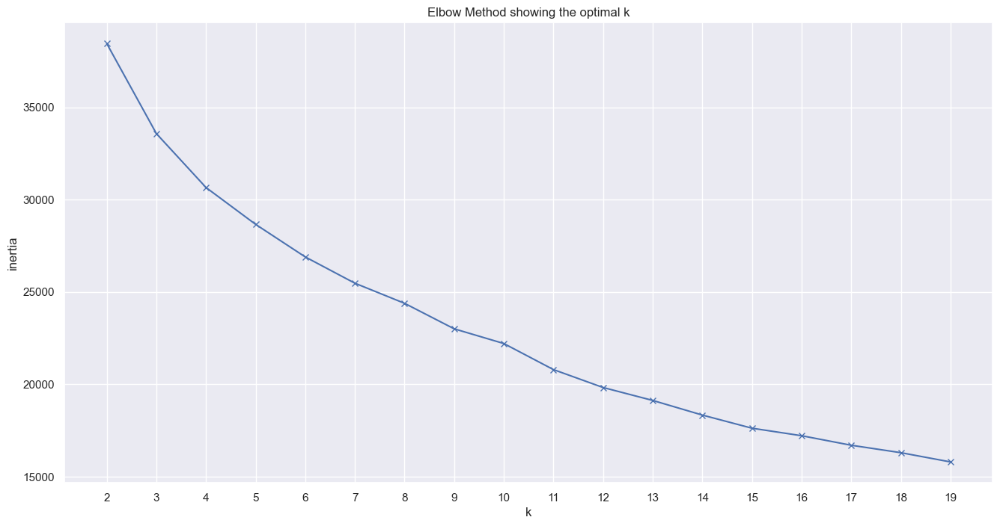

In [402]:
plt.figure(figsize=(16,8))
plt.plot(K,inertia,'bx-')
plt.xlabel('k')
plt.ylabel('inertia')
plt.xticks(np.arange(min(K),max(K)+1, 1.0))
plt.title('Elbow Method showing the optimal k')

Optimum Number of Clusters = 4   
Training the k-Means Clustering Model

In [404]:
kmeans = KMeans(n_clusters=4, random_state=42, verbose=1)
kmeans.fit(X)

Initialization complete
Iteration 0, inertia 45209.6835741478
Iteration 1, inertia 31553.28651396583
Iteration 2, inertia 31277.23072121435
Iteration 3, inertia 31171.115003035353
Iteration 4, inertia 31128.740824493514
Iteration 5, inertia 31109.65968932154
Iteration 6, inertia 31099.586296902038
Iteration 7, inertia 31091.494109210496
Iteration 8, inertia 31085.817105177022
Iteration 9, inertia 31083.942086978255
Iteration 10, inertia 31083.420670105086
Iteration 11, inertia 31083.165882873178
Iteration 12, inertia 31083.091592306973
Converged at iteration 12: strict convergence.
Initialization complete
Iteration 0, inertia 45747.327164464026
Iteration 1, inertia 36995.94472259062
Iteration 2, inertia 36141.599063291316
Iteration 3, inertia 35701.268424492526
Iteration 4, inertia 35471.6798637577
Iteration 5, inertia 35265.20034895862
Iteration 6, inertia 35128.23353564974
Iteration 7, inertia 34927.46577145742
Iteration 8, inertia 34603.52260823433
Iteration 9, inertia 34134.4976801

KMeans(n_clusters=4, random_state=42, verbose=1)

In [405]:
kmeans.inertia_

30654.214040980376

In [406]:
#Making predictions
clusters = kmeans.predict(X)

In [407]:
# Check the size of the clusters
pd.Series(clusters).value_counts().sort_index()

0    1542
1     345
2     434
3      39
dtype: int64

In [446]:
X.iloc[:, 0]

0       100.0
1       100.0
2       100.0
3       100.0
4       100.0
        ...  
2355     99.7
2356     99.8
2357     99.8
2358     99.9
2359    100.0
Name: access_to_electricity(%_of_population), Length: 2360, dtype: float64

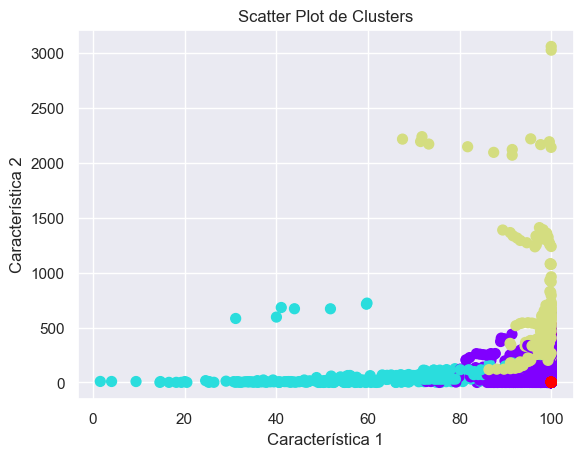

In [447]:
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=clusters, cmap='rainbow', marker='o', s=50)  # Ajusta las columnas de X según tus datos
plt.xlabel('Característica 1')
plt.ylabel('Característica 2')
plt.title('Scatter Plot de Clusters')

# Mostrar el gráfico
plt.show()

In [448]:
X.columns

Index(['access_to_electricity(%_of_population)',
       'renewable_electricity_generating_capacity_per_capita',
       'financial_flows_to_developing_countries(us$)',
       'electricity_from_nuclear(twh)',
       'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)',
       'renewables(%equivalent_primary_energy)', 'gdp_per_capita'],
      dtype='object')

In [408]:
# Explore the cluster assignment in the original dataset
X_df = pd.DataFrame(X)
X_df["cluster"] = clusters
X_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,cluster
0,-1.659221,0.430219,-1.698883,-0.451666,-0.303916,-0.972108,-0.237954,-0.231557,-0.240752,1.824784,-0.678869,-0.206113,-0.235817,-0.865341,0.810977,-0.806636,-0.347317,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
1,-1.493915,0.430219,-1.610001,-0.451666,-0.303916,-0.972108,-0.237977,-0.231557,-0.248803,1.807298,-0.689071,-0.276255,-0.235753,-0.865341,1.072824,-0.799449,-0.347317,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
2,-1.328610,0.430219,-1.505660,-0.451666,-0.303916,-0.972108,-0.237907,-0.231557,-0.249115,1.782005,-0.668144,-0.214881,-0.235182,-0.865341,0.342583,-0.792795,-0.347317,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
3,-1.163304,0.430219,-1.381998,-0.451666,-0.303916,-0.972108,-0.238047,-0.231557,-0.236297,1.857216,-0.634136,-0.302558,-0.234848,-0.865341,0.53

In [409]:
X_df[X_df['cluster']==0]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,cluster
0,-1.659221,0.430219,-1.698883,-0.451666,-0.303916,-0.972108,-0.237954,-0.231557,-0.240752,1.824784,-0.678869,-0.206113,-0.235817,-0.865341,0.810977,-0.806636,-0.347317,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
1,-1.493915,0.430219,-1.610001,-0.451666,-0.303916,-0.972108,-0.237977,-0.231557,-0.248803,1.807298,-0.689071,-0.276255,-0.235753,-0.865341,1.072824,-0.799449,-0.347317,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
2,-1.328610,0.430219,-1.505660,-0.451666,-0.303916,-0.972108,-0.237907,-0.231557,-0.249115,1.782005,-0.668144,-0.214881,-0.235182,-0.865341,0.342583,-0.792795,-0.347317,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
3,-1.163304,0.430219,-1.381998,-0.451666,-0.303916,-0.972108,-0.238047,-0.231557,-0.236297,1.857216,-0.634136,-0.302558,-0.234848,-0.865341,0.53

In [410]:
X_df[X_df['cluster']==1]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,cluster
763,-1.659221,-6.755135,-2.935508,-0.416814,-0.303805,1.102729,-0.237907,-0.231557,-0.273893,0.882865,-0.904892,-0.933833,-0.238412,-0.865341,-0.539223,-0.858887,-0.000622,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
764,-1.493915,-6.575405,-2.896863,-0.418175,-0.303197,1.130860,-0.238071,-0.231557,-0.272408,1.452682,-0.906594,-0.904607,-0.238445,-0.865341,-0.539223,-0.858887,-0.000622,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
765,-1.328610,-6.185809,-2.858219,-0.419649,-0.282084,0.772526,-0.237977,-0.231557,-0.271939,1.343914,-0.907268,-1.003975,-0.238122,-0.865341,-0.539223,-0.850565,-0.000622,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
766,-1.163304,-5.796597,-2.807981,-0.421086,-0.160378,0.718568,-0.237556,-0.231557,-0.271392,0.915129,-0.906773,-1.003975,-0.237917,-0.

## RAMDOM FOREST

In [418]:
df_all.shape

(2360, 21)

In [423]:
df_all_num.head()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,28748.0
1,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,28748.0
2,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,28748.0
3,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,28748.0
4,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,28748.0


In [426]:
df_all_cat.head(3)

,entity,density(P/km2),continent
0,Albania,105,Europe
1,Albania,105,Europe
2,Albania,105,Europe


In [428]:
df_num_r=df_all_num[['access_to_electricity(%_of_population)', 'renewable_electricity_generating_capacity_per_capita',	'financial_flows_to_developing_countries(us$)', 'electricity_from_nuclear(twh)', 'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)', 'renewables(%equivalent_primary_energy)', 'gdp_per_capita', 'primary_energy_consumption_per_capita(kwh/person)']]
df_num_r= df_num_r.reset_index()
df_num_r = df_num_r.drop(columns=['index'])
df_num_r

,access_to_electricity(%_of_population),renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),electricity_from_nuclear(twh),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita,primary_energy_consumption_per_capita(kwh/person)
0,100.0,0.00,0.0,0.0,4.13,0.000000,1126.683340,9029.4375
1,100.0,0.00,0.0,0.0,3.89,0.000000,1281.659826,8635.5320
2,100.0,0.00,0.0,0.0,4.10,0.000000,1425.124219,9443.5550
3,100.0,0.00,0.0,0.0,3.80,0.000000,1846.120121,10756.6120
4,100.0,0.00,0.0,0.0,3.96,0.000000,2373.581292,11586.9510
...,...,...,...,...,...,...,...,...
2355,99.7,929.73,69860000.0,0.0,2.82,30.744228,16715.633470,19814.2600
2356,99.8,1080.97,18290000.0,0.0,2.71,30.744228,18690.893840,19084.2480
2357,99.8,1078.68,18290000.0,0.0,2.79,30.744228,18703.860290,19538.7100
2358,99.9,1077.57,18290000.0,0.0,2.77,30.744228,17688.015010,19985.0100


In [430]:
#X-y split 
y=df_num_r['primary_energy_consumption_per_capita(kwh/person)']
X=df_num_r.drop(['primary_energy_consumption_per_capita(kwh/person)'],axis=1)

In [ ]:
df_all

In [377]:
scaler = StandardScaler()
df_all_num_normalized = scaler.fit_transform(df_all_num)

In [356]:
#To make this an unsupervised learning task, we will only use data.data, not data.target
X = pd.DataFrame(data['data'], columns = data['feature_names'])
X.info()


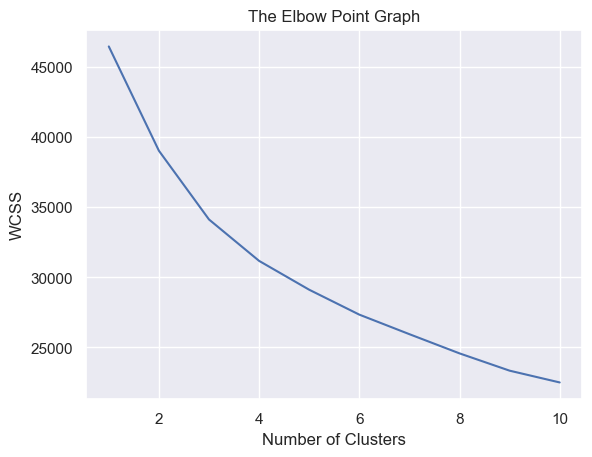

In [359]:
wcss = []

for i in range(1,11):
  kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
  kmeans.fit(df_combined)

  wcss.append(kmeans.inertia_)

sns.set()
plt.plot(range(1,11), wcss)
plt.title('The Elbow Point Graph')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [367]:
kmeans.labels_

array([2, 2, 2, ..., 1, 1, 1])

In [369]:
cluster_1_data = df_combined[Y == 0]
cluster_1_data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213
763,-1.659221,-6.755135,-2.935508,-0.416814,-0.303805,1.102729,-0.237907,-0.231557,-0.273893,0.882865,-0.904892,-0.933833,-0.238412,-0.865341,-0.539223,-0.858887,-0.000622,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
764,-1.493915,-6.575405,-2.896863,-0.418175,-0.303197,1.130860,-0.238071,-0.231557,-0.272408,1.452682,-0.906594,-0.904607,-0.238445,-0.865341,-0.539223,-0.858887,-0.000622,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
765,-1.328610,-6.185809,-2.858219,-0.419649,-0.282084,0.772526,-0.237977,-0.231557,-0.271939,1.343914,-0.907268,-1.003975,-0.238122,-0.865341,-0.539223,-0.850565,-0.000622,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
766,-1.163304,-5.796597,-2.807981,-0.421086,-0.160378,0.718568,-0.237556,-0.231557,-0.271392,0.915129,-0.906773,-1.003975,-0.237

In [417]:
cluster_1_data.shape

(338, 231)

## PREDICCION TARGET TIEMPO ARIMA

In [2]:
pip install pmdarima


     -------------------------------------- 572.7/572.7 kB 1.5 MB/s eta 0:00:00


In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sktime.forecasting.arima import AutoARIMA
from sktime.forecasting.base import ForecastingHorizon
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt

SyntaxError: invalid syntax (2719233352.py, line 19)

In [28]:
df_t = pd.read_csv("df_all.csv")
df_t.head()

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.00,38.20,0.0,0.0,0.00,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.000000,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.00,40.50,0.0,0.0,0.00,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.000000,8.293313,1281.659826,105,28748.0,Europe
2,Albania,2002,100.00,43.20,0.0,0.0,0.00,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.000000,4.536524,1425.124219,105,28748.0,Europe
3,Albania,2003,100.00,46.40,0.0,0.0,0.00,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.000000,5.528637,1846.120121,105,28748.0,Europe
4,Albania,2004,100.00,49.00,0.0,0.0,0.00,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.000000,5.514668,2373.581292,105,28748.0,Europe
5,Albania,2005,100.00,51.90,0.0,0.0,0.00,0.07,0.0,5.32,98.701300,11545.6160,3.75,4030.000210,0.000000,5.526424,2673.786584,105,28748.0,Europe
6,Albania,2006,100.00,54.80,0.0,0.0,0.00,0.09,0.0,4.95,98.214280,10976.7280,3.46,4010.000229,0.000000,5.902659,2972.742924,105,28748.0,Europe
7,Albania,2007,100.00,58.10,0.0,0.0,0.00,0.07,0.0,2.76,97.526505,9534.8740,3.12,4139.999866,0.000000,5.983260,3595.038057,105,28748.0,Europe
8,Albania,2008,100.00,60.80,0.0,0.0,0.00,0.07,0.0,3.76,98.172325,10499.3280,3.01,4079.999924,0.000000,7.500041,4370.539925,105,28748.0,Europe
9,Albania,2009,100.00,63.60,0.0,0.0,0.00,0.00,0.0,5.20,100.000000,11524.4280,2.98,4219.999790,0.000000,3.354289,4114.134899,105,28748.0,Europe


In [31]:
df_t.isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [ ]:
# Creating an empty table df_energy_all with the necessary columns and data types
columns = ['Year', 'Asia', 'Europe', 'Africa', 'North America', 'South America', 'Oceania']
df_energy = pd.DataFrame(columns=columns)
df_energy = df_energy.dropna()

KeyError: 'year'

In [34]:

# Create a function to automatically calculate the average value for the continent for the year
def filter_and_calculate_mean(df, year, column_name):
    row_data = {'Year': year}
    for continent in columns[1:]:
        filtered_df = df[(df['Year'] == year) & (df['continent'] == continent)]
        mean_value = filtered_df[column_name].mean()
        row_data[continent] = mean_value
    return row_data

column_name = 'primary_energy_consumption_per_capita(kwh/person)'
data_to_concat = []

for year in range(2000, 2021):
    row_data = filter_and_calculate_mean(df_energy, year, column_name)
    data_to_concat.append(row_data)

# Putting it all together
df_energy= pd.concat([df_energy, pd.DataFrame(data_to_concat)], ignore_index=True)

df_energy['Year'] = df_energy['Year'].astype('int64')

# Displaying the df_energy_all table for review
df_energy = df_energy.dropna()
df_energy.head(21)

SyntaxError: invalid syntax (2785943538.py, line 6)

In [35]:
import pandas as pd

columns = ['year', 'Asia', 'Europe', 'Africa', 'North America', 'South America', 'Oceania']
df_energy = pd.DataFrame(columns=columns)

# Create a function to automatically calculate the average value for the continent for the year
def filter_and_calculate_mean(df, year, column_name):
    row_data = {'Year': year}
    for continent in columns[1:]:
        filtered_df = df[(df['year'] == year)]
        mean_value = filtered_df[column_name].mean()
        row_data[continent] = mean_value
    return row_data

column_name = 'primary_energy_consumption_per_capita(kwh/person)'
data_to_concat = []

for year in range(2000, 2021):
    # En cada iteración, pasamos df_energy como argumento a la función filter_and_calculate_mean
    row_data = filter_and_calculate_mean(df_energy, year, column_name)
    data_to_concat.append(row_data)

# Putting it all together
df_energy = pd.concat([df_energy, pd.DataFrame(data_to_concat)], ignore_index=True)

df_energy['Year'] = df_energy['Year'].astype('int64')

# Displaying the df_energy_all table for review
df_energy = df_energy.dropna()
df_energy.head(21)

KeyError: 'primary_energy_consumption_per_capita(kwh/person)'

KeyError: 'Year'

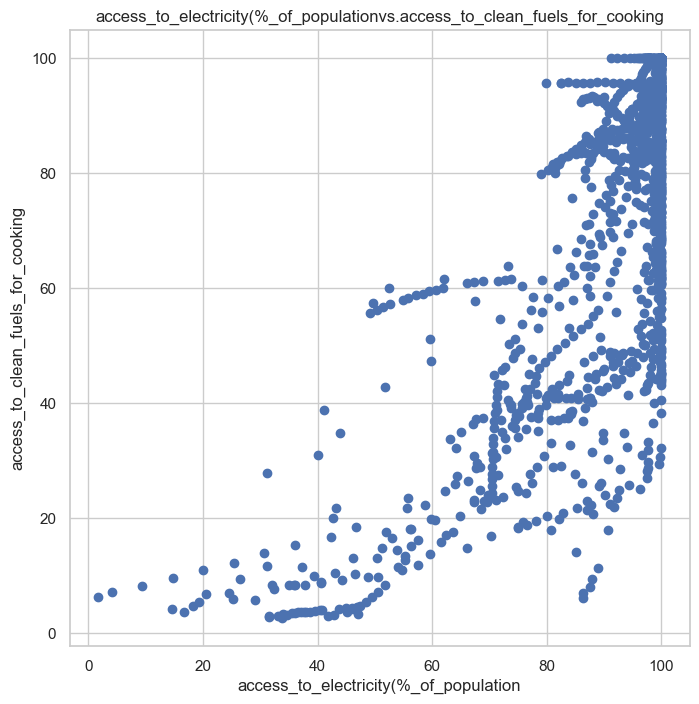

In [114]:
#Plot illustrating access_to_electricity(%_of_population) VS access_to_clean_fuels_for_cooking
plt.figure(figsize=(8, 8))
plt.scatter(df['access_to_electricity(%_of_population)'], df['access_to_clean_fuels_for_cooking'])
plt.title('access_to_electricity(%_of_population' "vs." 'access_to_clean_fuels_for_cooking')
plt.xlabel('access_to_electricity(%_of_population')
plt.ylabel('access_to_clean_fuels_for_cooking')
plt.show()

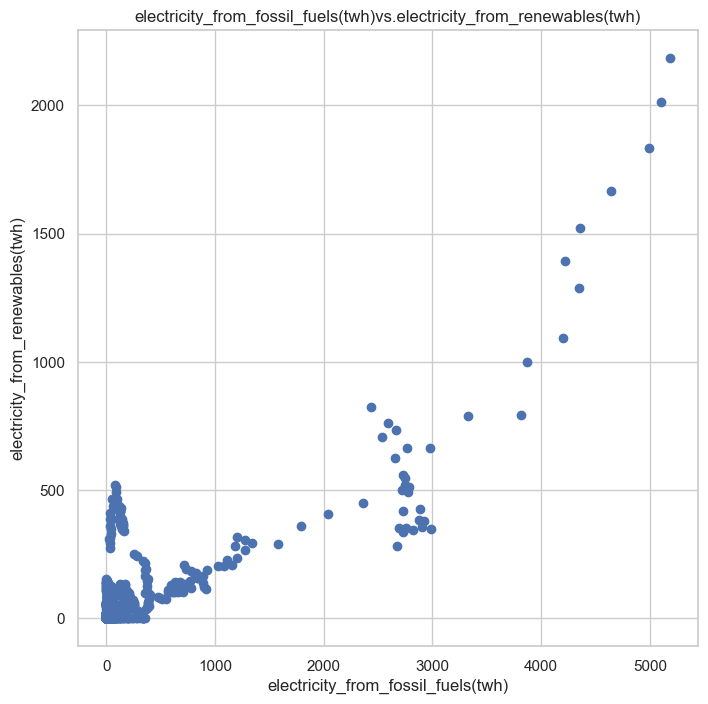

In [115]:
#Plot illustrating electricity_from_fossil_fuels(twh) vs electricity_from_renewables(twh)
plt.figure(figsize=(8, 8))
plt.scatter(df_all['electricity_from_fossil_fuels(twh)'], df_all['electricity_from_renewables(twh)'])
plt.title('electricity_from_fossil_fuels(twh)' "vs." 'electricity_from_renewables(twh)')
plt.xlabel('electricity_from_fossil_fuels(twh)')
plt.ylabel('electricity_from_renewables(twh)')
plt.show()

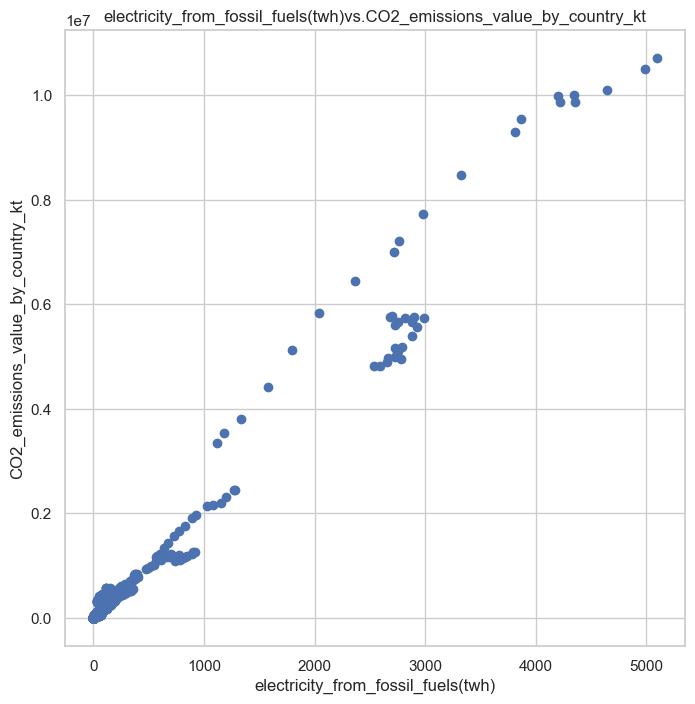

In [116]:
#Plot illustrating electricity_from_fossil_fuels(twh) vs CO2_emissions_value_by_country_kt)
plt.figure(figsize=(8, 8))
plt.scatter(df['electricity_from_fossil_fuels(twh)'], df['CO2_emissions_value_by_country_kt'])
plt.title('electricity_from_fossil_fuels(twh)' "vs." 'CO2_emissions_value_by_country_kt')
plt.xlabel('electricity_from_fossil_fuels(twh)')
plt.ylabel('CO2_emissions_value_by_country_kt')
plt.show()

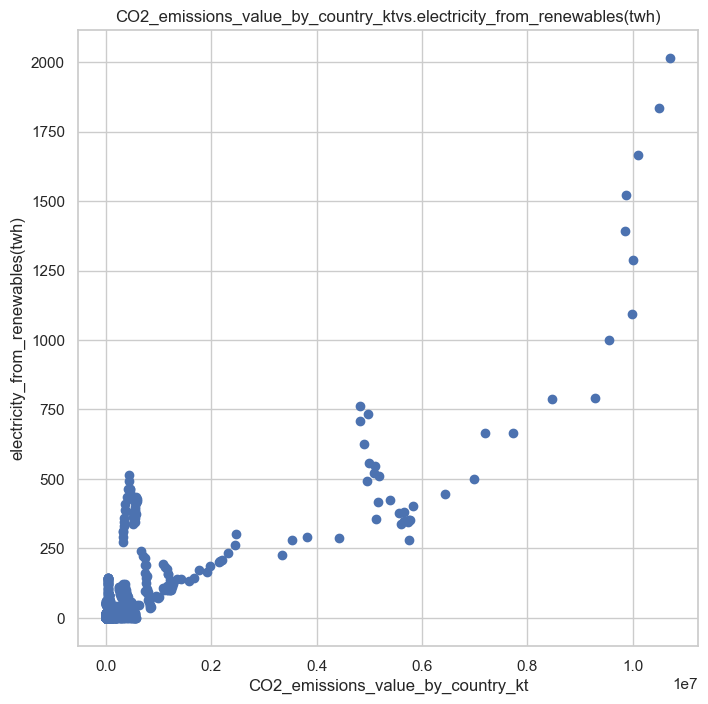

In [117]:
#Plot illustrating CO2_emissions_value_by_country_kt) vs electricity_from_renewables(twh)
plt.figure(figsize=(8, 8))
plt.scatter(df['CO2_emissions_value_by_country_kt'], df['electricity_from_renewables(twh)'])
plt.title('CO2_emissions_value_by_country_kt' "vs." 'electricity_from_renewables(twh)')
plt.xlabel('CO2_emissions_value_by_country_kt')
plt.ylabel('electricity_from_renewables(twh)')
plt.show()

#ENERGY CONSUMPTION

In [ ]:
# Function to plot features on world map
def plot_world_map(column_name):
    fig = go.Figure()
    for year in range(2000, 2021):
        # Filter the data for the current year
        filtered_df = df_all[df_all['year'] == year]

        # Create a choropleth trace for the current year
        trace = go.Choropleth(
            locations=filtered_df['entity'],
            z=filtered_df[column_name],
            locationmode='country names',
            colorscale='Electric',  # Use a different color scale for better contrast
            colorbar=dict(title=column_name),
            zmin=df[column_name].min(),
            zmax=df[column_name].max(),
            visible=False  # Set the trace to invisible initially
        )

        # Add the trace to the figure
        fig.add_trace(trace)

    # Set the first trace to visible
    fig.data[0].visible = True

    # Create animation steps
    steps = []
    for i in range(len(fig.data)):
        step = dict(
            method='update',
            args=[{'visible': [False] * len(fig.data)},  # Set all traces to invisible
                  {'title_text': f'{column_name} Map - {2000 + i}', 'frame': {'duration': 1000, 'redraw': True}}],
            label=str(2000 + i)  # Set the label for each step
        )
        step['args'][0]['visible'][i] = True  # Set the current trace to visible
        steps.append(step)

    # Create the slider
    sliders = [dict(
        active=0,
        steps=steps,
        currentvalue={"prefix": "Year: ", "font": {"size": 14}},  # Increase font size for slider label
    )]

    # Update the layout of the figure with increased size and change the template
    fig.update_layout(
        title_text=f'{column_name}',  # Set the initial title
        title_font_size=24,  # Increase title font size
        title_x=0.5,  # Center the title
        geo=dict(
            showframe=True,
            showcoastlines=True,
            projection_type='natural earth'
        ),
        sliders=sliders,
        height=500,  # Set the height of the figure in pixels
        width=1000,  # Set the width of the figure in pixels
        font=dict(family='Arial', size=12),  # Customize font family and size for the whole figure
        margin=dict(t=80, l=50, r=50, b=50),  # Add margin for better layout spacing
        template='plotly_dark',  # Change the template to 'plotly_dark'
    )

    # Show the figure
    fig.show()

In [ ]:
column_name = 'access_to_clean_fuels_for_cooking'
plot_world_map(column_name)

In [ ]:
column_name = 'CO2_emissions_value_by_country_kt'
plot_world_map(column_name)

In [ ]:
column_name = 'primary_energy_consumption_per_capita(kwh/person)'
plot_world_map(column_name)

In [ ]:
column_name = 'electricity_from_renewables(twh)'
plot_world_map(column_name)   #no aprece nada en Europa y Afric

In [ ]:
column_name = 'renewable_energy_share_in_the_total_final_energy_consumption(%)'
plot_world_map(column_name)